# Predictive Analysis of Sea Surface Currents Velocity 'u' (East-West)

This Notebook is an analysis and prediction of sea surface currents (SSC) velocity using an LSTM Model. The primary focus is on processing, visualizing, and predicting based on historical sea surface current data. This pipeline aims to provide a comprehensive workflow from data processing to real-life future predictions, facilitating deeper insights into sea surface currents and their potential impacts.

## Overview
- **Data Preparation**: Loading and cleaning of time-series data from NetCDF files to create a structured dataset suitable for analysis.
- **Geospatial Visualization**: Mapping sea surface current data and identify areas of interest.
- **Data Filtering**: Narrowing down the dataset to focus on specific geographic regions and time frames for detailed analysis.
- **Predictive Modeling**: Developing LSTM models to forecast future sea surface current velocities based on historical data.
- **Evaluation**: Comparing predicted values against actual data to assess the accuracy and effectiveness of the models.
- **Output**: Aggregating all predictions and converting them into a format suitable for further analysis or integration into a Lagrangian Model.

### Import Necessary Libraries

In [2]:
import xarray as xr
import pandas as pd
import numpy as np
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.patches as mpatches
import matplotlib.path as mpath
import os
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.preprocessing.sequence import TimeseriesGenerator
from sklearn.metrics import mean_absolute_error, mean_squared_error
from keras.models import Sequential
from keras.layers import LSTM, Dropout, Dense
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.losses import MeanSquaredError
from keras.optimizers import Adam
from keras.metrics import MeanAbsoluteError
from keras.models import load_model

### Suppress Future Warnings

In [3]:
import warnings

# Ignore future warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

### Importing & Opening the Data

Load and open the sea surface current dataset for subsequent analysis and modeling. This file has hourly data from 1st January 2020 till 1st August 2023

In [5]:
# Load the dataset
netcdf_file_path = "Data/model_IO/final_SSC_Data.nc"

# Open the dataset
dataset = xr.open_dataset(netcdf_file_path)

### Data Preparation 

1. **Conversion and Index Resetting**: The dataset is converted to a Pandas DataFrame and the index is reset.
2. **Column Removal**: Unnecessary columns ('stdu', 'stdv', 'cov', 'velo', 'head') that are not needed are removed.
3. **NaN Value Removal**: Rows containing NaN values in the 'u' and 'v' columns are removed.
4. **Datetime Conversion**: The 'time' column is converted to a datetime format.
5. **Display**: Finally, the cleaned DataFrame is displayed to verify the successful preprocessing steps.

In [6]:
# Convert the dataset to a pandas DataFrame and reset the index 
df = dataset.to_dataframe().reset_index()

# Drop unnecessary columns from the DataFrame that are not needed
df = df.drop(columns=['stdu', 'stdv', 'cov', 'velo', 'head'])

# Drop rows with NaN values in 'u' and 'v' columns to ensure data integrity for analysis
df.dropna(subset=['u', 'v'],inplace=True)

# Convert the 'time' column to datetime format for time series analysis
df.index = pd.to_datetime(df['time'], format='%d-%m-%Y %H:%M:%S')

# Display the DataFrame
df

,time,lat,lon,u,v
time,,,,,
2020-02-25 15:00:00,2020-02-25 15:00:00,35.900600,14.5692,0.224436,-0.204129
2020-02-25 15:00:00,2020-02-25 15:00:00,35.900600,14.6097,0.225030,-0.220144
2020-02-25 15:00:00,2020-02-25 15:00:00,35.900600,14.6503,0.219380,-0.229340
2020-02-25 15:00:00,2020-02-25 15:00:00,35.900600,14.6908,0.192193,-0.223198
2020-02-25 15:00:00,2020-02-25 15:00:00,35.900600,15.0965,-0.088404,-0.160217
...,...,...,...,...,...
2023-08-01 23:00:00,2023-08-01 23:00:00,36.880199,14.0419,-0.179297,-0.109355
2023-08-01 23:00:00,2023-08-01 23:00:00,36.880199,14.0824,-0.187970,-0.150195
2023-08-01 23:00:00,2023-08-01 23:00:00,36.880199,14.1230,-0.184672,-0.175530


### Geospatial Visualization

- **Boundaries & Interest Area**: Set the coordinates for the specific geographic boundaries and a polygon to highlight key area on the map.
- **Map Setup**: Initialize a map with features like land, coastlines, and borders for context.
- **Data Points**: Plot data points within the set boundaries to visualize the distribution of sea surface currents.
- **Highlight Area**: Draw a red polygon to emphasize the area of interest on the map.

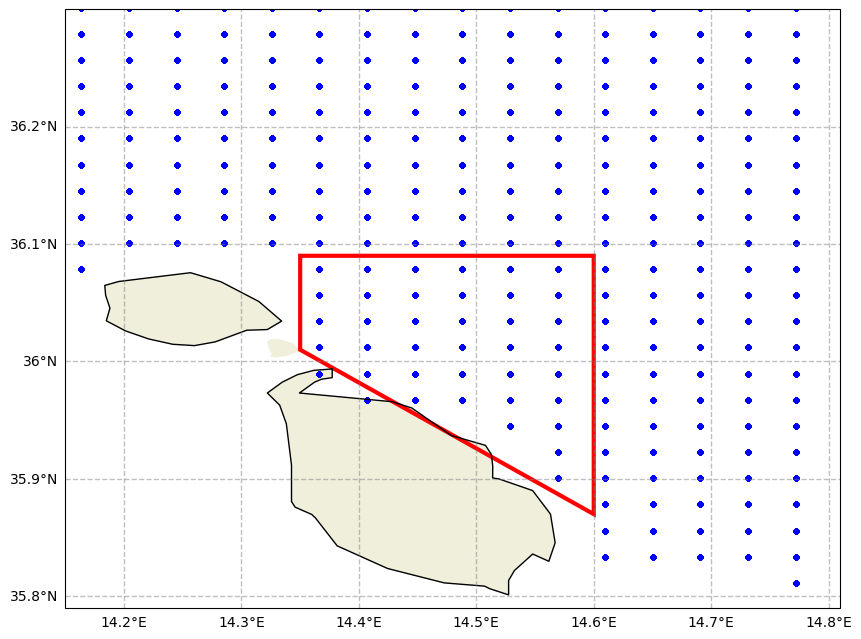

In [7]:
# Define the boundaries for the map 
boundaries = {
    'min_lon': 14.15,  
    'max_lon': 14.81,  
    'min_lat': 35.79,  
    'max_lat': 36.3    
}

# Define the vertices of a polygon to highlight a specific area on the map
polygon_coordinates = [
    (14.6, 35.87),
    (14.35, 36.01),
    (14.35, 36.09),
    (14.6, 36.09),
    (14.6, 35.87)
]

# Initialize a matplotlib figure with Cartopy for data visualization
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw={'projection': ccrs.PlateCarree()})

# Set the viewing extent of the map using the defined boundaries
ax.set_extent([boundaries['min_lon'], boundaries['max_lon'], boundaries['min_lat'], boundaries['max_lat']], crs=ccrs.PlateCarree())

# Add features to the map for land, coastlines, and country borders for context
ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')

# Plot all data points from the dataframe within the defined geographic boundaries
ax.scatter(df['lon'], df['lat'], s=10, color='blue', marker='o', alpha=0.5, transform=ccrs.Geodetic())

# Draw a red polygon using the defined coordinates to highlight a specific area on the map
red_polygon = mpatches.Polygon(polygon_coordinates, closed=True, edgecolor='red', facecolor='none', linewidth=3, transform=ccrs.Geodetic())
ax.add_patch(red_polygon)

# Add gridlines to the map
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False

# Display the plot
plt.show()

### Geospatial Filtering

Filter the dataset to focus on the area of interest:

- **Filtering**: Apply the polygon as a filter to select only data points located inside this area.
- **Visualization**: Plot the filtered data on a map to visually confirm the focus area, marking points within the polygon in red for clarity.
- **Map Features**: Enhance the map with features like land, coastlines, and borders for better context.
- **Final View**: Display the map with the filtered points.

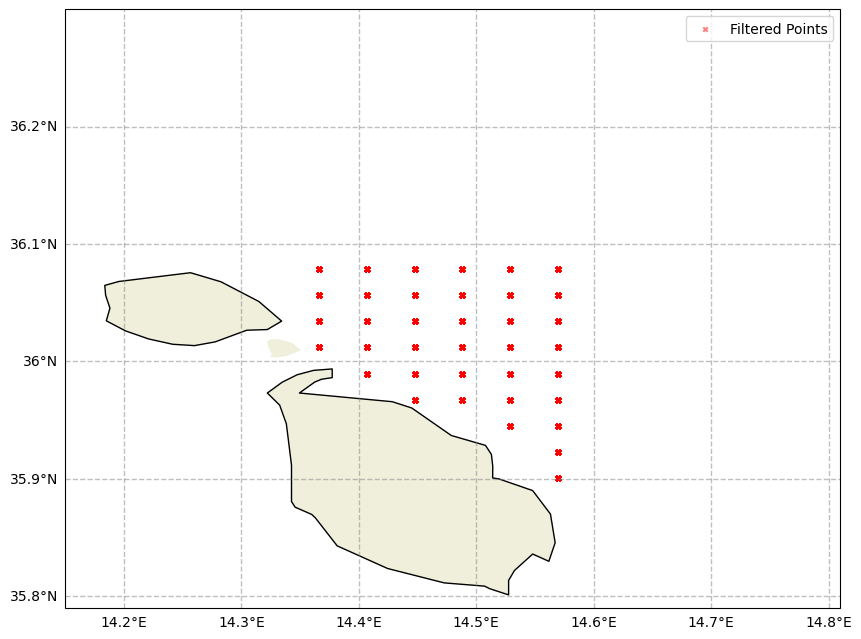

In [8]:
# Convert the list of polygon coordinates to a Path object
polygon_path = mpath.Path(polygon_coordinates)

# Use the Path object to filter points in the DataFrame that lie inside the polygon
inside_polygon = df.apply(lambda row: polygon_path.contains_point((row['lon'], row['lat'])), axis=1)
df_inside_polygon = df[inside_polygon]

# Initialize a new matplotlib figure with Cartopy for mapping, specifying the projection
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw={'projection': ccrs.PlateCarree()})

# Set the extent of the map to the defined geographic boundaries
ax.set_extent([boundaries['min_lon'], boundaries['max_lon'], boundaries['min_lat'], boundaries['max_lat']], crs=ccrs.PlateCarree())

# Add land, coastlines, and country borders to the map 
ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')

# Plot the points that are located within the defined polygon in red
scatter = ax.scatter(df_inside_polygon['lon'], df_inside_polygon['lat'], s=10, color='red', marker='x', alpha=0.5, transform=ccrs.Geodetic(), label='Filtered Points')

# Add gridlines and labels to the map
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=1, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False

# Add a legend to the plot to explain the red "X" markers
ax.legend(handles=[scatter], loc='upper right')

# Display the plot
plt.show()

### Selecting the coordinates inside the polygon

Identify and processes data points located within the selected area:

- **Path Creation**: Transform the polygon coordinates into a Path object for spatial filtering.
- **Coordinate Pairing**: Combine 'lon' and 'lat' from the DataFrame into coordinate tuples.
- **Spatial Filtering**: Apply the Path object to select only points inside the polygon.
- **Duplicate Removal**: Eliminate duplicate points to ensure unique data entries.
- **Count and Display**: Calculate and print the total number of unique points inside the polygon, along with their coordinates.

In [9]:
# Convert the polygon coordinates to a Path object 
polygon_path = mpath.Path(polygon_coordinates)

# Combine longitude and latitude columns from the DataFrame into a list of tuples for each point
coordinates = list(zip(df['lon'], df['lat']))

# Create a mask to identify which points fall within the defined polygon by checking each point
inside_mask = [polygon_path.contains_point(coord) for coord in coordinates]

# Use the mask to filter the DataFrame, keeping only points that are inside the polygon
df_inside_polygon = df[inside_mask]

# Remove potential duplicate entries based on their longitude and latitude
df_inside_polygon = df_inside_polygon.drop_duplicates(subset=['lon', 'lat'])

# Calculate the number of unique points found inside the polygon
num_points_inside_polygon = df_inside_polygon.shape[0]
print(f"Total number of points inside the polygon: {num_points_inside_polygon}\n")
print("Coordinates of the points inside the polygon:")

# Iterate over each coordinate pair inside the polygon and print them out
coordinates_inside = df_inside_polygon[['lon', 'lat']].values
for lon, lat in coordinates_inside:
    print(f"({lon}, {lat})")

Total number of points inside the polygon: 37

Coordinates of the points inside the polygon:
(14.569199562072754, 35.90060043334961)
(14.569199562072754, 35.92279815673828)
(14.569199562072754, 35.945098876953125)
(14.528599739074707, 35.96730041503906)
(14.569199562072754, 35.96730041503906)
(14.447500228881836, 35.989601135253906)
(14.48799991607666, 35.989601135253906)
(14.528599739074707, 35.989601135253906)
(14.569199562072754, 35.989601135253906)
(14.447500228881836, 36.01190185546875)
(14.48799991607666, 36.01190185546875)
(14.528599739074707, 36.01190185546875)
(14.569199562072754, 36.01190185546875)
(14.447500228881836, 36.03409957885742)
(14.48799991607666, 36.03409957885742)
(14.528599739074707, 36.03409957885742)
(14.569199562072754, 36.03409957885742)
(14.447500228881836, 36.056400299072266)
(14.48799991607666, 36.056400299072266)
(14.528599739074707, 36.056400299072266)
(14.569199562072754, 36.056400299072266)
(14.366399765014648, 36.07870101928711)
(14.406900405883789, 3

### Create a Data Frame for the coordinates inside the polygon

In [10]:
# Convert 'inside_mask' to a pandas Series to use as a boolean indexer
inside_series = pd.Series(inside_mask, index=df.index)

# Filter the original DataFrame using the boolean Series
final_df = df[inside_series]

# Display the final DataFrame
final_df

,time,lat,lon,u,v
time,,,,,
2020-02-25 15:00:00,2020-02-25 15:00:00,35.900600,14.5692,0.224436,-0.204129
2020-02-25 15:00:00,2020-02-25 15:00:00,35.922798,14.5692,0.209744,-0.180382
2020-02-25 15:00:00,2020-02-25 15:00:00,35.945099,14.5692,0.165433,-0.158304
2020-02-25 15:00:00,2020-02-25 15:00:00,35.967300,14.5286,0.139062,-0.155931
2020-02-25 15:00:00,2020-02-25 15:00:00,35.967300,14.5692,0.162474,-0.140758
...,...,...,...,...,...
2023-08-01 23:00:00,2023-08-01 23:00:00,36.078701,14.4069,0.148599,-0.234722
2023-08-01 23:00:00,2023-08-01 23:00:00,36.078701,14.4475,0.153244,-0.216512
2023-08-01 23:00:00,2023-08-01 23:00:00,36.078701,14.4880,0.165081,-0.183771


### Data Extraction for Selected Coordinates

Extracting and saving specific sea surface current data for predefined locations within our area of interest:

- **Selected Coordinates**: List the specific latitude and longitude pairs.
- **Data Extraction**: For each pair, filter the main dataset to obtain the relevant data points.
- **File Saving**: Convert latitude and longitude to a format suitable for filenames and save the data as CSV files.

Each data point's latitude and longitude are converted to remove decimal points, ensuring valid filenames. This process results in a set of CSV files, each corresponding to a unique location within the selected polygon.

In [11]:
# Directory to save the files
save_directory = "Data/coordinate_data_frames"
os.makedirs(save_directory, exist_ok=True)

# Coordinates of the points inside the polygon
coordinates_inside = [
    (14.569199562072754, 35.90060043334961),
    (14.569199562072754, 35.92279815673828),
    (14.569199562072754, 35.945098876953125),
    (14.528599739074707, 35.96730041503906),
    (14.569199562072754, 35.96730041503906),
    (14.447500228881836, 35.989601135253906),
    (14.48799991607666, 35.989601135253906),
    (14.528599739074707, 35.989601135253906),
    (14.569199562072754, 35.989601135253906),
    (14.447500228881836, 36.01190185546875),
    (14.48799991607666, 36.01190185546875),
    (14.528599739074707, 36.01190185546875),
    (14.569199562072754, 36.01190185546875),
    (14.447500228881836, 36.03409957885742),
    (14.48799991607666, 36.03409957885742),
    (14.528599739074707, 36.03409957885742),
    (14.569199562072754, 36.03409957885742),
    (14.447500228881836, 36.056400299072266),
    (14.48799991607666, 36.056400299072266),
    (14.528599739074707, 36.056400299072266),
    (14.569199562072754, 36.056400299072266),
    (14.366399765014648, 36.07870101928711),
    (14.406900405883789, 36.07870101928711),
    (14.447500228881836, 36.07870101928711),
    (14.48799991607666, 36.07870101928711),
    (14.528599739074707, 36.07870101928711),
    (14.569199562072754, 36.07870101928711),
    (14.528599739074707, 35.945098876953125),
    (14.406900405883789, 36.03409957885742),
    (14.406900405883789, 36.056400299072266),
    (14.406900405883789, 36.01190185546875),
    (14.366399765014648, 36.03409957885742),
    (14.366399765014648, 36.056400299072266),
    (14.48799991607666, 35.96730041503906),
    (14.406900405883789, 35.989601135253906,),
    (14.366399765014648, 36.01190185546875),
    (14.447500228881836, 35.96730041503906)
]

# Loop through each pair of coordinates along with an index
for index, (lon, lat) in enumerate(coordinates_inside, start=1):
    # Print the current pair being processed
    print(f"Processing pair {index}: (lat: {lat}, lon: {lon})")

    # Filter the DataFrame for the exact coordinates
    df_point = final_df[(final_df['lat'] == lat) & (final_df['lon'] == lon)]

    # Check if any data points were found for the current pair
    if df_point.empty:
        print(f"No data points found for (lat: {lat}, lon: {lon})")
    else:
        print(f"Found {df_point.shape[0]} data points for (lat: {lat}, lon: {lon})")

    # Format the latitude and longitude to remove decimal points and replace with underscores
    lat_formatted = str(lat).replace('.', '_')
    lon_formatted = str(lon).replace('.', '_')

    # Create a unique filename for each pair of coordinates
    filename = f"{index}_{lat_formatted}_{lon_formatted}.csv"
    filepath = os.path.join(save_directory, filename)

    # Save the filtered DataFrame to a CSV file
    df_point.to_csv(filepath, index=False)

    # Confirm that the file has been saved
    print(f"Saved data for (lat: {lat}, lon: {lon}) as {filename}\n")

print("All data processing complete.")
print("="*175)

Processing pair 1: (lat: 35.90060043334961, lon: 14.569199562072754)
Found 6694 data points for (lat: 35.90060043334961, lon: 14.569199562072754)
Saved data for (lat: 35.90060043334961, lon: 14.569199562072754) as 1_35_90060043334961_14_569199562072754.csv

Processing pair 2: (lat: 35.92279815673828, lon: 14.569199562072754)
Found 6804 data points for (lat: 35.92279815673828, lon: 14.569199562072754)
Saved data for (lat: 35.92279815673828, lon: 14.569199562072754) as 2_35_92279815673828_14_569199562072754.csv

Processing pair 3: (lat: 35.945098876953125, lon: 14.569199562072754)
Found 8293 data points for (lat: 35.945098876953125, lon: 14.569199562072754)
Saved data for (lat: 35.945098876953125, lon: 14.569199562072754) as 3_35_945098876953125_14_569199562072754.csv

Processing pair 4: (lat: 35.96730041503906, lon: 14.528599739074707)
Found 9458 data points for (lat: 35.96730041503906, lon: 14.528599739074707)
Saved data for (lat: 35.96730041503906, lon: 14.528599739074707) as 4_35_967

### Model Preparation, Training & Evaluation

- **Model Storage**: Set up a directory to save the trained models.
- **Data Preparation**: List and load all coordinate-specific CSV files that were prepared earlier.
- **Feature Selection**: For each dataset, 'u' and 'v' values are chosen as features with 'u' set as the target variable.
- **Time Series Generation**: Construct time series generators, utilizing the last 72 hours (3 days) of data to predict the 'u' value for the next hour. This historical data frame helps the model understand temporal patterns.
- **Early Stopping**: Integrate early stopping to halt training when the validation loss stops improving, preventing overfitting and saving computational resources.
- **Model Architecture**: Build the LSTM (Long Short-Term Memory) network. The model architecture includes several layers with dropout rates to manage overfitting.
- **Training Process**: Train the model on the generated time series data, monitoring both training and validation metrics.
- **Prediction and Evaluation**:
    - **Prediction**: After training, apply the model to the test set to forecast future 'u' values.
    - **Evaluation Metrics**: Use three key metrics to evaluate model performance:
        - **Mean Squared Error (MSE)**: Represents the average of the squares of the errors between actual and predicted values. Lower values indicate better performance.
        - **Mean Absolute Error (MAE)**: Measures the average magnitude of errors between pairs of actual and predicted values, without considering their direction. Lower MAE values signify better accuracy.
        - **Root Mean Squared Error (RMSE)**: The square root of MSE, providing error metrics in the same units as the data, making interpretation straightforward. Lower RMSE values denote better fit.
    - **Visualization**: Plot actual vs. predicted 'u' values to visually assess the model's prediction accuracy and understand its real-world applicability.

['1_35_90060043334961_14_569199562072754.csv', '2_35_92279815673828_14_569199562072754.csv', '3_35_945098876953125_14_569199562072754.csv', '4_35_96730041503906_14_528599739074707.csv', '5_35_96730041503906_14_569199562072754.csv', '6_35_989601135253906_14_447500228881836.csv', '7_35_989601135253906_14_48799991607666.csv', '8_35_989601135253906_14_528599739074707.csv', '9_35_989601135253906_14_569199562072754.csv', '10_36_01190185546875_14_447500228881836.csv', '11_36_01190185546875_14_48799991607666.csv', '12_36_01190185546875_14_528599739074707.csv', '13_36_01190185546875_14_569199562072754.csv', '14_36_03409957885742_14_447500228881836.csv', '15_36_03409957885742_14_48799991607666.csv', '16_36_03409957885742_14_528599739074707.csv', '17_36_03409957885742_14_569199562072754.csv', '18_36_056400299072266_14_447500228881836.csv', '19_36_056400299072266_14_48799991607666.csv', '20_36_056400299072266_14_528599739074707.csv', '21_36_056400299072266_14_569199562072754.csv', '22_36_078701019

C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)



Epoch 1/100

73/73 [==============================] - ETA: 0s - loss: 0.0124 - mean_absolute_error: 0.0881INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


73/73 [==============================] - 40s 454ms/step - loss: 0.0124 - mean_absolute_error: 0.0881 - val_loss: 0.0172 - val_mean_absolute_error: 0.1006
Epoch 2/100
73/73 [==============================] - ETA: 0s - loss: 0.0115 - mean_absolute_error: 0.0853INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


73/73 [==============================] - 30s 412ms/step - loss: 0.0115 - mean_absolute_error: 0.0853 - val_loss: 0.0140 - val_mean_absolute_error: 0.0901
Epoch 3/100
73/73 [==============================] - ETA: 0s - loss: 0.0108 - mean_absolute_error: 0.0828INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


73/73 [==============================] - 32s 437ms/step - loss: 0.0108 - mean_absolute_error: 0.0828 - val_loss: 0.0128 - val_mean_absolute_error: 0.0857
Epoch 4/100
73/73 [==============================] - ETA: 0s - loss: 0.0099 - mean_absolute_error: 0.0781INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


73/73 [==============================] - 33s 456ms/step - loss: 0.0099 - mean_absolute_error: 0.0781 - val_loss: 0.0110 - val_mean_absolute_error: 0.0784
Epoch 5/100
73/73 [==============================] - ETA: 0s - loss: 0.0079 - mean_absolute_error: 0.0688INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


73/73 [==============================] - 32s 443ms/step - loss: 0.0079 - mean_absolute_error: 0.0688 - val_loss: 0.0088 - val_mean_absolute_error: 0.0666
Epoch 6/100
73/73 [==============================] - ETA: 0s - loss: 0.0064 - mean_absolute_error: 0.0600INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


73/73 [==============================] - 32s 438ms/step - loss: 0.0064 - mean_absolute_error: 0.0600 - val_loss: 0.0068 - val_mean_absolute_error: 0.0573
Epoch 7/100
73/73 [==============================] - ETA: 0s - loss: 0.0052 - mean_absolute_error: 0.0532INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


73/73 [==============================] - 31s 433ms/step - loss: 0.0052 - mean_absolute_error: 0.0532 - val_loss: 0.0053 - val_mean_absolute_error: 0.0477
Epoch 8/100
73/73 [==============================] - ETA: 0s - loss: 0.0045 - mean_absolute_error: 0.0485INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


73/73 [==============================] - 32s 443ms/step - loss: 0.0045 - mean_absolute_error: 0.0485 - val_loss: 0.0049 - val_mean_absolute_error: 0.0442
Epoch 9/100
73/73 [==============================] - ETA: 0s - loss: 0.0042 - mean_absolute_error: 0.0458INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


73/73 [==============================] - 33s 456ms/step - loss: 0.0042 - mean_absolute_error: 0.0458 - val_loss: 0.0047 - val_mean_absolute_error: 0.0421
Epoch 10/100
73/73 [==============================] - ETA: 0s - loss: 0.0040 - mean_absolute_error: 0.0448INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


73/73 [==============================] - 34s 466ms/step - loss: 0.0040 - mean_absolute_error: 0.0448 - val_loss: 0.0045 - val_mean_absolute_error: 0.0408
Epoch 11/100
73/73 [==============================] - ETA: 0s - loss: 0.0037 - mean_absolute_error: 0.0418INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


73/73 [==============================] - 35s 476ms/step - loss: 0.0037 - mean_absolute_error: 0.0418 - val_loss: 0.0044 - val_mean_absolute_error: 0.0399
Epoch 12/100
73/73 [==============================] - ETA: 0s - loss: 0.0037 - mean_absolute_error: 0.0417INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


73/73 [==============================] - 46s 628ms/step - loss: 0.0037 - mean_absolute_error: 0.0417 - val_loss: 0.0043 - val_mean_absolute_error: 0.0393
Epoch 13/100
73/73 [==============================] - ETA: 0s - loss: 0.0036 - mean_absolute_error: 0.0410INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


73/73 [==============================] - 37s 508ms/step - loss: 0.0036 - mean_absolute_error: 0.0410 - val_loss: 0.0043 - val_mean_absolute_error: 0.0398
Epoch 14/100
73/73 [==============================] - 25s 337ms/step - loss: 0.0035 - mean_absolute_error: 0.0403 - val_loss: 0.0044 - val_mean_absolute_error: 0.0389
Epoch 15/100
73/73 [==============================] - 24s 333ms/step - loss: 0.0039 - mean_absolute_error: 0.0431 - val_loss: 0.0044 - val_mean_absolute_error: 0.0388
Epoch 16/100
73/73 [==============================] - ETA: 0s - loss: 0.0036 - mean_absolute_error: 0.0407INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


73/73 [==============================] - 34s 472ms/step - loss: 0.0036 - mean_absolute_error: 0.0407 - val_loss: 0.0043 - val_mean_absolute_error: 0.0387
Epoch 17/100
73/73 [==============================] - 28s 380ms/step - loss: 0.0036 - mean_absolute_error: 0.0414 - val_loss: 0.0043 - val_mean_absolute_error: 0.0383
Epoch 18/100
73/73 [==============================] - 27s 369ms/step - loss: 0.0034 - mean_absolute_error: 0.0399 - val_loss: 0.0044 - val_mean_absolute_error: 0.0390
Epoch 19/100
73/73 [==============================] - ETA: 0s - loss: 0.0035 - mean_absolute_error: 0.0401INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


73/73 [==============================] - 39s 531ms/step - loss: 0.0035 - mean_absolute_error: 0.0401 - val_loss: 0.0042 - val_mean_absolute_error: 0.0377
Epoch 20/100
73/73 [==============================] - 31s 426ms/step - loss: 0.0034 - mean_absolute_error: 0.0397 - val_loss: 0.0043 - val_mean_absolute_error: 0.0383
Epoch 21/100
73/73 [==============================] - 29s 398ms/step - loss: 0.0035 - mean_absolute_error: 0.0404 - val_loss: 0.0045 - val_mean_absolute_error: 0.0395
Epoch 22/100
73/73 [==============================] - 30s 406ms/step - loss: 0.0036 - mean_absolute_error: 0.0406 - val_loss: 0.0044 - val_mean_absolute_error: 0.0381
Epoch 23/100
73/73 [==============================] - ETA: 0s - loss: 0.0033 - mean_absolute_error: 0.0387INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


73/73 [==============================] - 42s 580ms/step - loss: 0.0033 - mean_absolute_error: 0.0387 - val_loss: 0.0041 - val_mean_absolute_error: 0.0372
Epoch 24/100
73/73 [==============================] - 42s 578ms/step - loss: 0.0033 - mean_absolute_error: 0.0390 - val_loss: 0.0043 - val_mean_absolute_error: 0.0379
Epoch 25/100
73/73 [==============================] - 40s 546ms/step - loss: 0.0034 - mean_absolute_error: 0.0395 - val_loss: 0.0042 - val_mean_absolute_error: 0.0370
Epoch 26/100
73/73 [==============================] - ETA: 0s - loss: 0.0033 - mean_absolute_error: 0.0385INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


73/73 [==============================] - 49s 677ms/step - loss: 0.0033 - mean_absolute_error: 0.0385 - val_loss: 0.0041 - val_mean_absolute_error: 0.0371
Epoch 27/100
73/73 [==============================] - ETA: 0s - loss: 0.0031 - mean_absolute_error: 0.0380INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\1_35_90060043334961_14_569199562072754\assets


73/73 [==============================] - 58s 795ms/step - loss: 0.0031 - mean_absolute_error: 0.0380 - val_loss: 0.0041 - val_mean_absolute_error: 0.0368
Epoch 28/100
73/73 [==============================] - 34s 466ms/step - loss: 0.0033 - mean_absolute_error: 0.0393 - val_loss: 0.0043 - val_mean_absolute_error: 0.0391
Epoch 29/100
73/73 [==============================] - 32s 441ms/step - loss: 0.0034 - mean_absolute_error: 0.0401 - val_loss: 0.0041 - val_mean_absolute_error: 0.0377
Epoch 30/100
73/73 [==============================] - 33s 455ms/step - loss: 0.0033 - mean_absolute_error: 0.0387 - val_loss: 0.0041 - val_mean_absolute_error: 0.0373
Epoch 31/100
73/73 [==============================] - 33s 446ms/step - loss: 0.0032 - mean_absolute_error: 0.0380 - val_loss: 0.0043 - val_mean_absolute_error: 0.0392
Epoch 32/100
73/73 [==============================] - 33s 447ms/step - loss: 0.0031 - mean_absolute_error: 0.0380 - val_loss: 0.0042 - val_mean_absolute_error: 0.0388
Epoch 33/10

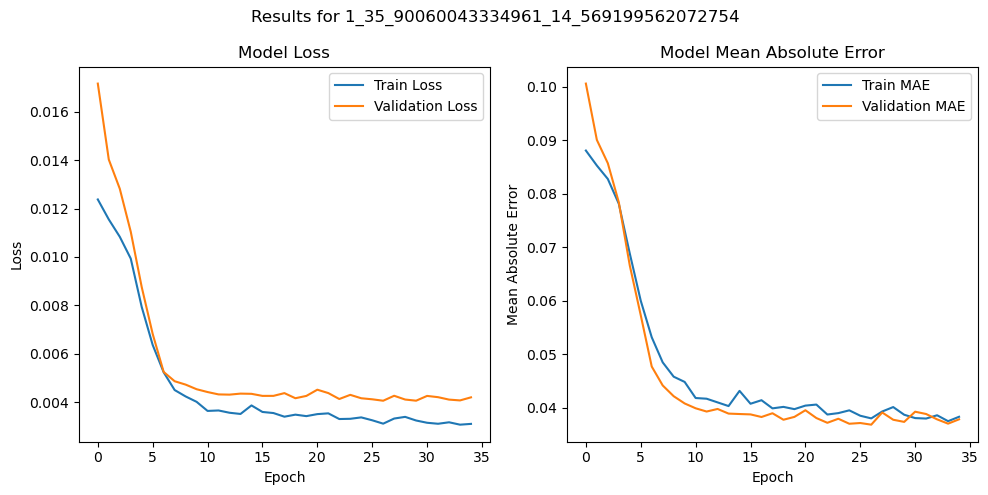

15/15 [==============================] - 4s 143ms/step

Test set Evaluation metrics for file: 1_35_90060043334961_14_569199562072754
Mean Squared Error (MSE): 0.0025799490758623422
Mean Absolute Error (MAE): 0.032844567825108494
Root Mean Squared Error (RMSE): 0.05079319911033703



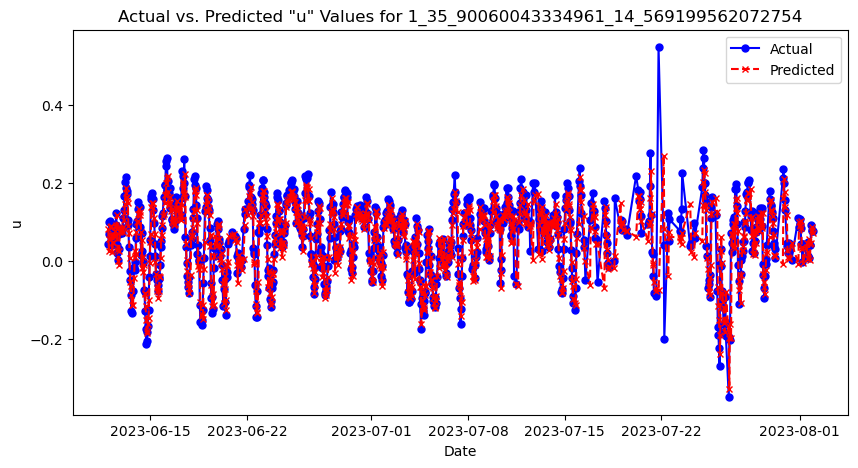

Model tarining & evaluation completed for file: 1_35_90060043334961_14_569199562072754.csv

Processing file: 2_35_92279815673828_14_569199562072754.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
74/74 [==============================] - ETA: 0s - loss: 0.0124 - mean_absolute_error: 0.0896INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


74/74 [==============================] - 50s 604ms/step - loss: 0.0124 - mean_absolute_error: 0.0896 - val_loss: 0.0174 - val_mean_absolute_error: 0.1038
Epoch 2/100
74/74 [==============================] - ETA: 0s - loss: 0.0112 - mean_absolute_error: 0.0858INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


74/74 [==============================] - 51s 689ms/step - loss: 0.0112 - mean_absolute_error: 0.0858 - val_loss: 0.0161 - val_mean_absolute_error: 0.0992
Epoch 3/100
74/74 [==============================] - ETA: 0s - loss: 0.0107 - mean_absolute_error: 0.0830INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


74/74 [==============================] - 49s 671ms/step - loss: 0.0107 - mean_absolute_error: 0.0830 - val_loss: 0.0148 - val_mean_absolute_error: 0.0952
Epoch 4/100
74/74 [==============================] - ETA: 0s - loss: 0.0098 - mean_absolute_error: 0.0793INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


74/74 [==============================] - 48s 645ms/step - loss: 0.0098 - mean_absolute_error: 0.0793 - val_loss: 0.0113 - val_mean_absolute_error: 0.0813
Epoch 5/100
74/74 [==============================] - ETA: 0s - loss: 0.0079 - mean_absolute_error: 0.0694INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


74/74 [==============================] - 48s 654ms/step - loss: 0.0079 - mean_absolute_error: 0.0694 - val_loss: 0.0076 - val_mean_absolute_error: 0.0620
Epoch 6/100
74/74 [==============================] - ETA: 0s - loss: 0.0059 - mean_absolute_error: 0.0583INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


74/74 [==============================] - 54s 732ms/step - loss: 0.0059 - mean_absolute_error: 0.0583 - val_loss: 0.0057 - val_mean_absolute_error: 0.0508
Epoch 7/100
74/74 [==============================] - ETA: 0s - loss: 0.0048 - mean_absolute_error: 0.0507INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


74/74 [==============================] - 53s 716ms/step - loss: 0.0048 - mean_absolute_error: 0.0507 - val_loss: 0.0051 - val_mean_absolute_error: 0.0462
Epoch 8/100
74/74 [==============================] - ETA: 0s - loss: 0.0042 - mean_absolute_error: 0.0466INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


74/74 [==============================] - 56s 753ms/step - loss: 0.0042 - mean_absolute_error: 0.0466 - val_loss: 0.0050 - val_mean_absolute_error: 0.0432
Epoch 9/100
74/74 [==============================] - ETA: 0s - loss: 0.0038 - mean_absolute_error: 0.0437INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


74/74 [==============================] - 62s 840ms/step - loss: 0.0038 - mean_absolute_error: 0.0437 - val_loss: 0.0048 - val_mean_absolute_error: 0.0412
Epoch 10/100
74/74 [==============================] - ETA: 0s - loss: 0.0035 - mean_absolute_error: 0.0413INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


74/74 [==============================] - 47s 636ms/step - loss: 0.0035 - mean_absolute_error: 0.0413 - val_loss: 0.0048 - val_mean_absolute_error: 0.0399
Epoch 11/100
74/74 [==============================] - ETA: 0s - loss: 0.0035 - mean_absolute_error: 0.0409INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


74/74 [==============================] - 49s 660ms/step - loss: 0.0035 - mean_absolute_error: 0.0409 - val_loss: 0.0047 - val_mean_absolute_error: 0.0399
Epoch 12/100
74/74 [==============================] - ETA: 0s - loss: 0.0036 - mean_absolute_error: 0.0409INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


74/74 [==============================] - 46s 624ms/step - loss: 0.0036 - mean_absolute_error: 0.0409 - val_loss: 0.0046 - val_mean_absolute_error: 0.0396
Epoch 13/100
74/74 [==============================] - ETA: 0s - loss: 0.0034 - mean_absolute_error: 0.0404INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


74/74 [==============================] - 53s 714ms/step - loss: 0.0034 - mean_absolute_error: 0.0404 - val_loss: 0.0046 - val_mean_absolute_error: 0.0391
Epoch 14/100
74/74 [==============================] - 36s 488ms/step - loss: 0.0033 - mean_absolute_error: 0.0390 - val_loss: 0.0048 - val_mean_absolute_error: 0.0403
Epoch 15/100
74/74 [==============================] - 36s 492ms/step - loss: 0.0033 - mean_absolute_error: 0.0397 - val_loss: 0.0048 - val_mean_absolute_error: 0.0402
Epoch 16/100
74/74 [==============================] - ETA: 0s - loss: 0.0034 - mean_absolute_error: 0.0400INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


74/74 [==============================] - 47s 632ms/step - loss: 0.0034 - mean_absolute_error: 0.0400 - val_loss: 0.0046 - val_mean_absolute_error: 0.0392
Epoch 17/100
74/74 [==============================] - 38s 510ms/step - loss: 0.0032 - mean_absolute_error: 0.0386 - val_loss: 0.0046 - val_mean_absolute_error: 0.0387
Epoch 18/100
74/74 [==============================] - 37s 494ms/step - loss: 0.0032 - mean_absolute_error: 0.0387 - val_loss: 0.0047 - val_mean_absolute_error: 0.0396
Epoch 19/100
74/74 [==============================] - ETA: 0s - loss: 0.0033 - mean_absolute_error: 0.0387INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


74/74 [==============================] - 48s 653ms/step - loss: 0.0033 - mean_absolute_error: 0.0387 - val_loss: 0.0045 - val_mean_absolute_error: 0.0383
Epoch 20/100
74/74 [==============================] - ETA: 0s - loss: 0.0032 - mean_absolute_error: 0.0379INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


74/74 [==============================] - 50s 672ms/step - loss: 0.0032 - mean_absolute_error: 0.0379 - val_loss: 0.0044 - val_mean_absolute_error: 0.0378
Epoch 21/100
74/74 [==============================] - ETA: 0s - loss: 0.0032 - mean_absolute_error: 0.0381INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


74/74 [==============================] - 48s 645ms/step - loss: 0.0032 - mean_absolute_error: 0.0381 - val_loss: 0.0043 - val_mean_absolute_error: 0.0378
Epoch 22/100
74/74 [==============================] - 36s 487ms/step - loss: 0.0032 - mean_absolute_error: 0.0385 - val_loss: 0.0045 - val_mean_absolute_error: 0.0400
Epoch 23/100
74/74 [==============================] - ETA: 0s - loss: 0.0032 - mean_absolute_error: 0.0380INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


74/74 [==============================] - 49s 664ms/step - loss: 0.0032 - mean_absolute_error: 0.0380 - val_loss: 0.0043 - val_mean_absolute_error: 0.0393
Epoch 24/100
74/74 [==============================] - ETA: 0s - loss: 0.0032 - mean_absolute_error: 0.0387INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\2_35_92279815673828_14_569199562072754\assets


74/74 [==============================] - 46s 629ms/step - loss: 0.0032 - mean_absolute_error: 0.0387 - val_loss: 0.0043 - val_mean_absolute_error: 0.0393
Epoch 25/100
74/74 [==============================] - 36s 487ms/step - loss: 0.0031 - mean_absolute_error: 0.0376 - val_loss: 0.0043 - val_mean_absolute_error: 0.0392
Epoch 26/100
74/74 [==============================] - 36s 486ms/step - loss: 0.0031 - mean_absolute_error: 0.0378 - val_loss: 0.0044 - val_mean_absolute_error: 0.0405
Epoch 27/100
74/74 [==============================] - 36s 489ms/step - loss: 0.0032 - mean_absolute_error: 0.0385 - val_loss: 0.0048 - val_mean_absolute_error: 0.0437
Epoch 28/100
74/74 [==============================] - 36s 490ms/step - loss: 0.0031 - mean_absolute_error: 0.0375 - val_loss: 0.0046 - val_mean_absolute_error: 0.0407
Epoch 29/100
74/74 [==============================] - 36s 488ms/step - loss: 0.0030 - mean_absolute_error: 0.0373 - val_loss: 0.0046 - val_mean_absolute_error: 0.0404
Epoch 30/10

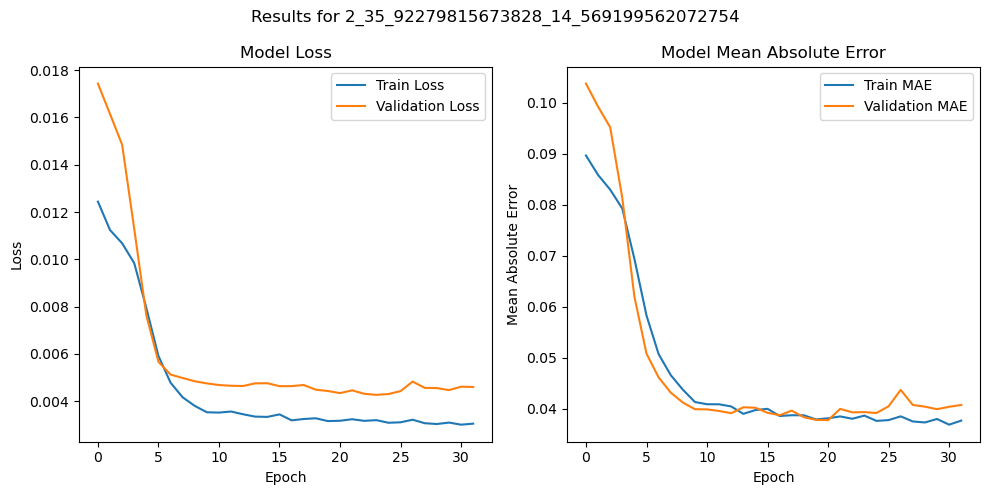

15/15 [==============================] - 4s 155ms/step

Test set Evaluation metrics for file: 2_35_92279815673828_14_569199562072754
Mean Squared Error (MSE): 0.002373074639280028
Mean Absolute Error (MAE): 0.03331522469388662
Root Mean Squared Error (RMSE): 0.04871421393474422



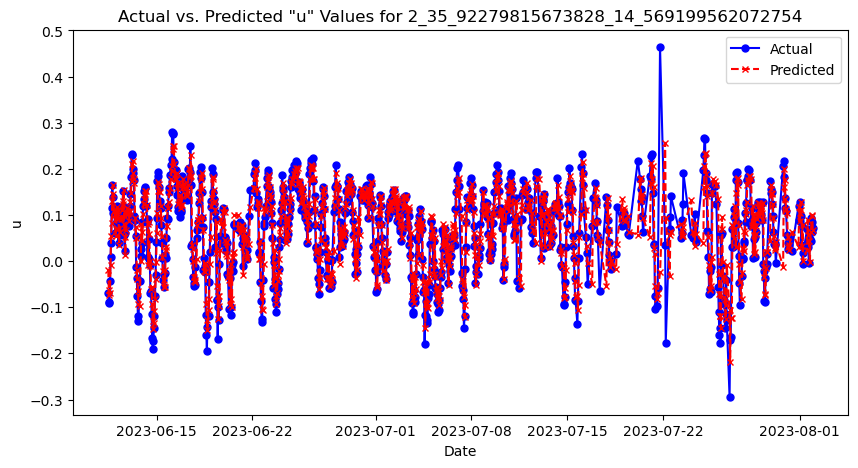

Model tarining & evaluation completed for file: 2_35_92279815673828_14_569199562072754.csv

Processing file: 3_35_945098876953125_14_569199562072754.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
90/90 [==============================] - ETA: 0s - loss: 0.0139 - mean_absolute_error: 0.0955INFO:tensorflow:Assets written to: Data/saved_models/models_u\3_35_945098876953125_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\3_35_945098876953125_14_569199562072754\assets


90/90 [==============================] - 57s 567ms/step - loss: 0.0139 - mean_absolute_error: 0.0955 - val_loss: 0.0156 - val_mean_absolute_error: 0.0999
Epoch 2/100
90/90 [==============================] - 68s 753ms/step - loss: 0.0127 - mean_absolute_error: 0.0912 - val_loss: 0.0159 - val_mean_absolute_error: 0.1000
Epoch 3/100
90/90 [==============================] - 69s 766ms/step - loss: 0.0124 - mean_absolute_error: 0.0896 - val_loss: 0.0157 - val_mean_absolute_error: 0.1000
Epoch 4/100
90/90 [==============================] - ETA: 0s - loss: 0.0111 - mean_absolute_error: 0.0835INFO:tensorflow:Assets written to: Data/saved_models/models_u\3_35_945098876953125_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\3_35_945098876953125_14_569199562072754\assets


90/90 [==============================] - 80s 894ms/step - loss: 0.0111 - mean_absolute_error: 0.0835 - val_loss: 0.0103 - val_mean_absolute_error: 0.0798
Epoch 5/100
90/90 [==============================] - ETA: 0s - loss: 0.0084 - mean_absolute_error: 0.0703INFO:tensorflow:Assets written to: Data/saved_models/models_u\3_35_945098876953125_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\3_35_945098876953125_14_569199562072754\assets


90/90 [==============================] - 76s 850ms/step - loss: 0.0084 - mean_absolute_error: 0.0703 - val_loss: 0.0063 - val_mean_absolute_error: 0.0603
Epoch 6/100
90/90 [==============================] - ETA: 0s - loss: 0.0063 - mean_absolute_error: 0.0584INFO:tensorflow:Assets written to: Data/saved_models/models_u\3_35_945098876953125_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\3_35_945098876953125_14_569199562072754\assets


90/90 [==============================] - 79s 885ms/step - loss: 0.0063 - mean_absolute_error: 0.0584 - val_loss: 0.0046 - val_mean_absolute_error: 0.0472
Epoch 7/100
90/90 [==============================] - ETA: 0s - loss: 0.0049 - mean_absolute_error: 0.0495INFO:tensorflow:Assets written to: Data/saved_models/models_u\3_35_945098876953125_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\3_35_945098876953125_14_569199562072754\assets


90/90 [==============================] - 78s 873ms/step - loss: 0.0049 - mean_absolute_error: 0.0495 - val_loss: 0.0041 - val_mean_absolute_error: 0.0431
Epoch 8/100
90/90 [==============================] - ETA: 0s - loss: 0.0045 - mean_absolute_error: 0.0462INFO:tensorflow:Assets written to: Data/saved_models/models_u\3_35_945098876953125_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\3_35_945098876953125_14_569199562072754\assets


90/90 [==============================] - 77s 858ms/step - loss: 0.0045 - mean_absolute_error: 0.0462 - val_loss: 0.0039 - val_mean_absolute_error: 0.0408
Epoch 9/100
90/90 [==============================] - 52s 576ms/step - loss: 0.0043 - mean_absolute_error: 0.0449 - val_loss: 0.0039 - val_mean_absolute_error: 0.0403
Epoch 10/100
90/90 [==============================] - ETA: 0s - loss: 0.0041 - mean_absolute_error: 0.0435INFO:tensorflow:Assets written to: Data/saved_models/models_u\3_35_945098876953125_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\3_35_945098876953125_14_569199562072754\assets


90/90 [==============================] - 62s 691ms/step - loss: 0.0041 - mean_absolute_error: 0.0435 - val_loss: 0.0038 - val_mean_absolute_error: 0.0394
Epoch 11/100
90/90 [==============================] - ETA: 0s - loss: 0.0042 - mean_absolute_error: 0.0439INFO:tensorflow:Assets written to: Data/saved_models/models_u\3_35_945098876953125_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\3_35_945098876953125_14_569199562072754\assets


90/90 [==============================] - 64s 714ms/step - loss: 0.0042 - mean_absolute_error: 0.0439 - val_loss: 0.0038 - val_mean_absolute_error: 0.0392
Epoch 12/100
90/90 [==============================] - 51s 570ms/step - loss: 0.0040 - mean_absolute_error: 0.0433 - val_loss: 0.0039 - val_mean_absolute_error: 0.0399
Epoch 13/100
90/90 [==============================] - 50s 558ms/step - loss: 0.0041 - mean_absolute_error: 0.0428 - val_loss: 0.0039 - val_mean_absolute_error: 0.0408
Epoch 14/100
90/90 [==============================] - 50s 557ms/step - loss: 0.0040 - mean_absolute_error: 0.0427 - val_loss: 0.0039 - val_mean_absolute_error: 0.0406
Epoch 15/100
90/90 [==============================] - ETA: 0s - loss: 0.0040 - mean_absolute_error: 0.0432INFO:tensorflow:Assets written to: Data/saved_models/models_u\3_35_945098876953125_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\3_35_945098876953125_14_569199562072754\assets


90/90 [==============================] - 61s 683ms/step - loss: 0.0040 - mean_absolute_error: 0.0432 - val_loss: 0.0037 - val_mean_absolute_error: 0.0393
Epoch 16/100
90/90 [==============================] - 49s 542ms/step - loss: 0.0040 - mean_absolute_error: 0.0429 - val_loss: 0.0038 - val_mean_absolute_error: 0.0402
Epoch 17/100
90/90 [==============================] - ETA: 0s - loss: 0.0038 - mean_absolute_error: 0.0421INFO:tensorflow:Assets written to: Data/saved_models/models_u\3_35_945098876953125_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\3_35_945098876953125_14_569199562072754\assets


90/90 [==============================] - 60s 665ms/step - loss: 0.0038 - mean_absolute_error: 0.0421 - val_loss: 0.0037 - val_mean_absolute_error: 0.0399
Epoch 18/100
90/90 [==============================] - 51s 564ms/step - loss: 0.0039 - mean_absolute_error: 0.0427 - val_loss: 0.0040 - val_mean_absolute_error: 0.0425
Epoch 19/100
90/90 [==============================] - 51s 566ms/step - loss: 0.0039 - mean_absolute_error: 0.0426 - val_loss: 0.0038 - val_mean_absolute_error: 0.0408
Epoch 20/100
90/90 [==============================] - 52s 573ms/step - loss: 0.0038 - mean_absolute_error: 0.0418 - val_loss: 0.0041 - val_mean_absolute_error: 0.0430
Epoch 21/100
90/90 [==============================] - 51s 572ms/step - loss: 0.0038 - mean_absolute_error: 0.0424 - val_loss: 0.0039 - val_mean_absolute_error: 0.0419
Epoch 22/100
90/90 [==============================] - 51s 566ms/step - loss: 0.0038 - mean_absolute_error: 0.0422 - val_loss: 0.0040 - val_mean_absolute_error: 0.0428
Epoch 23/10

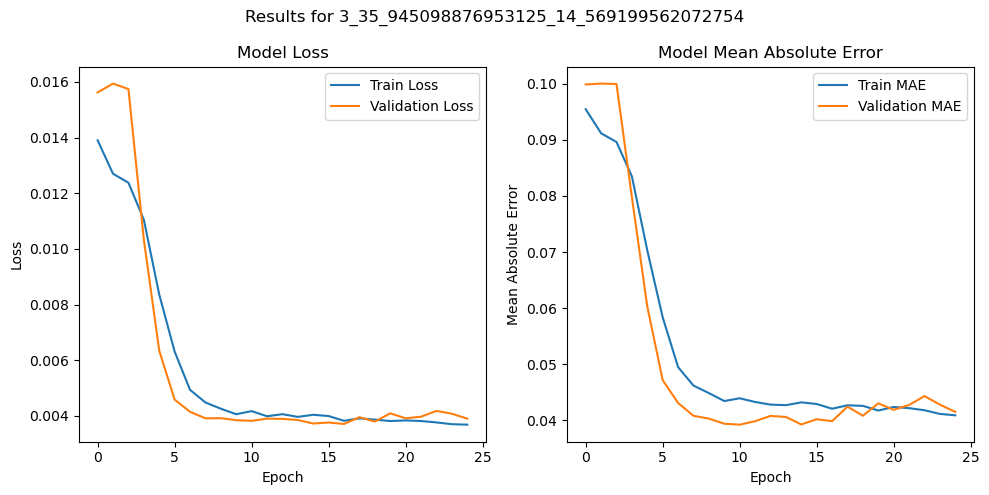

19/19 [==============================] - 5s 170ms/step

Test set Evaluation metrics for file: 3_35_945098876953125_14_569199562072754
Mean Squared Error (MSE): 0.0024331685596905906
Mean Absolute Error (MAE): 0.03643591000350941
Root Mean Squared Error (RMSE): 0.04932715843924714



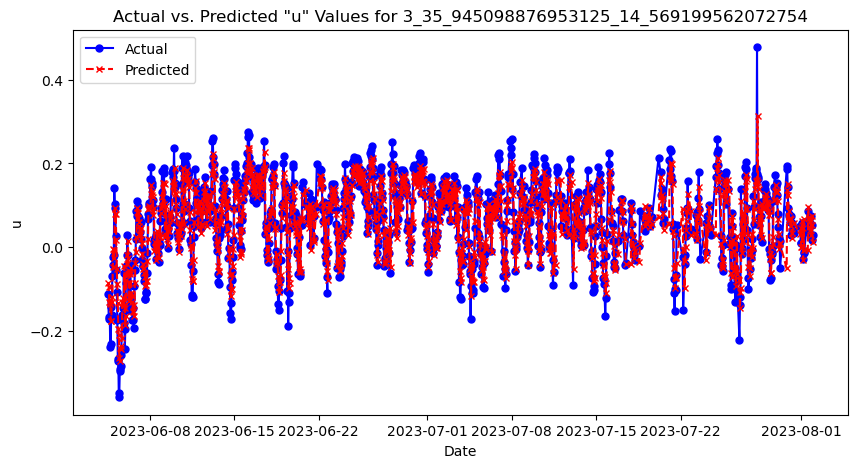

Model tarining & evaluation completed for file: 3_35_945098876953125_14_569199562072754.csv

Processing file: 4_35_96730041503906_14_528599739074707.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
103/103 [==============================] - ETA: 0s - loss: 0.0167 - mean_absolute_error: 0.0988INFO:tensorflow:Assets written to: Data/saved_models/models_u\4_35_96730041503906_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\4_35_96730041503906_14_528599739074707\assets


103/103 [==============================] - 81s 727ms/step - loss: 0.0167 - mean_absolute_error: 0.0988 - val_loss: 0.0135 - val_mean_absolute_error: 0.0912
Epoch 2/100
103/103 [==============================] - ETA: 0s - loss: 0.0157 - mean_absolute_error: 0.0955INFO:tensorflow:Assets written to: Data/saved_models/models_u\4_35_96730041503906_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\4_35_96730041503906_14_528599739074707\assets


103/103 [==============================] - 80s 780ms/step - loss: 0.0157 - mean_absolute_error: 0.0955 - val_loss: 0.0127 - val_mean_absolute_error: 0.0882
Epoch 3/100
103/103 [==============================] - ETA: 0s - loss: 0.0148 - mean_absolute_error: 0.0926INFO:tensorflow:Assets written to: Data/saved_models/models_u\4_35_96730041503906_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\4_35_96730041503906_14_528599739074707\assets


103/103 [==============================] - 83s 802ms/step - loss: 0.0148 - mean_absolute_error: 0.0926 - val_loss: 0.0117 - val_mean_absolute_error: 0.0838
Epoch 4/100
103/103 [==============================] - ETA: 0s - loss: 0.0130 - mean_absolute_error: 0.0855INFO:tensorflow:Assets written to: Data/saved_models/models_u\4_35_96730041503906_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\4_35_96730041503906_14_528599739074707\assets


103/103 [==============================] - 94s 920ms/step - loss: 0.0130 - mean_absolute_error: 0.0855 - val_loss: 0.0082 - val_mean_absolute_error: 0.0683
Epoch 5/100
103/103 [==============================] - ETA: 0s - loss: 0.0095 - mean_absolute_error: 0.0708INFO:tensorflow:Assets written to: Data/saved_models/models_u\4_35_96730041503906_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\4_35_96730041503906_14_528599739074707\assets


103/103 [==============================] - 92s 892ms/step - loss: 0.0095 - mean_absolute_error: 0.0708 - val_loss: 0.0058 - val_mean_absolute_error: 0.0547
Epoch 6/100
103/103 [==============================] - ETA: 0s - loss: 0.0073 - mean_absolute_error: 0.0601INFO:tensorflow:Assets written to: Data/saved_models/models_u\4_35_96730041503906_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\4_35_96730041503906_14_528599739074707\assets


103/103 [==============================] - 80s 781ms/step - loss: 0.0073 - mean_absolute_error: 0.0601 - val_loss: 0.0049 - val_mean_absolute_error: 0.0488
Epoch 7/100
103/103 [==============================] - ETA: 0s - loss: 0.0063 - mean_absolute_error: 0.0544INFO:tensorflow:Assets written to: Data/saved_models/models_u\4_35_96730041503906_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\4_35_96730041503906_14_528599739074707\assets


103/103 [==============================] - 85s 823ms/step - loss: 0.0063 - mean_absolute_error: 0.0544 - val_loss: 0.0047 - val_mean_absolute_error: 0.0467
Epoch 8/100
103/103 [==============================] - 74s 714ms/step - loss: 0.0061 - mean_absolute_error: 0.0529 - val_loss: 0.0047 - val_mean_absolute_error: 0.0467
Epoch 9/100
103/103 [==============================] - ETA: 0s - loss: 0.0059 - mean_absolute_error: 0.0515INFO:tensorflow:Assets written to: Data/saved_models/models_u\4_35_96730041503906_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\4_35_96730041503906_14_528599739074707\assets


103/103 [==============================] - 82s 797ms/step - loss: 0.0059 - mean_absolute_error: 0.0515 - val_loss: 0.0046 - val_mean_absolute_error: 0.0458
Epoch 10/100
103/103 [==============================] - 83s 808ms/step - loss: 0.0059 - mean_absolute_error: 0.0522 - val_loss: 0.0048 - val_mean_absolute_error: 0.0479
Epoch 11/100
103/103 [==============================] - 84s 820ms/step - loss: 0.0059 - mean_absolute_error: 0.0519 - val_loss: 0.0048 - val_mean_absolute_error: 0.0475
Epoch 12/100
103/103 [==============================] - 85s 824ms/step - loss: 0.0056 - mean_absolute_error: 0.0504 - val_loss: 0.0048 - val_mean_absolute_error: 0.0480
Epoch 13/100
103/103 [==============================] - 83s 808ms/step - loss: 0.0058 - mean_absolute_error: 0.0512 - val_loss: 0.0047 - val_mean_absolute_error: 0.0466
Epoch 14/100
103/103 [==============================] - 86s 836ms/step - loss: 0.0057 - mean_absolute_error: 0.0510 - val_loss: 0.0048 - val_mean_absolute_error: 0.0475

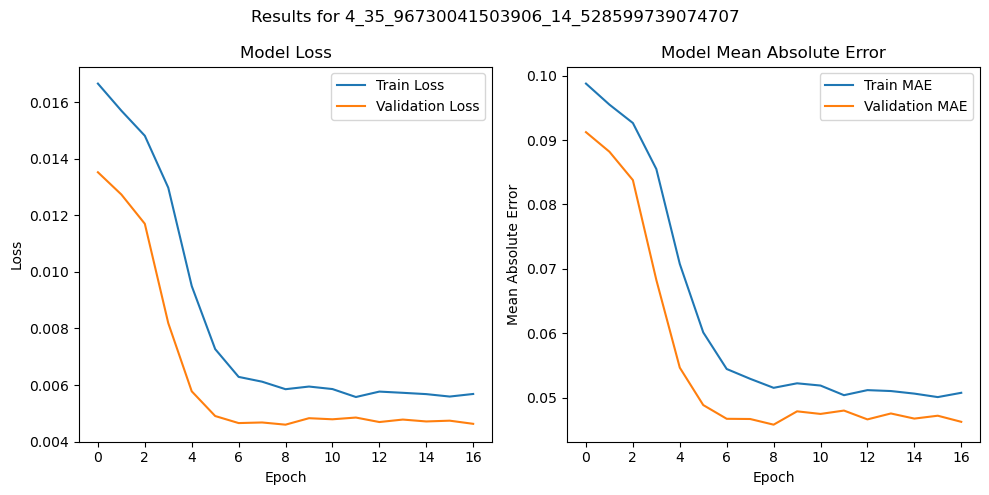

22/22 [==============================] - 7s 244ms/step

Test set Evaluation metrics for file: 4_35_96730041503906_14_528599739074707
Mean Squared Error (MSE): 0.0033783748170471413
Mean Absolute Error (MAE): 0.043681033097317815
Root Mean Squared Error (RMSE): 0.05812378873617188



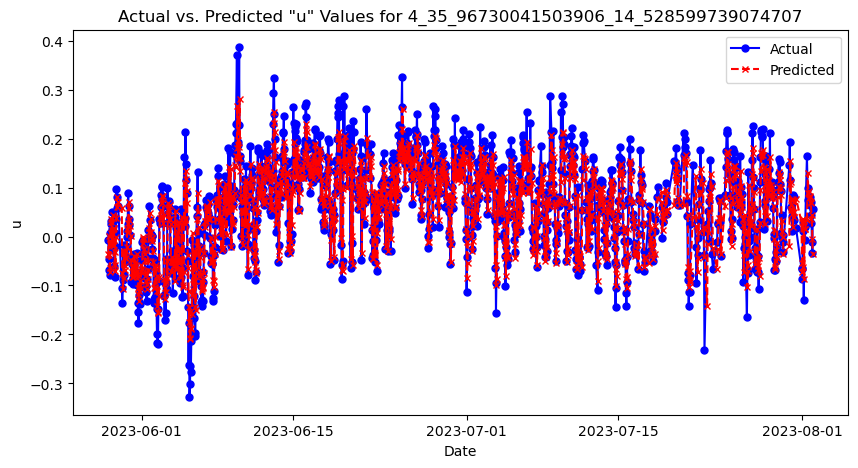

Model tarining & evaluation completed for file: 4_35_96730041503906_14_528599739074707.csv

Processing file: 5_35_96730041503906_14_569199562072754.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
103/103 [==============================] - ETA: 0s - loss: 0.0148 - mean_absolute_error: 0.0973INFO:tensorflow:Assets written to: Data/saved_models/models_u\5_35_96730041503906_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\5_35_96730041503906_14_569199562072754\assets


103/103 [==============================] - 103s 948ms/step - loss: 0.0148 - mean_absolute_error: 0.0973 - val_loss: 0.0131 - val_mean_absolute_error: 0.0912
Epoch 2/100
103/103 [==============================] - 84s 811ms/step - loss: 0.0137 - mean_absolute_error: 0.0926 - val_loss: 0.0134 - val_mean_absolute_error: 0.0923
Epoch 3/100
103/103 [==============================] - ETA: 0s - loss: 0.0137 - mean_absolute_error: 0.0926INFO:tensorflow:Assets written to: Data/saved_models/models_u\5_35_96730041503906_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\5_35_96730041503906_14_569199562072754\assets


103/103 [==============================] - 94s 915ms/step - loss: 0.0137 - mean_absolute_error: 0.0926 - val_loss: 0.0126 - val_mean_absolute_error: 0.0897
Epoch 4/100
103/103 [==============================] - ETA: 0s - loss: 0.0128 - mean_absolute_error: 0.0890INFO:tensorflow:Assets written to: Data/saved_models/models_u\5_35_96730041503906_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\5_35_96730041503906_14_569199562072754\assets


103/103 [==============================] - 96s 933ms/step - loss: 0.0128 - mean_absolute_error: 0.0890 - val_loss: 0.0110 - val_mean_absolute_error: 0.0829
Epoch 5/100
103/103 [==============================] - ETA: 0s - loss: 0.0105 - mean_absolute_error: 0.0788INFO:tensorflow:Assets written to: Data/saved_models/models_u\5_35_96730041503906_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\5_35_96730041503906_14_569199562072754\assets


103/103 [==============================] - 98s 958ms/step - loss: 0.0105 - mean_absolute_error: 0.0788 - val_loss: 0.0064 - val_mean_absolute_error: 0.0621
Epoch 6/100
103/103 [==============================] - ETA: 0s - loss: 0.0075 - mean_absolute_error: 0.0646INFO:tensorflow:Assets written to: Data/saved_models/models_u\5_35_96730041503906_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\5_35_96730041503906_14_569199562072754\assets


103/103 [==============================] - 95s 928ms/step - loss: 0.0075 - mean_absolute_error: 0.0646 - val_loss: 0.0050 - val_mean_absolute_error: 0.0531
Epoch 7/100
103/103 [==============================] - ETA: 0s - loss: 0.0058 - mean_absolute_error: 0.0553INFO:tensorflow:Assets written to: Data/saved_models/models_u\5_35_96730041503906_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\5_35_96730041503906_14_569199562072754\assets


103/103 [==============================] - 94s 914ms/step - loss: 0.0058 - mean_absolute_error: 0.0553 - val_loss: 0.0043 - val_mean_absolute_error: 0.0476
Epoch 8/100
103/103 [==============================] - ETA: 0s - loss: 0.0049 - mean_absolute_error: 0.0496INFO:tensorflow:Assets written to: Data/saved_models/models_u\5_35_96730041503906_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\5_35_96730041503906_14_569199562072754\assets


103/103 [==============================] - 102s 994ms/step - loss: 0.0049 - mean_absolute_error: 0.0496 - val_loss: 0.0037 - val_mean_absolute_error: 0.0428
Epoch 9/100
103/103 [==============================] - ETA: 0s - loss: 0.0047 - mean_absolute_error: 0.0475INFO:tensorflow:Assets written to: Data/saved_models/models_u\5_35_96730041503906_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\5_35_96730041503906_14_569199562072754\assets


103/103 [==============================] - 102s 998ms/step - loss: 0.0047 - mean_absolute_error: 0.0475 - val_loss: 0.0034 - val_mean_absolute_error: 0.0395
Epoch 10/100
103/103 [==============================] - 96s 932ms/step - loss: 0.0044 - mean_absolute_error: 0.0464 - val_loss: 0.0035 - val_mean_absolute_error: 0.0404
Epoch 11/100
103/103 [==============================] - 94s 916ms/step - loss: 0.0045 - mean_absolute_error: 0.0467 - val_loss: 0.0037 - val_mean_absolute_error: 0.0426
Epoch 12/100
103/103 [==============================] - 102s 996ms/step - loss: 0.0044 - mean_absolute_error: 0.0455 - val_loss: 0.0034 - val_mean_absolute_error: 0.0396
Epoch 13/100
103/103 [==============================] - 96s 934ms/step - loss: 0.0043 - mean_absolute_error: 0.0450 - val_loss: 0.0036 - val_mean_absolute_error: 0.0418
Epoch 14/100
103/103 [==============================] - 93s 904ms/step - loss: 0.0042 - mean_absolute_error: 0.0445 - val_loss: 0.0035 - val_mean_absolute_error: 0.04

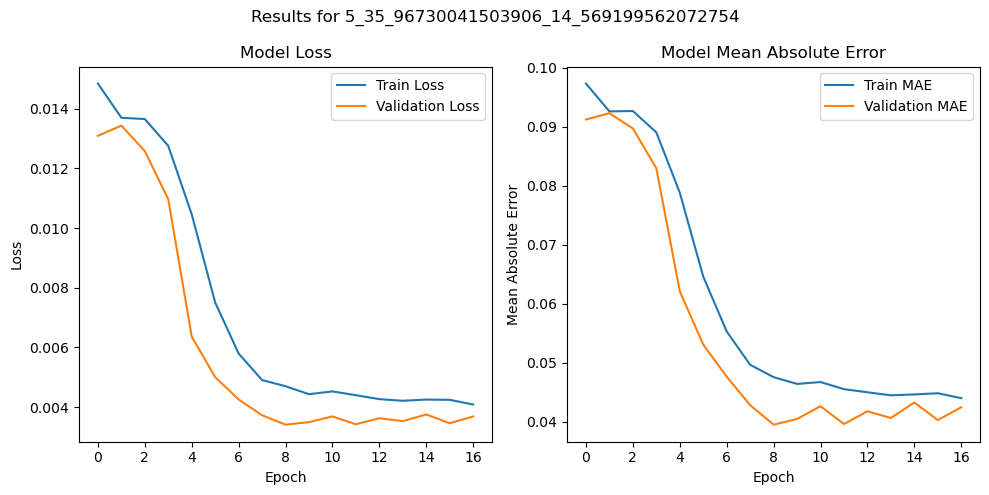

22/22 [==============================] - 8s 318ms/step

Test set Evaluation metrics for file: 5_35_96730041503906_14_569199562072754
Mean Squared Error (MSE): 0.002650869972712633
Mean Absolute Error (MAE): 0.03931196480960895
Root Mean Squared Error (RMSE): 0.05148659993350341



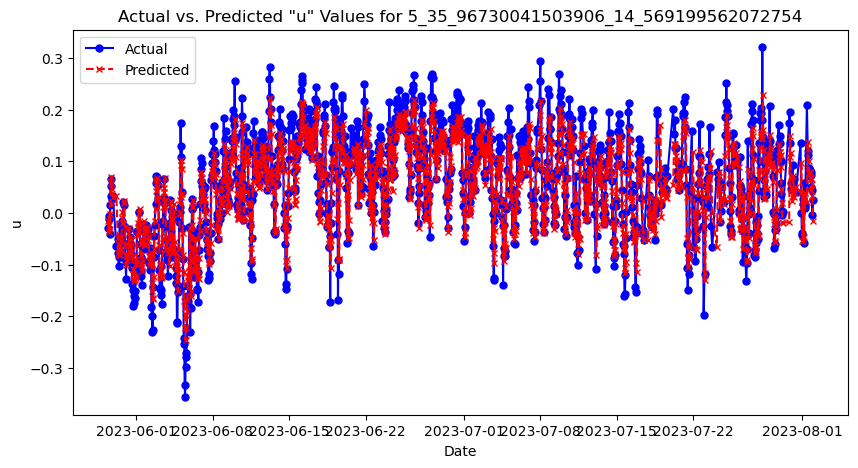

Model tarining & evaluation completed for file: 5_35_96730041503906_14_569199562072754.csv

Processing file: 6_35_989601135253906_14_447500228881836.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
73/73 [==============================] - ETA: 0s - loss: 0.0164 - mean_absolute_error: 0.0955INFO:tensorflow:Assets written to: Data/saved_models/models_u\6_35_989601135253906_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\6_35_989601135253906_14_447500228881836\assets


73/73 [==============================] - 82s 1s/step - loss: 0.0164 - mean_absolute_error: 0.0955 - val_loss: 0.0165 - val_mean_absolute_error: 0.1046
Epoch 2/100
73/73 [==============================] - ETA: 0s - loss: 0.0157 - mean_absolute_error: 0.0923INFO:tensorflow:Assets written to: Data/saved_models/models_u\6_35_989601135253906_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\6_35_989601135253906_14_447500228881836\assets


73/73 [==============================] - 77s 1s/step - loss: 0.0157 - mean_absolute_error: 0.0923 - val_loss: 0.0134 - val_mean_absolute_error: 0.0935
Epoch 3/100
73/73 [==============================] - ETA: 0s - loss: 0.0152 - mean_absolute_error: 0.0909INFO:tensorflow:Assets written to: Data/saved_models/models_u\6_35_989601135253906_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\6_35_989601135253906_14_447500228881836\assets


73/73 [==============================] - 75s 1s/step - loss: 0.0152 - mean_absolute_error: 0.0909 - val_loss: 0.0123 - val_mean_absolute_error: 0.0890
Epoch 4/100
73/73 [==============================] - ETA: 0s - loss: 0.0140 - mean_absolute_error: 0.0875INFO:tensorflow:Assets written to: Data/saved_models/models_u\6_35_989601135253906_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\6_35_989601135253906_14_447500228881836\assets


73/73 [==============================] - 79s 1s/step - loss: 0.0140 - mean_absolute_error: 0.0875 - val_loss: 0.0117 - val_mean_absolute_error: 0.0873
Epoch 5/100
73/73 [==============================] - ETA: 0s - loss: 0.0138 - mean_absolute_error: 0.0865INFO:tensorflow:Assets written to: Data/saved_models/models_u\6_35_989601135253906_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\6_35_989601135253906_14_447500228881836\assets


73/73 [==============================] - 77s 1s/step - loss: 0.0138 - mean_absolute_error: 0.0865 - val_loss: 0.0108 - val_mean_absolute_error: 0.0835
Epoch 6/100
73/73 [==============================] - ETA: 0s - loss: 0.0133 - mean_absolute_error: 0.0835INFO:tensorflow:Assets written to: Data/saved_models/models_u\6_35_989601135253906_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\6_35_989601135253906_14_447500228881836\assets


73/73 [==============================] - 76s 1s/step - loss: 0.0133 - mean_absolute_error: 0.0835 - val_loss: 0.0098 - val_mean_absolute_error: 0.0789
Epoch 7/100
73/73 [==============================] - ETA: 0s - loss: 0.0125 - mean_absolute_error: 0.0797INFO:tensorflow:Assets written to: Data/saved_models/models_u\6_35_989601135253906_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\6_35_989601135253906_14_447500228881836\assets


73/73 [==============================] - 78s 1s/step - loss: 0.0125 - mean_absolute_error: 0.0797 - val_loss: 0.0091 - val_mean_absolute_error: 0.0762
Epoch 8/100
73/73 [==============================] - ETA: 0s - loss: 0.0113 - mean_absolute_error: 0.0746INFO:tensorflow:Assets written to: Data/saved_models/models_u\6_35_989601135253906_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\6_35_989601135253906_14_447500228881836\assets


73/73 [==============================] - 76s 1s/step - loss: 0.0113 - mean_absolute_error: 0.0746 - val_loss: 0.0072 - val_mean_absolute_error: 0.0659
Epoch 9/100
73/73 [==============================] - 67s 922ms/step - loss: 0.0105 - mean_absolute_error: 0.0715 - val_loss: 0.0075 - val_mean_absolute_error: 0.0689
Epoch 10/100
73/73 [==============================] - ETA: 0s - loss: 0.0097 - mean_absolute_error: 0.0679INFO:tensorflow:Assets written to: Data/saved_models/models_u\6_35_989601135253906_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\6_35_989601135253906_14_447500228881836\assets


73/73 [==============================] - 80s 1s/step - loss: 0.0097 - mean_absolute_error: 0.0679 - val_loss: 0.0059 - val_mean_absolute_error: 0.0594
Epoch 11/100
73/73 [==============================] - ETA: 0s - loss: 0.0093 - mean_absolute_error: 0.0651INFO:tensorflow:Assets written to: Data/saved_models/models_u\6_35_989601135253906_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\6_35_989601135253906_14_447500228881836\assets


73/73 [==============================] - 77s 1s/step - loss: 0.0093 - mean_absolute_error: 0.0651 - val_loss: 0.0051 - val_mean_absolute_error: 0.0544
Epoch 12/100
73/73 [==============================] - ETA: 0s - loss: 0.0088 - mean_absolute_error: 0.0634INFO:tensorflow:Assets written to: Data/saved_models/models_u\6_35_989601135253906_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\6_35_989601135253906_14_447500228881836\assets


73/73 [==============================] - 80s 1s/step - loss: 0.0088 - mean_absolute_error: 0.0634 - val_loss: 0.0048 - val_mean_absolute_error: 0.0520
Epoch 13/100
73/73 [==============================] - 66s 911ms/step - loss: 0.0086 - mean_absolute_error: 0.0615 - val_loss: 0.0050 - val_mean_absolute_error: 0.0538
Epoch 14/100
73/73 [==============================] - 66s 910ms/step - loss: 0.0087 - mean_absolute_error: 0.0618 - val_loss: 0.0049 - val_mean_absolute_error: 0.0528
Epoch 15/100
73/73 [==============================] - 67s 918ms/step - loss: 0.0087 - mean_absolute_error: 0.0618 - val_loss: 0.0052 - val_mean_absolute_error: 0.0556
Epoch 16/100
73/73 [==============================] - 67s 925ms/step - loss: 0.0084 - mean_absolute_error: 0.0604 - val_loss: 0.0054 - val_mean_absolute_error: 0.0566
Epoch 17/100
73/73 [==============================] - 67s 912ms/step - loss: 0.0086 - mean_absolute_error: 0.0621 - val_loss: 0.0054 - val_mean_absolute_error: 0.0571
Epoch 18/100
7

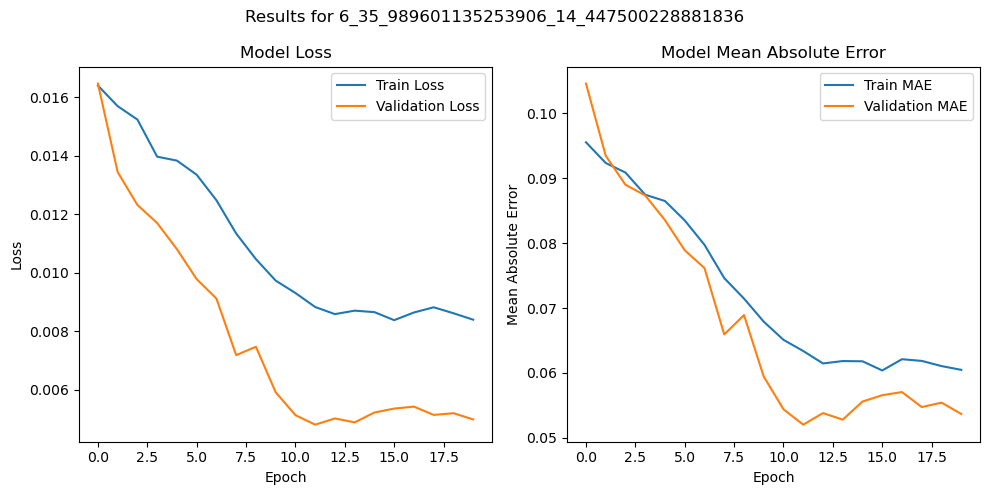

15/15 [==============================] - 7s 351ms/step

Test set Evaluation metrics for file: 6_35_989601135253906_14_447500228881836
Mean Squared Error (MSE): 0.004961961309598285
Mean Absolute Error (MAE): 0.05211229284673524
Root Mean Squared Error (RMSE): 0.07044119043285885



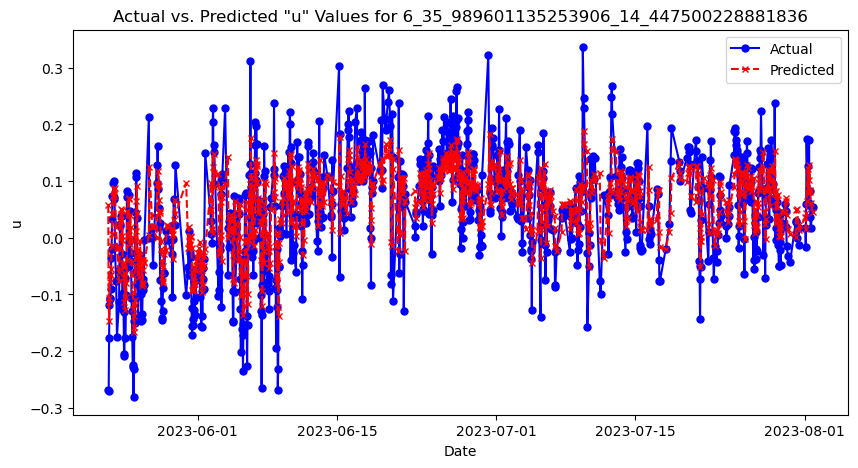

Model tarining & evaluation completed for file: 6_35_989601135253906_14_447500228881836.csv

Processing file: 7_35_989601135253906_14_48799991607666.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
106/106 [==============================] - ETA: 0s - loss: 0.0159 - mean_absolute_error: 0.0915INFO:tensorflow:Assets written to: Data/saved_models/models_u\7_35_989601135253906_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\7_35_989601135253906_14_48799991607666\assets


106/106 [==============================] - 114s 1s/step - loss: 0.0159 - mean_absolute_error: 0.0915 - val_loss: 0.0129 - val_mean_absolute_error: 0.0920
Epoch 2/100
106/106 [==============================] - ETA: 0s - loss: 0.0150 - mean_absolute_error: 0.0879INFO:tensorflow:Assets written to: Data/saved_models/models_u\7_35_989601135253906_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\7_35_989601135253906_14_48799991607666\assets


106/106 [==============================] - 124s 1s/step - loss: 0.0150 - mean_absolute_error: 0.0879 - val_loss: 0.0103 - val_mean_absolute_error: 0.0810
Epoch 3/100
106/106 [==============================] - ETA: 0s - loss: 0.0141 - mean_absolute_error: 0.0848INFO:tensorflow:Assets written to: Data/saved_models/models_u\7_35_989601135253906_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\7_35_989601135253906_14_48799991607666\assets


106/106 [==============================] - 122s 1s/step - loss: 0.0141 - mean_absolute_error: 0.0848 - val_loss: 0.0089 - val_mean_absolute_error: 0.0746
Epoch 4/100
106/106 [==============================] - ETA: 0s - loss: 0.0121 - mean_absolute_error: 0.0767INFO:tensorflow:Assets written to: Data/saved_models/models_u\7_35_989601135253906_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\7_35_989601135253906_14_48799991607666\assets


106/106 [==============================] - 126s 1s/step - loss: 0.0121 - mean_absolute_error: 0.0767 - val_loss: 0.0064 - val_mean_absolute_error: 0.0635
Epoch 5/100
106/106 [==============================] - ETA: 0s - loss: 0.0099 - mean_absolute_error: 0.0677INFO:tensorflow:Assets written to: Data/saved_models/models_u\7_35_989601135253906_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\7_35_989601135253906_14_48799991607666\assets


106/106 [==============================] - 129s 1s/step - loss: 0.0099 - mean_absolute_error: 0.0677 - val_loss: 0.0042 - val_mean_absolute_error: 0.0502
Epoch 6/100
106/106 [==============================] - ETA: 0s - loss: 0.0085 - mean_absolute_error: 0.0601INFO:tensorflow:Assets written to: Data/saved_models/models_u\7_35_989601135253906_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\7_35_989601135253906_14_48799991607666\assets


106/106 [==============================] - 128s 1s/step - loss: 0.0085 - mean_absolute_error: 0.0601 - val_loss: 0.0035 - val_mean_absolute_error: 0.0451
Epoch 7/100
106/106 [==============================] - ETA: 0s - loss: 0.0075 - mean_absolute_error: 0.0555INFO:tensorflow:Assets written to: Data/saved_models/models_u\7_35_989601135253906_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\7_35_989601135253906_14_48799991607666\assets


106/106 [==============================] - 133s 1s/step - loss: 0.0075 - mean_absolute_error: 0.0555 - val_loss: 0.0030 - val_mean_absolute_error: 0.0406
Epoch 8/100
106/106 [==============================] - 121s 1s/step - loss: 0.0074 - mean_absolute_error: 0.0536 - val_loss: 0.0031 - val_mean_absolute_error: 0.0416
Epoch 9/100
106/106 [==============================] - 121s 1s/step - loss: 0.0072 - mean_absolute_error: 0.0528 - val_loss: 0.0030 - val_mean_absolute_error: 0.0406
Epoch 10/100
106/106 [==============================] - ETA: 0s - loss: 0.0071 - mean_absolute_error: 0.0526INFO:tensorflow:Assets written to: Data/saved_models/models_u\7_35_989601135253906_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\7_35_989601135253906_14_48799991607666\assets


106/106 [==============================] - 131s 1s/step - loss: 0.0071 - mean_absolute_error: 0.0526 - val_loss: 0.0027 - val_mean_absolute_error: 0.0378
Epoch 11/100
106/106 [==============================] - 120s 1s/step - loss: 0.0072 - mean_absolute_error: 0.0524 - val_loss: 0.0031 - val_mean_absolute_error: 0.0414
Epoch 12/100
106/106 [==============================] - 121s 1s/step - loss: 0.0070 - mean_absolute_error: 0.0524 - val_loss: 0.0030 - val_mean_absolute_error: 0.0407
Epoch 13/100
106/106 [==============================] - 122s 1s/step - loss: 0.0070 - mean_absolute_error: 0.0518 - val_loss: 0.0029 - val_mean_absolute_error: 0.0392
Epoch 14/100
106/106 [==============================] - 122s 1s/step - loss: 0.0068 - mean_absolute_error: 0.0510 - val_loss: 0.0028 - val_mean_absolute_error: 0.0388
Epoch 15/100
106/106 [==============================] - 121s 1s/step - loss: 0.0070 - mean_absolute_error: 0.0514 - val_loss: 0.0032 - val_mean_absolute_error: 0.0425
Epoch 16/10

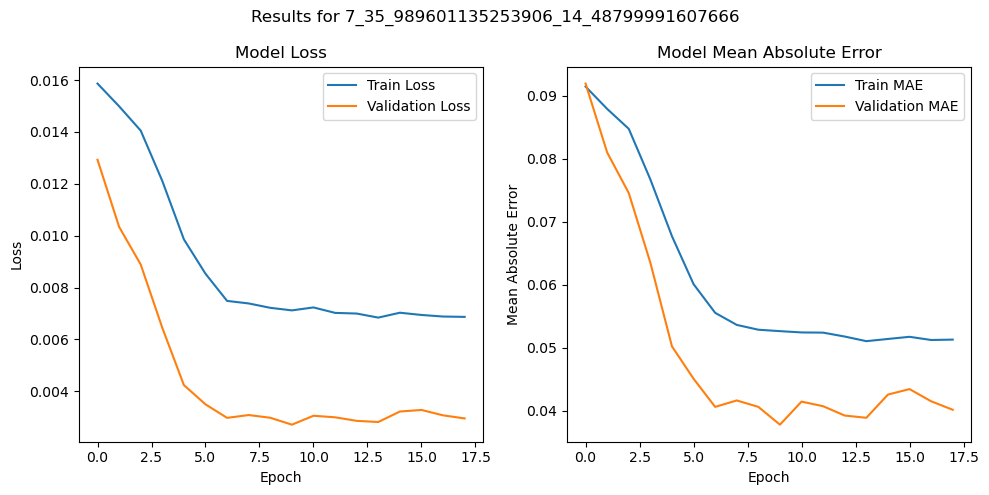

22/22 [==============================] - 10s 375ms/step

Test set Evaluation metrics for file: 7_35_989601135253906_14_48799991607666
Mean Squared Error (MSE): 0.0033173997151071206
Mean Absolute Error (MAE): 0.04231387994156774
Root Mean Squared Error (RMSE): 0.05759687244206165



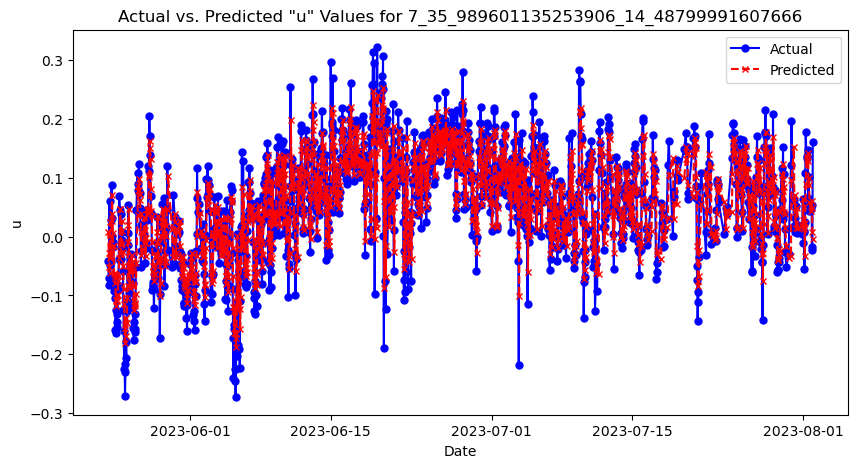

Model tarining & evaluation completed for file: 7_35_989601135253906_14_48799991607666.csv

Processing file: 8_35_989601135253906_14_528599739074707.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
117/117 [==============================] - ETA: 0s - loss: 0.0172 - mean_absolute_error: 0.0986INFO:tensorflow:Assets written to: Data/saved_models/models_u\8_35_989601135253906_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\8_35_989601135253906_14_528599739074707\assets


117/117 [==============================] - 153s 1s/step - loss: 0.0172 - mean_absolute_error: 0.0986 - val_loss: 0.0111 - val_mean_absolute_error: 0.0823
Epoch 2/100
117/117 [==============================] - ETA: 0s - loss: 0.0162 - mean_absolute_error: 0.0948INFO:tensorflow:Assets written to: Data/saved_models/models_u\8_35_989601135253906_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\8_35_989601135253906_14_528599739074707\assets


117/117 [==============================] - 139s 1s/step - loss: 0.0162 - mean_absolute_error: 0.0948 - val_loss: 0.0103 - val_mean_absolute_error: 0.0790
Epoch 3/100
117/117 [==============================] - ETA: 0s - loss: 0.0150 - mean_absolute_error: 0.0902INFO:tensorflow:Assets written to: Data/saved_models/models_u\8_35_989601135253906_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\8_35_989601135253906_14_528599739074707\assets


117/117 [==============================] - 136s 1s/step - loss: 0.0150 - mean_absolute_error: 0.0902 - val_loss: 0.0080 - val_mean_absolute_error: 0.0689
Epoch 4/100
117/117 [==============================] - ETA: 0s - loss: 0.0119 - mean_absolute_error: 0.0785INFO:tensorflow:Assets written to: Data/saved_models/models_u\8_35_989601135253906_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\8_35_989601135253906_14_528599739074707\assets


117/117 [==============================] - 133s 1s/step - loss: 0.0119 - mean_absolute_error: 0.0785 - val_loss: 0.0049 - val_mean_absolute_error: 0.0524
Epoch 5/100
117/117 [==============================] - ETA: 0s - loss: 0.0087 - mean_absolute_error: 0.0649INFO:tensorflow:Assets written to: Data/saved_models/models_u\8_35_989601135253906_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\8_35_989601135253906_14_528599739074707\assets


117/117 [==============================] - 155s 1s/step - loss: 0.0087 - mean_absolute_error: 0.0649 - val_loss: 0.0039 - val_mean_absolute_error: 0.0457
Epoch 6/100
117/117 [==============================] - ETA: 0s - loss: 0.0075 - mean_absolute_error: 0.0585INFO:tensorflow:Assets written to: Data/saved_models/models_u\8_35_989601135253906_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\8_35_989601135253906_14_528599739074707\assets


117/117 [==============================] - 150s 1s/step - loss: 0.0075 - mean_absolute_error: 0.0585 - val_loss: 0.0033 - val_mean_absolute_error: 0.0410
Epoch 7/100
117/117 [==============================] - ETA: 0s - loss: 0.0069 - mean_absolute_error: 0.0550INFO:tensorflow:Assets written to: Data/saved_models/models_u\8_35_989601135253906_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\8_35_989601135253906_14_528599739074707\assets


117/117 [==============================] - 154s 1s/step - loss: 0.0069 - mean_absolute_error: 0.0550 - val_loss: 0.0032 - val_mean_absolute_error: 0.0397
Epoch 8/100
117/117 [==============================] - 146s 1s/step - loss: 0.0069 - mean_absolute_error: 0.0542 - val_loss: 0.0032 - val_mean_absolute_error: 0.0393
Epoch 9/100
117/117 [==============================] - 146s 1s/step - loss: 0.0068 - mean_absolute_error: 0.0537 - val_loss: 0.0033 - val_mean_absolute_error: 0.0402
Epoch 10/100
117/117 [==============================] - ETA: 0s - loss: 0.0068 - mean_absolute_error: 0.0538INFO:tensorflow:Assets written to: Data/saved_models/models_u\8_35_989601135253906_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\8_35_989601135253906_14_528599739074707\assets


117/117 [==============================] - 156s 1s/step - loss: 0.0068 - mean_absolute_error: 0.0538 - val_loss: 0.0031 - val_mean_absolute_error: 0.0384
Epoch 11/100
117/117 [==============================] - 146s 1s/step - loss: 0.0067 - mean_absolute_error: 0.0531 - val_loss: 0.0032 - val_mean_absolute_error: 0.0394
Epoch 12/100
117/117 [==============================] - ETA: 0s - loss: 0.0064 - mean_absolute_error: 0.0519INFO:tensorflow:Assets written to: Data/saved_models/models_u\8_35_989601135253906_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\8_35_989601135253906_14_528599739074707\assets


117/117 [==============================] - 156s 1s/step - loss: 0.0064 - mean_absolute_error: 0.0519 - val_loss: 0.0030 - val_mean_absolute_error: 0.0370
Epoch 13/100
117/117 [==============================] - 146s 1s/step - loss: 0.0067 - mean_absolute_error: 0.0529 - val_loss: 0.0032 - val_mean_absolute_error: 0.0391
Epoch 14/100
117/117 [==============================] - 153s 1s/step - loss: 0.0065 - mean_absolute_error: 0.0518 - val_loss: 0.0032 - val_mean_absolute_error: 0.0390
Epoch 15/100
117/117 [==============================] - 146s 1s/step - loss: 0.0067 - mean_absolute_error: 0.0531 - val_loss: 0.0032 - val_mean_absolute_error: 0.0388
Epoch 16/100
117/117 [==============================] - 147s 1s/step - loss: 0.0064 - mean_absolute_error: 0.0516 - val_loss: 0.0032 - val_mean_absolute_error: 0.0390
Epoch 17/100
117/117 [==============================] - 144s 1s/step - loss: 0.0065 - mean_absolute_error: 0.0523 - val_loss: 0.0032 - val_mean_absolute_error: 0.0393
Epoch 18/10

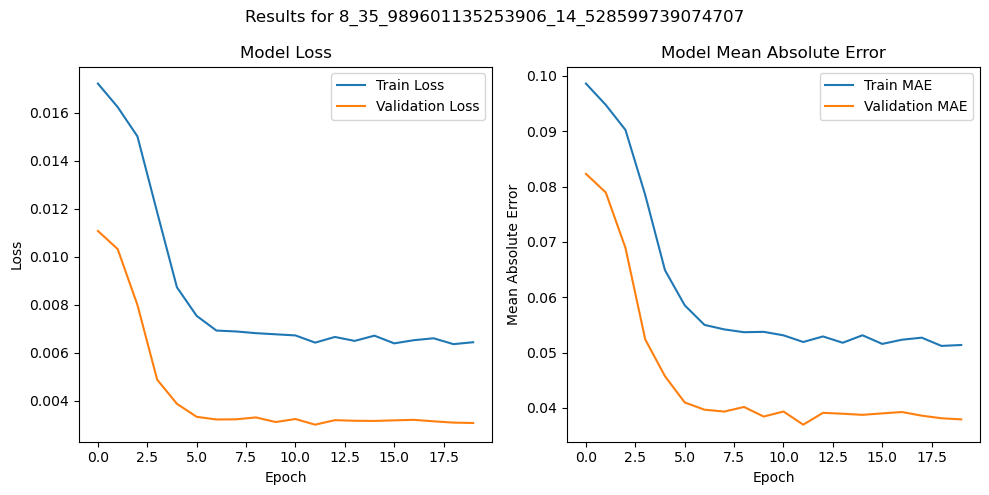

25/25 [==============================] - 11s 401ms/step

Test set Evaluation metrics for file: 8_35_989601135253906_14_528599739074707
Mean Squared Error (MSE): 0.002720995677901486
Mean Absolute Error (MAE): 0.038914955461208996
Root Mean Squared Error (RMSE): 0.05216316399435032



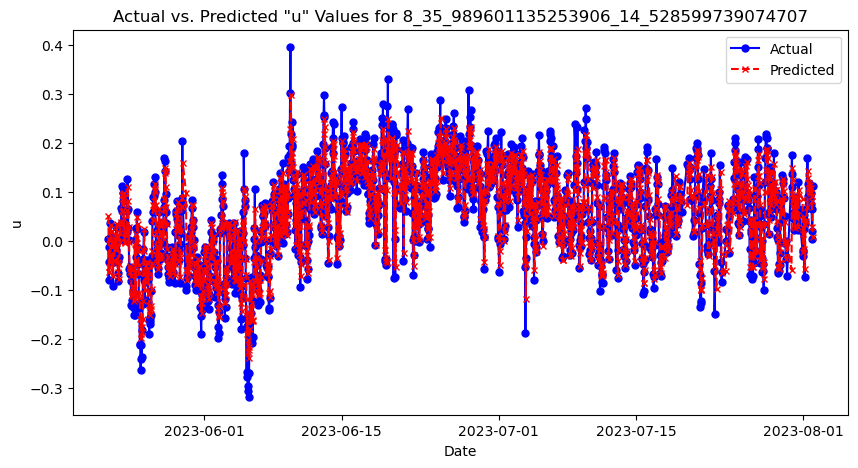

Model tarining & evaluation completed for file: 8_35_989601135253906_14_528599739074707.csv

Processing file: 9_35_989601135253906_14_569199562072754.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
117/117 [==============================] - ETA: 0s - loss: 0.0161 - mean_absolute_error: 0.0983INFO:tensorflow:Assets written to: Data/saved_models/models_u\9_35_989601135253906_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\9_35_989601135253906_14_569199562072754\assets


117/117 [==============================] - 170s 1s/step - loss: 0.0161 - mean_absolute_error: 0.0983 - val_loss: 0.0121 - val_mean_absolute_error: 0.0882
Epoch 2/100
117/117 [==============================] - ETA: 0s - loss: 0.0154 - mean_absolute_error: 0.0954INFO:tensorflow:Assets written to: Data/saved_models/models_u\9_35_989601135253906_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\9_35_989601135253906_14_569199562072754\assets


117/117 [==============================] - 160s 1s/step - loss: 0.0154 - mean_absolute_error: 0.0954 - val_loss: 0.0113 - val_mean_absolute_error: 0.0849
Epoch 3/100
117/117 [==============================] - ETA: 0s - loss: 0.0144 - mean_absolute_error: 0.0919INFO:tensorflow:Assets written to: Data/saved_models/models_u\9_35_989601135253906_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\9_35_989601135253906_14_569199562072754\assets


117/117 [==============================] - 158s 1s/step - loss: 0.0144 - mean_absolute_error: 0.0919 - val_loss: 0.0091 - val_mean_absolute_error: 0.0761
Epoch 4/100
117/117 [==============================] - ETA: 0s - loss: 0.0120 - mean_absolute_error: 0.0830INFO:tensorflow:Assets written to: Data/saved_models/models_u\9_35_989601135253906_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\9_35_989601135253906_14_569199562072754\assets


117/117 [==============================] - 173s 1s/step - loss: 0.0120 - mean_absolute_error: 0.0830 - val_loss: 0.0057 - val_mean_absolute_error: 0.0588
Epoch 5/100
117/117 [==============================] - ETA: 0s - loss: 0.0085 - mean_absolute_error: 0.0678INFO:tensorflow:Assets written to: Data/saved_models/models_u\9_35_989601135253906_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\9_35_989601135253906_14_569199562072754\assets


117/117 [==============================] - 172s 1s/step - loss: 0.0085 - mean_absolute_error: 0.0678 - val_loss: 0.0040 - val_mean_absolute_error: 0.0477
Epoch 6/100
117/117 [==============================] - ETA: 0s - loss: 0.0068 - mean_absolute_error: 0.0585INFO:tensorflow:Assets written to: Data/saved_models/models_u\9_35_989601135253906_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\9_35_989601135253906_14_569199562072754\assets


117/117 [==============================] - 173s 1s/step - loss: 0.0068 - mean_absolute_error: 0.0585 - val_loss: 0.0032 - val_mean_absolute_error: 0.0415
Epoch 7/100
117/117 [==============================] - ETA: 0s - loss: 0.0059 - mean_absolute_error: 0.0534INFO:tensorflow:Assets written to: Data/saved_models/models_u\9_35_989601135253906_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\9_35_989601135253906_14_569199562072754\assets


117/117 [==============================] - 174s 1s/step - loss: 0.0059 - mean_absolute_error: 0.0534 - val_loss: 0.0028 - val_mean_absolute_error: 0.0378
Epoch 8/100
117/117 [==============================] - ETA: 0s - loss: 0.0054 - mean_absolute_error: 0.0504INFO:tensorflow:Assets written to: Data/saved_models/models_u\9_35_989601135253906_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\9_35_989601135253906_14_569199562072754\assets


117/117 [==============================] - 174s 1s/step - loss: 0.0054 - mean_absolute_error: 0.0504 - val_loss: 0.0027 - val_mean_absolute_error: 0.0366
Epoch 9/100
117/117 [==============================] - 165s 1s/step - loss: 0.0052 - mean_absolute_error: 0.0492 - val_loss: 0.0027 - val_mean_absolute_error: 0.0363
Epoch 10/100
117/117 [==============================] - 164s 1s/step - loss: 0.0051 - mean_absolute_error: 0.0486 - val_loss: 0.0028 - val_mean_absolute_error: 0.0372
Epoch 11/100
117/117 [==============================] - ETA: 0s - loss: 0.0051 - mean_absolute_error: 0.0486INFO:tensorflow:Assets written to: Data/saved_models/models_u\9_35_989601135253906_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\9_35_989601135253906_14_569199562072754\assets


117/117 [==============================] - 176s 2s/step - loss: 0.0051 - mean_absolute_error: 0.0486 - val_loss: 0.0027 - val_mean_absolute_error: 0.0365
Epoch 12/100
117/117 [==============================] - ETA: 0s - loss: 0.0050 - mean_absolute_error: 0.0477INFO:tensorflow:Assets written to: Data/saved_models/models_u\9_35_989601135253906_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\9_35_989601135253906_14_569199562072754\assets


117/117 [==============================] - 176s 2s/step - loss: 0.0050 - mean_absolute_error: 0.0477 - val_loss: 0.0026 - val_mean_absolute_error: 0.0349
Epoch 13/100
117/117 [==============================] - 162s 1s/step - loss: 0.0051 - mean_absolute_error: 0.0479 - val_loss: 0.0027 - val_mean_absolute_error: 0.0357
Epoch 14/100
117/117 [==============================] - 162s 1s/step - loss: 0.0048 - mean_absolute_error: 0.0469 - val_loss: 0.0026 - val_mean_absolute_error: 0.0349
Epoch 15/100
117/117 [==============================] - 162s 1s/step - loss: 0.0050 - mean_absolute_error: 0.0474 - val_loss: 0.0026 - val_mean_absolute_error: 0.0354
Epoch 16/100
117/117 [==============================] - 168s 1s/step - loss: 0.0048 - mean_absolute_error: 0.0468 - val_loss: 0.0027 - val_mean_absolute_error: 0.0360
Epoch 17/100
117/117 [==============================] - 167s 1s/step - loss: 0.0047 - mean_absolute_error: 0.0463 - val_loss: 0.0027 - val_mean_absolute_error: 0.0357
Epoch 18/10

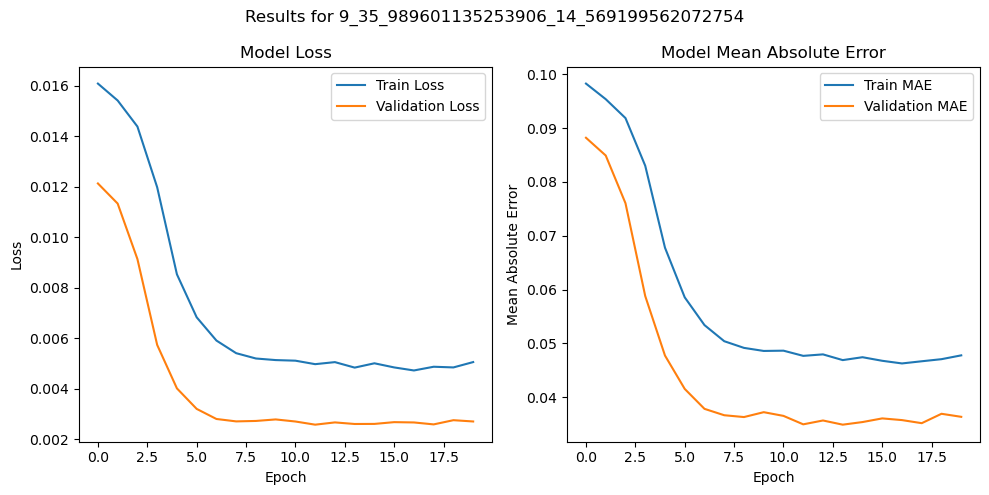

25/25 [==============================] - 12s 438ms/step

Test set Evaluation metrics for file: 9_35_989601135253906_14_569199562072754
Mean Squared Error (MSE): 0.0023900760245452878
Mean Absolute Error (MAE): 0.03710872313621021
Root Mean Squared Error (RMSE): 0.048888403783978136



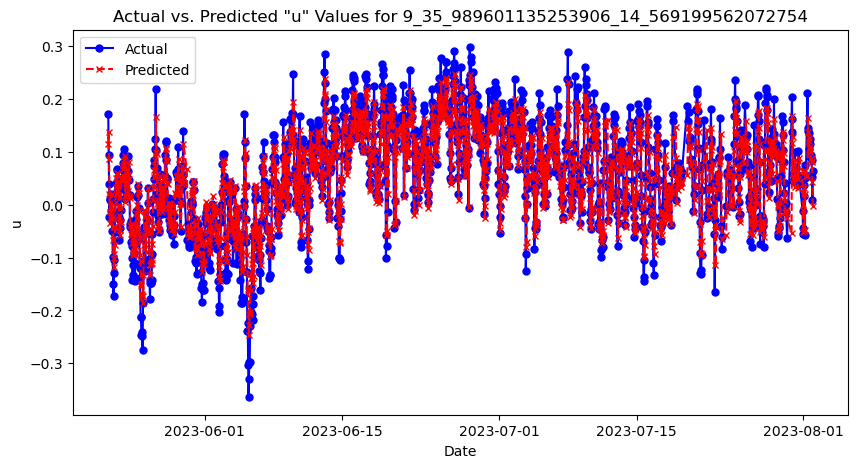

Model tarining & evaluation completed for file: 9_35_989601135253906_14_569199562072754.csv

Processing file: 10_36_01190185546875_14_447500228881836.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
102/102 [==============================] - ETA: 0s - loss: 0.0157 - mean_absolute_error: 0.0928INFO:tensorflow:Assets written to: Data/saved_models/models_u\10_36_01190185546875_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\10_36_01190185546875_14_447500228881836\assets


102/102 [==============================] - 160s 1s/step - loss: 0.0157 - mean_absolute_error: 0.0928 - val_loss: 0.0100 - val_mean_absolute_error: 0.0801
Epoch 2/100
102/102 [==============================] - ETA: 0s - loss: 0.0141 - mean_absolute_error: 0.0876INFO:tensorflow:Assets written to: Data/saved_models/models_u\10_36_01190185546875_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\10_36_01190185546875_14_447500228881836\assets


102/102 [==============================] - 151s 1s/step - loss: 0.0141 - mean_absolute_error: 0.0876 - val_loss: 0.0096 - val_mean_absolute_error: 0.0776
Epoch 3/100
102/102 [==============================] - ETA: 0s - loss: 0.0141 - mean_absolute_error: 0.0866INFO:tensorflow:Assets written to: Data/saved_models/models_u\10_36_01190185546875_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\10_36_01190185546875_14_447500228881836\assets


102/102 [==============================] - 150s 1s/step - loss: 0.0141 - mean_absolute_error: 0.0866 - val_loss: 0.0091 - val_mean_absolute_error: 0.0759
Epoch 4/100
102/102 [==============================] - ETA: 0s - loss: 0.0137 - mean_absolute_error: 0.0843INFO:tensorflow:Assets written to: Data/saved_models/models_u\10_36_01190185546875_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\10_36_01190185546875_14_447500228881836\assets


102/102 [==============================] - 162s 2s/step - loss: 0.0137 - mean_absolute_error: 0.0843 - val_loss: 0.0073 - val_mean_absolute_error: 0.0672
Epoch 5/100
102/102 [==============================] - ETA: 0s - loss: 0.0124 - mean_absolute_error: 0.0798INFO:tensorflow:Assets written to: Data/saved_models/models_u\10_36_01190185546875_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\10_36_01190185546875_14_447500228881836\assets


102/102 [==============================] - 159s 2s/step - loss: 0.0124 - mean_absolute_error: 0.0798 - val_loss: 0.0053 - val_mean_absolute_error: 0.0565
Epoch 6/100
102/102 [==============================] - ETA: 0s - loss: 0.0103 - mean_absolute_error: 0.0705INFO:tensorflow:Assets written to: Data/saved_models/models_u\10_36_01190185546875_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\10_36_01190185546875_14_447500228881836\assets


102/102 [==============================] - 160s 2s/step - loss: 0.0103 - mean_absolute_error: 0.0705 - val_loss: 0.0039 - val_mean_absolute_error: 0.0480
Epoch 7/100
102/102 [==============================] - ETA: 0s - loss: 0.0089 - mean_absolute_error: 0.0640INFO:tensorflow:Assets written to: Data/saved_models/models_u\10_36_01190185546875_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\10_36_01190185546875_14_447500228881836\assets


102/102 [==============================] - 160s 2s/step - loss: 0.0089 - mean_absolute_error: 0.0640 - val_loss: 0.0030 - val_mean_absolute_error: 0.0422
Epoch 8/100
102/102 [==============================] - ETA: 0s - loss: 0.0080 - mean_absolute_error: 0.0591INFO:tensorflow:Assets written to: Data/saved_models/models_u\10_36_01190185546875_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\10_36_01190185546875_14_447500228881836\assets


102/102 [==============================] - 162s 2s/step - loss: 0.0080 - mean_absolute_error: 0.0591 - val_loss: 0.0026 - val_mean_absolute_error: 0.0385
Epoch 9/100
102/102 [==============================] - ETA: 0s - loss: 0.0075 - mean_absolute_error: 0.0564INFO:tensorflow:Assets written to: Data/saved_models/models_u\10_36_01190185546875_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\10_36_01190185546875_14_447500228881836\assets


102/102 [==============================] - 159s 2s/step - loss: 0.0075 - mean_absolute_error: 0.0564 - val_loss: 0.0024 - val_mean_absolute_error: 0.0370
Epoch 10/100
102/102 [==============================] - 148s 1s/step - loss: 0.0073 - mean_absolute_error: 0.0547 - val_loss: 0.0026 - val_mean_absolute_error: 0.0391
Epoch 11/100
102/102 [==============================] - ETA: 0s - loss: 0.0074 - mean_absolute_error: 0.0549INFO:tensorflow:Assets written to: Data/saved_models/models_u\10_36_01190185546875_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\10_36_01190185546875_14_447500228881836\assets


102/102 [==============================] - 159s 2s/step - loss: 0.0074 - mean_absolute_error: 0.0549 - val_loss: 0.0024 - val_mean_absolute_error: 0.0363
Epoch 12/100
102/102 [==============================] - 146s 1s/step - loss: 0.0071 - mean_absolute_error: 0.0536 - val_loss: 0.0027 - val_mean_absolute_error: 0.0401
Epoch 13/100
102/102 [==============================] - 146s 1s/step - loss: 0.0072 - mean_absolute_error: 0.0538 - val_loss: 0.0026 - val_mean_absolute_error: 0.0390
Epoch 14/100
102/102 [==============================] - 146s 1s/step - loss: 0.0072 - mean_absolute_error: 0.0535 - val_loss: 0.0026 - val_mean_absolute_error: 0.0391
Epoch 15/100
102/102 [==============================] - 145s 1s/step - loss: 0.0068 - mean_absolute_error: 0.0522 - val_loss: 0.0025 - val_mean_absolute_error: 0.0380
Epoch 16/100
102/102 [==============================] - 146s 1s/step - loss: 0.0070 - mean_absolute_error: 0.0529 - val_loss: 0.0026 - val_mean_absolute_error: 0.0386
Epoch 17/10

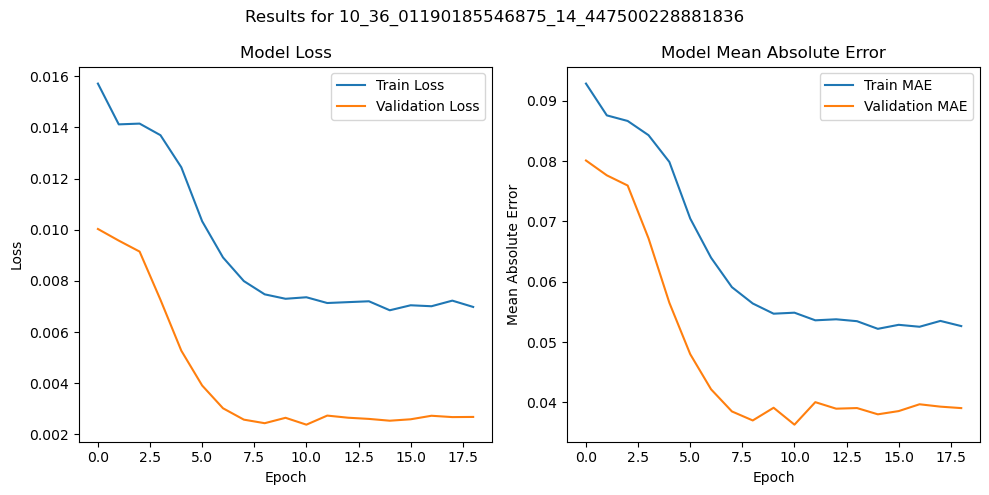

21/21 [==============================] - 11s 475ms/step

Test set Evaluation metrics for file: 10_36_01190185546875_14_447500228881836
Mean Squared Error (MSE): 0.0034193807750582074
Mean Absolute Error (MAE): 0.043377017472546506
Root Mean Squared Error (RMSE): 0.05847547156764285



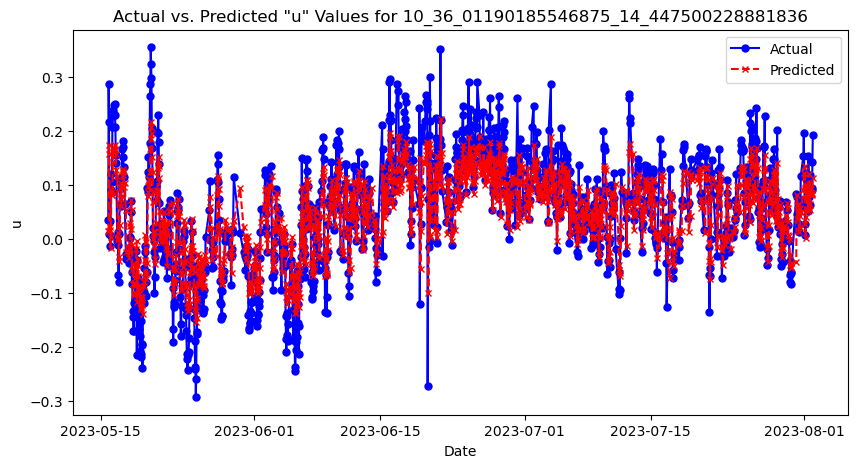

Model tarining & evaluation completed for file: 10_36_01190185546875_14_447500228881836.csv

Processing file: 11_36_01190185546875_14_48799991607666.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
121/121 [==============================] - ETA: 0s - loss: 0.0168 - mean_absolute_error: 0.0946INFO:tensorflow:Assets written to: Data/saved_models/models_u\11_36_01190185546875_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\11_36_01190185546875_14_48799991607666\assets


121/121 [==============================] - 188s 2s/step - loss: 0.0168 - mean_absolute_error: 0.0946 - val_loss: 0.0109 - val_mean_absolute_error: 0.0827
Epoch 2/100
121/121 [==============================] - ETA: 0s - loss: 0.0160 - mean_absolute_error: 0.0916INFO:tensorflow:Assets written to: Data/saved_models/models_u\11_36_01190185546875_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\11_36_01190185546875_14_48799991607666\assets


121/121 [==============================] - 181s 1s/step - loss: 0.0160 - mean_absolute_error: 0.0916 - val_loss: 0.0082 - val_mean_absolute_error: 0.0706
Epoch 3/100
121/121 [==============================] - ETA: 0s - loss: 0.0150 - mean_absolute_error: 0.0874INFO:tensorflow:Assets written to: Data/saved_models/models_u\11_36_01190185546875_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\11_36_01190185546875_14_48799991607666\assets


121/121 [==============================] - 189s 2s/step - loss: 0.0150 - mean_absolute_error: 0.0874 - val_loss: 0.0065 - val_mean_absolute_error: 0.0622
Epoch 4/100
121/121 [==============================] - ETA: 0s - loss: 0.0125 - mean_absolute_error: 0.0776INFO:tensorflow:Assets written to: Data/saved_models/models_u\11_36_01190185546875_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\11_36_01190185546875_14_48799991607666\assets


121/121 [==============================] - 189s 2s/step - loss: 0.0125 - mean_absolute_error: 0.0776 - val_loss: 0.0044 - val_mean_absolute_error: 0.0509
Epoch 5/100
121/121 [==============================] - ETA: 0s - loss: 0.0093 - mean_absolute_error: 0.0645INFO:tensorflow:Assets written to: Data/saved_models/models_u\11_36_01190185546875_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\11_36_01190185546875_14_48799991607666\assets


121/121 [==============================] - 188s 2s/step - loss: 0.0093 - mean_absolute_error: 0.0645 - val_loss: 0.0024 - val_mean_absolute_error: 0.0367
Epoch 6/100
121/121 [==============================] - ETA: 0s - loss: 0.0078 - mean_absolute_error: 0.0573INFO:tensorflow:Assets written to: Data/saved_models/models_u\11_36_01190185546875_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\11_36_01190185546875_14_48799991607666\assets


121/121 [==============================] - 189s 2s/step - loss: 0.0078 - mean_absolute_error: 0.0573 - val_loss: 0.0024 - val_mean_absolute_error: 0.0364
Epoch 7/100
121/121 [==============================] - ETA: 0s - loss: 0.0073 - mean_absolute_error: 0.0545INFO:tensorflow:Assets written to: Data/saved_models/models_u\11_36_01190185546875_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\11_36_01190185546875_14_48799991607666\assets


121/121 [==============================] - 192s 2s/step - loss: 0.0073 - mean_absolute_error: 0.0545 - val_loss: 0.0021 - val_mean_absolute_error: 0.0345
Epoch 8/100
121/121 [==============================] - ETA: 0s - loss: 0.0073 - mean_absolute_error: 0.0540INFO:tensorflow:Assets written to: Data/saved_models/models_u\11_36_01190185546875_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\11_36_01190185546875_14_48799991607666\assets


121/121 [==============================] - 190s 2s/step - loss: 0.0073 - mean_absolute_error: 0.0540 - val_loss: 0.0020 - val_mean_absolute_error: 0.0331
Epoch 9/100
121/121 [==============================] - ETA: 0s - loss: 0.0071 - mean_absolute_error: 0.0521INFO:tensorflow:Assets written to: Data/saved_models/models_u\11_36_01190185546875_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\11_36_01190185546875_14_48799991607666\assets


121/121 [==============================] - 189s 2s/step - loss: 0.0071 - mean_absolute_error: 0.0521 - val_loss: 0.0020 - val_mean_absolute_error: 0.0329
Epoch 10/100
121/121 [==============================] - ETA: 0s - loss: 0.0070 - mean_absolute_error: 0.0528INFO:tensorflow:Assets written to: Data/saved_models/models_u\11_36_01190185546875_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\11_36_01190185546875_14_48799991607666\assets


121/121 [==============================] - 188s 2s/step - loss: 0.0070 - mean_absolute_error: 0.0528 - val_loss: 0.0020 - val_mean_absolute_error: 0.0326
Epoch 11/100
121/121 [==============================] - ETA: 0s - loss: 0.0070 - mean_absolute_error: 0.0517INFO:tensorflow:Assets written to: Data/saved_models/models_u\11_36_01190185546875_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\11_36_01190185546875_14_48799991607666\assets


121/121 [==============================] - 214s 2s/step - loss: 0.0070 - mean_absolute_error: 0.0517 - val_loss: 0.0019 - val_mean_absolute_error: 0.0321
Epoch 12/100
121/121 [==============================] - 196s 2s/step - loss: 0.0070 - mean_absolute_error: 0.0517 - val_loss: 0.0019 - val_mean_absolute_error: 0.0326
Epoch 13/100
121/121 [==============================] - ETA: 0s - loss: 0.0070 - mean_absolute_error: 0.0520INFO:tensorflow:Assets written to: Data/saved_models/models_u\11_36_01190185546875_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\11_36_01190185546875_14_48799991607666\assets


121/121 [==============================] - 204s 2s/step - loss: 0.0070 - mean_absolute_error: 0.0520 - val_loss: 0.0019 - val_mean_absolute_error: 0.0321
Epoch 14/100
121/121 [==============================] - 204s 2s/step - loss: 0.0071 - mean_absolute_error: 0.0520 - val_loss: 0.0020 - val_mean_absolute_error: 0.0328
Epoch 15/100
121/121 [==============================] - 193s 2s/step - loss: 0.0071 - mean_absolute_error: 0.0517 - val_loss: 0.0019 - val_mean_absolute_error: 0.0321
Epoch 16/100
121/121 [==============================] - 192s 2s/step - loss: 0.0070 - mean_absolute_error: 0.0518 - val_loss: 0.0020 - val_mean_absolute_error: 0.0328
Epoch 17/100
121/121 [==============================] - 194s 2s/step - loss: 0.0069 - mean_absolute_error: 0.0517 - val_loss: 0.0019 - val_mean_absolute_error: 0.0322
Epoch 18/100
121/121 [==============================] - 192s 2s/step - loss: 0.0069 - mean_absolute_error: 0.0511 - val_loss: 0.0020 - val_mean_absolute_error: 0.0332
Epoch 19/10

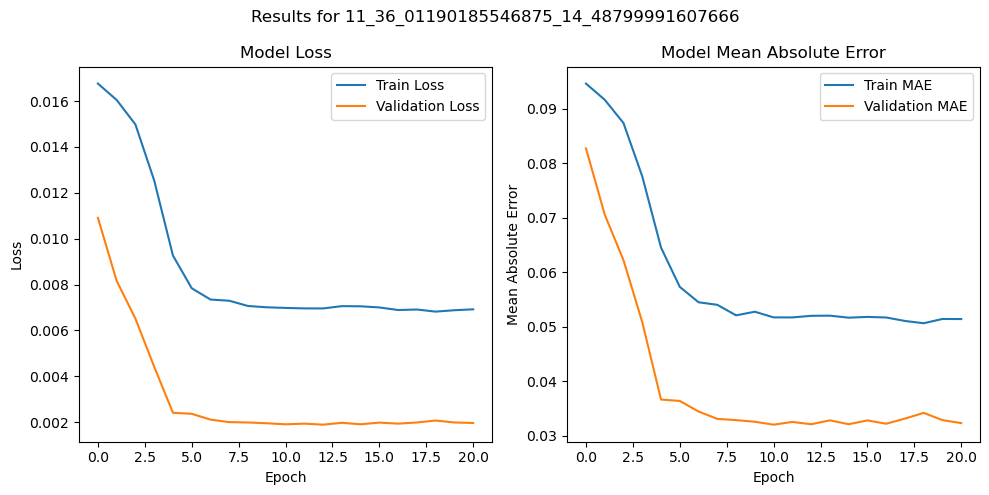

26/26 [==============================] - 15s 541ms/step

Test set Evaluation metrics for file: 11_36_01190185546875_14_48799991607666
Mean Squared Error (MSE): 0.002750431171146313
Mean Absolute Error (MAE): 0.03843082503840703
Root Mean Squared Error (RMSE): 0.05244455330295333



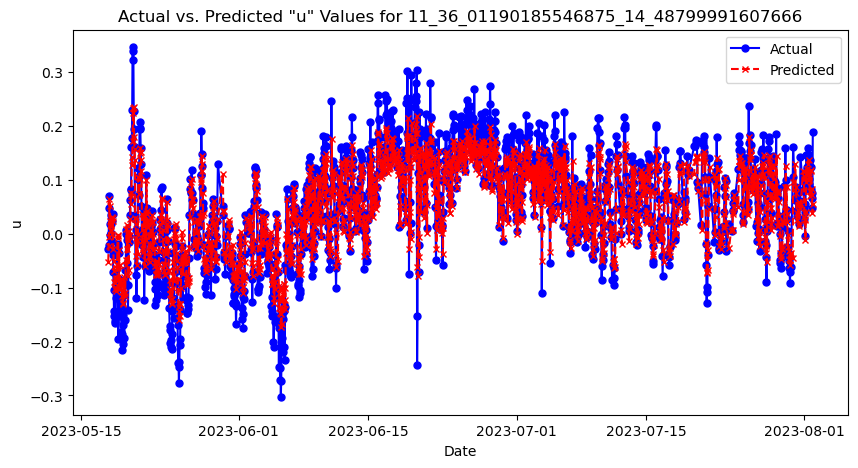

Model tarining & evaluation completed for file: 11_36_01190185546875_14_48799991607666.csv

Processing file: 12_36_01190185546875_14_528599739074707.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
135/135 [==============================] - ETA: 0s - loss: 0.0216 - mean_absolute_error: 0.1078INFO:tensorflow:Assets written to: Data/saved_models/models_u\12_36_01190185546875_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\12_36_01190185546875_14_528599739074707\assets


135/135 [==============================] - 224s 2s/step - loss: 0.0216 - mean_absolute_error: 0.1078 - val_loss: 0.0155 - val_mean_absolute_error: 0.0928
Epoch 2/100
135/135 [==============================] - ETA: 0s - loss: 0.0193 - mean_absolute_error: 0.0997INFO:tensorflow:Assets written to: Data/saved_models/models_u\12_36_01190185546875_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\12_36_01190185546875_14_528599739074707\assets


135/135 [==============================] - 236s 2s/step - loss: 0.0193 - mean_absolute_error: 0.0997 - val_loss: 0.0133 - val_mean_absolute_error: 0.0850
Epoch 3/100
135/135 [==============================] - ETA: 0s - loss: 0.0177 - mean_absolute_error: 0.0949INFO:tensorflow:Assets written to: Data/saved_models/models_u\12_36_01190185546875_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\12_36_01190185546875_14_528599739074707\assets


135/135 [==============================] - 241s 2s/step - loss: 0.0177 - mean_absolute_error: 0.0949 - val_loss: 0.0100 - val_mean_absolute_error: 0.0726
Epoch 4/100
135/135 [==============================] - ETA: 0s - loss: 0.0141 - mean_absolute_error: 0.0820INFO:tensorflow:Assets written to: Data/saved_models/models_u\12_36_01190185546875_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\12_36_01190185546875_14_528599739074707\assets


135/135 [==============================] - 240s 2s/step - loss: 0.0141 - mean_absolute_error: 0.0820 - val_loss: 0.0072 - val_mean_absolute_error: 0.0602
Epoch 5/100
135/135 [==============================] - ETA: 0s - loss: 0.0107 - mean_absolute_error: 0.0691INFO:tensorflow:Assets written to: Data/saved_models/models_u\12_36_01190185546875_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\12_36_01190185546875_14_528599739074707\assets


135/135 [==============================] - 239s 2s/step - loss: 0.0107 - mean_absolute_error: 0.0691 - val_loss: 0.0061 - val_mean_absolute_error: 0.0546
Epoch 6/100
135/135 [==============================] - ETA: 0s - loss: 0.0090 - mean_absolute_error: 0.0608INFO:tensorflow:Assets written to: Data/saved_models/models_u\12_36_01190185546875_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\12_36_01190185546875_14_528599739074707\assets


135/135 [==============================] - 239s 2s/step - loss: 0.0090 - mean_absolute_error: 0.0608 - val_loss: 0.0049 - val_mean_absolute_error: 0.0463
Epoch 7/100
135/135 [==============================] - ETA: 0s - loss: 0.0083 - mean_absolute_error: 0.0583INFO:tensorflow:Assets written to: Data/saved_models/models_u\12_36_01190185546875_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\12_36_01190185546875_14_528599739074707\assets


135/135 [==============================] - 239s 2s/step - loss: 0.0083 - mean_absolute_error: 0.0583 - val_loss: 0.0046 - val_mean_absolute_error: 0.0442
Epoch 8/100
135/135 [==============================] - 228s 2s/step - loss: 0.0082 - mean_absolute_error: 0.0569 - val_loss: 0.0048 - val_mean_absolute_error: 0.0457
Epoch 9/100
135/135 [==============================] - ETA: 0s - loss: 0.0080 - mean_absolute_error: 0.0563INFO:tensorflow:Assets written to: Data/saved_models/models_u\12_36_01190185546875_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\12_36_01190185546875_14_528599739074707\assets


135/135 [==============================] - 239s 2s/step - loss: 0.0080 - mean_absolute_error: 0.0563 - val_loss: 0.0046 - val_mean_absolute_error: 0.0439
Epoch 10/100
135/135 [==============================] - 230s 2s/step - loss: 0.0082 - mean_absolute_error: 0.0573 - val_loss: 0.0048 - val_mean_absolute_error: 0.0456
Epoch 11/100
135/135 [==============================] - ETA: 0s - loss: 0.0079 - mean_absolute_error: 0.0558INFO:tensorflow:Assets written to: Data/saved_models/models_u\12_36_01190185546875_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\12_36_01190185546875_14_528599739074707\assets


135/135 [==============================] - 239s 2s/step - loss: 0.0079 - mean_absolute_error: 0.0558 - val_loss: 0.0045 - val_mean_absolute_error: 0.0432
Epoch 12/100
135/135 [==============================] - 227s 2s/step - loss: 0.0080 - mean_absolute_error: 0.0555 - val_loss: 0.0046 - val_mean_absolute_error: 0.0441
Epoch 13/100
135/135 [==============================] - 228s 2s/step - loss: 0.0080 - mean_absolute_error: 0.0558 - val_loss: 0.0046 - val_mean_absolute_error: 0.0441
Epoch 14/100
135/135 [==============================] - 228s 2s/step - loss: 0.0083 - mean_absolute_error: 0.0568 - val_loss: 0.0046 - val_mean_absolute_error: 0.0437
Epoch 15/100
135/135 [==============================] - 228s 2s/step - loss: 0.0078 - mean_absolute_error: 0.0547 - val_loss: 0.0047 - val_mean_absolute_error: 0.0449
Epoch 16/100
135/135 [==============================] - 227s 2s/step - loss: 0.0079 - mean_absolute_error: 0.0554 - val_loss: 0.0048 - val_mean_absolute_error: 0.0454
Epoch 17/10

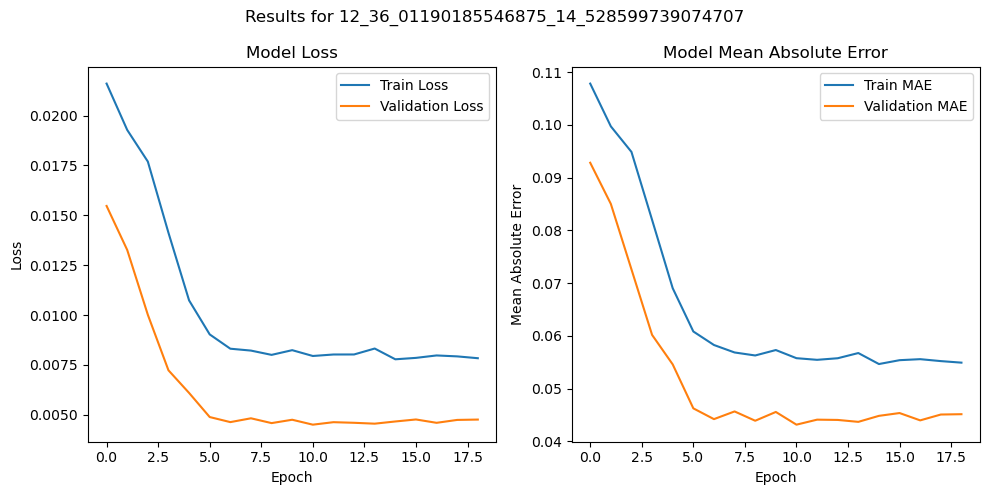

28/28 [==============================] - 18s 602ms/step

Test set Evaluation metrics for file: 12_36_01190185546875_14_528599739074707
Mean Squared Error (MSE): 0.0025178219585344926
Mean Absolute Error (MAE): 0.038000413057201574
Root Mean Squared Error (RMSE): 0.05017790309024972



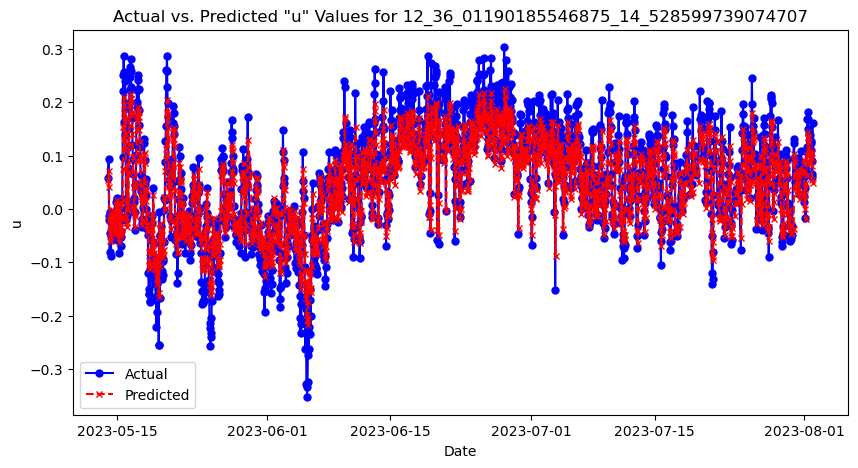

Model tarining & evaluation completed for file: 12_36_01190185546875_14_528599739074707.csv

Processing file: 13_36_01190185546875_14_569199562072754.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
133/133 [==============================] - ETA: 0s - loss: 0.0178 - mean_absolute_error: 0.0977INFO:tensorflow:Assets written to: Data/saved_models/models_u\13_36_01190185546875_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\13_36_01190185546875_14_569199562072754\assets


133/133 [==============================] - 247s 2s/step - loss: 0.0178 - mean_absolute_error: 0.0977 - val_loss: 0.0138 - val_mean_absolute_error: 0.0911
Epoch 2/100
133/133 [==============================] - ETA: 0s - loss: 0.0177 - mean_absolute_error: 0.0978INFO:tensorflow:Assets written to: Data/saved_models/models_u\13_36_01190185546875_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\13_36_01190185546875_14_569199562072754\assets


133/133 [==============================] - 238s 2s/step - loss: 0.0177 - mean_absolute_error: 0.0978 - val_loss: 0.0128 - val_mean_absolute_error: 0.0871
Epoch 3/100
133/133 [==============================] - ETA: 0s - loss: 0.0163 - mean_absolute_error: 0.0932INFO:tensorflow:Assets written to: Data/saved_models/models_u\13_36_01190185546875_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\13_36_01190185546875_14_569199562072754\assets


133/133 [==============================] - 238s 2s/step - loss: 0.0163 - mean_absolute_error: 0.0932 - val_loss: 0.0102 - val_mean_absolute_error: 0.0767
Epoch 4/100
133/133 [==============================] - ETA: 0s - loss: 0.0135 - mean_absolute_error: 0.0825INFO:tensorflow:Assets written to: Data/saved_models/models_u\13_36_01190185546875_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\13_36_01190185546875_14_569199562072754\assets


133/133 [==============================] - 234s 2s/step - loss: 0.0135 - mean_absolute_error: 0.0825 - val_loss: 0.0067 - val_mean_absolute_error: 0.0616
Epoch 5/100
133/133 [==============================] - ETA: 0s - loss: 0.0106 - mean_absolute_error: 0.0709INFO:tensorflow:Assets written to: Data/saved_models/models_u\13_36_01190185546875_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\13_36_01190185546875_14_569199562072754\assets


133/133 [==============================] - 241s 2s/step - loss: 0.0106 - mean_absolute_error: 0.0709 - val_loss: 0.0044 - val_mean_absolute_error: 0.0472
Epoch 6/100
133/133 [==============================] - ETA: 0s - loss: 0.0086 - mean_absolute_error: 0.0623INFO:tensorflow:Assets written to: Data/saved_models/models_u\13_36_01190185546875_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\13_36_01190185546875_14_569199562072754\assets


133/133 [==============================] - 228s 2s/step - loss: 0.0086 - mean_absolute_error: 0.0623 - val_loss: 0.0037 - val_mean_absolute_error: 0.0415
Epoch 7/100
133/133 [==============================] - ETA: 0s - loss: 0.0073 - mean_absolute_error: 0.0562INFO:tensorflow:Assets written to: Data/saved_models/models_u\13_36_01190185546875_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\13_36_01190185546875_14_569199562072754\assets


133/133 [==============================] - 229s 2s/step - loss: 0.0073 - mean_absolute_error: 0.0562 - val_loss: 0.0033 - val_mean_absolute_error: 0.0386
Epoch 8/100
133/133 [==============================] - 219s 2s/step - loss: 0.0066 - mean_absolute_error: 0.0529 - val_loss: 0.0033 - val_mean_absolute_error: 0.0388
Epoch 9/100
133/133 [==============================] - ETA: 0s - loss: 0.0067 - mean_absolute_error: 0.0530INFO:tensorflow:Assets written to: Data/saved_models/models_u\13_36_01190185546875_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\13_36_01190185546875_14_569199562072754\assets


133/133 [==============================] - 228s 2s/step - loss: 0.0067 - mean_absolute_error: 0.0530 - val_loss: 0.0032 - val_mean_absolute_error: 0.0372
Epoch 10/100
133/133 [==============================] - 217s 2s/step - loss: 0.0065 - mean_absolute_error: 0.0517 - val_loss: 0.0033 - val_mean_absolute_error: 0.0386
Epoch 11/100
133/133 [==============================] - 217s 2s/step - loss: 0.0064 - mean_absolute_error: 0.0511 - val_loss: 0.0032 - val_mean_absolute_error: 0.0370
Epoch 12/100
133/133 [==============================] - 216s 2s/step - loss: 0.0064 - mean_absolute_error: 0.0512 - val_loss: 0.0032 - val_mean_absolute_error: 0.0369
Epoch 13/100
133/133 [==============================] - 216s 2s/step - loss: 0.0063 - mean_absolute_error: 0.0510 - val_loss: 0.0033 - val_mean_absolute_error: 0.0380
Epoch 14/100
133/133 [==============================] - 216s 2s/step - loss: 0.0064 - mean_absolute_error: 0.0513 - val_loss: 0.0033 - val_mean_absolute_error: 0.0377
Epoch 15/10

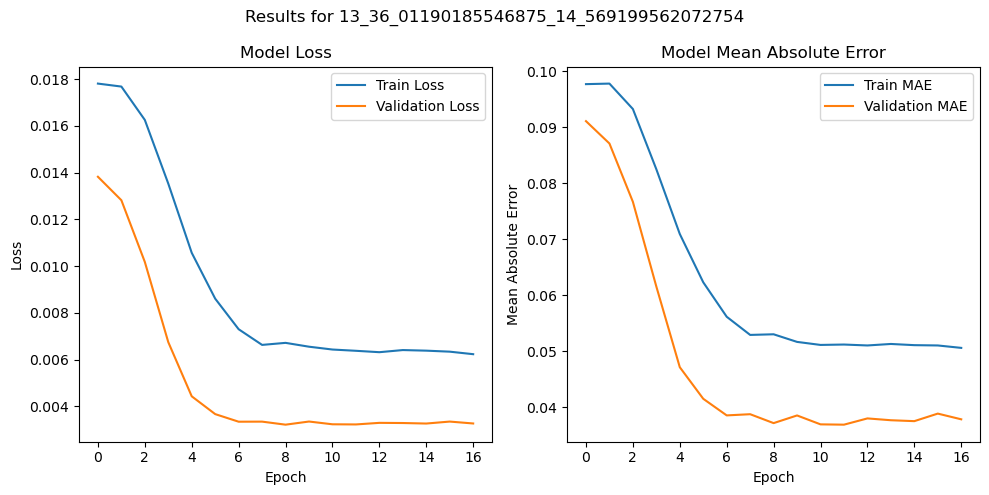

28/28 [==============================] - 18s 611ms/step

Test set Evaluation metrics for file: 13_36_01190185546875_14_569199562072754
Mean Squared Error (MSE): 0.00211176414133332
Mean Absolute Error (MAE): 0.03500066806183928
Root Mean Squared Error (RMSE): 0.045953934992917854



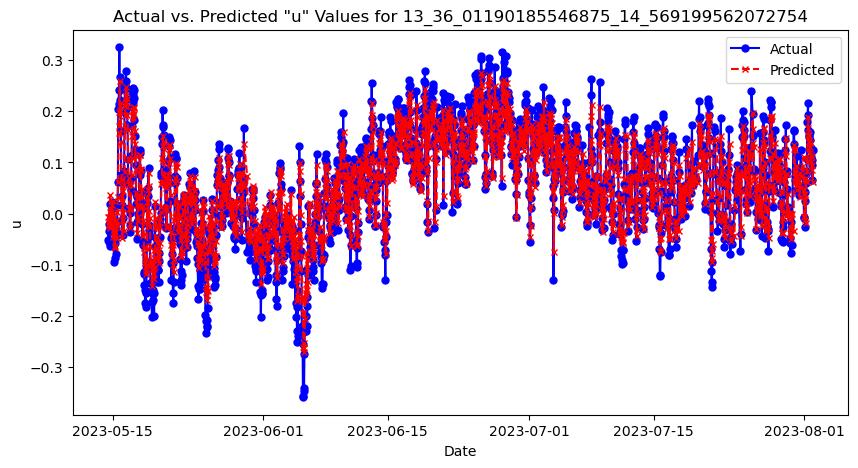

Model tarining & evaluation completed for file: 13_36_01190185546875_14_569199562072754.csv

Processing file: 14_36_03409957885742_14_447500228881836.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
125/125 [==============================] - ETA: 0s - loss: 0.0153 - mean_absolute_error: 0.0928INFO:tensorflow:Assets written to: Data/saved_models/models_u\14_36_03409957885742_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\14_36_03409957885742_14_447500228881836\assets


125/125 [==============================] - 219s 2s/step - loss: 0.0153 - mean_absolute_error: 0.0928 - val_loss: 0.0122 - val_mean_absolute_error: 0.0855
Epoch 2/100
125/125 [==============================] - ETA: 0s - loss: 0.0144 - mean_absolute_error: 0.0886INFO:tensorflow:Assets written to: Data/saved_models/models_u\14_36_03409957885742_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\14_36_03409957885742_14_447500228881836\assets


125/125 [==============================] - 212s 2s/step - loss: 0.0144 - mean_absolute_error: 0.0886 - val_loss: 0.0106 - val_mean_absolute_error: 0.0786
Epoch 3/100
125/125 [==============================] - ETA: 0s - loss: 0.0128 - mean_absolute_error: 0.0819INFO:tensorflow:Assets written to: Data/saved_models/models_u\14_36_03409957885742_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\14_36_03409957885742_14_447500228881836\assets


125/125 [==============================] - 213s 2s/step - loss: 0.0128 - mean_absolute_error: 0.0819 - val_loss: 0.0087 - val_mean_absolute_error: 0.0701
Epoch 4/100
125/125 [==============================] - ETA: 0s - loss: 0.0104 - mean_absolute_error: 0.0715INFO:tensorflow:Assets written to: Data/saved_models/models_u\14_36_03409957885742_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\14_36_03409957885742_14_447500228881836\assets


125/125 [==============================] - 213s 2s/step - loss: 0.0104 - mean_absolute_error: 0.0715 - val_loss: 0.0058 - val_mean_absolute_error: 0.0513
Epoch 5/100
125/125 [==============================] - ETA: 0s - loss: 0.0083 - mean_absolute_error: 0.0617INFO:tensorflow:Assets written to: Data/saved_models/models_u\14_36_03409957885742_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\14_36_03409957885742_14_447500228881836\assets


125/125 [==============================] - 213s 2s/step - loss: 0.0083 - mean_absolute_error: 0.0617 - val_loss: 0.0048 - val_mean_absolute_error: 0.0435
Epoch 6/100
125/125 [==============================] - ETA: 0s - loss: 0.0073 - mean_absolute_error: 0.0564INFO:tensorflow:Assets written to: Data/saved_models/models_u\14_36_03409957885742_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\14_36_03409957885742_14_447500228881836\assets


125/125 [==============================] - 213s 2s/step - loss: 0.0073 - mean_absolute_error: 0.0564 - val_loss: 0.0044 - val_mean_absolute_error: 0.0412
Epoch 7/100
125/125 [==============================] - ETA: 0s - loss: 0.0068 - mean_absolute_error: 0.0534INFO:tensorflow:Assets written to: Data/saved_models/models_u\14_36_03409957885742_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\14_36_03409957885742_14_447500228881836\assets


125/125 [==============================] - 213s 2s/step - loss: 0.0068 - mean_absolute_error: 0.0534 - val_loss: 0.0041 - val_mean_absolute_error: 0.0381
Epoch 8/100
125/125 [==============================] - ETA: 0s - loss: 0.0065 - mean_absolute_error: 0.0513INFO:tensorflow:Assets written to: Data/saved_models/models_u\14_36_03409957885742_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\14_36_03409957885742_14_447500228881836\assets


125/125 [==============================] - 213s 2s/step - loss: 0.0065 - mean_absolute_error: 0.0513 - val_loss: 0.0041 - val_mean_absolute_error: 0.0385
Epoch 9/100
125/125 [==============================] - ETA: 0s - loss: 0.0065 - mean_absolute_error: 0.0514INFO:tensorflow:Assets written to: Data/saved_models/models_u\14_36_03409957885742_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\14_36_03409957885742_14_447500228881836\assets


125/125 [==============================] - 212s 2s/step - loss: 0.0065 - mean_absolute_error: 0.0514 - val_loss: 0.0039 - val_mean_absolute_error: 0.0374
Epoch 10/100
125/125 [==============================] - 224s 2s/step - loss: 0.0063 - mean_absolute_error: 0.0499 - val_loss: 0.0041 - val_mean_absolute_error: 0.0397
Epoch 11/100
125/125 [==============================] - 223s 2s/step - loss: 0.0064 - mean_absolute_error: 0.0505 - val_loss: 0.0040 - val_mean_absolute_error: 0.0376
Epoch 12/100
125/125 [==============================] - 224s 2s/step - loss: 0.0065 - mean_absolute_error: 0.0512 - val_loss: 0.0040 - val_mean_absolute_error: 0.0381
Epoch 13/100
125/125 [==============================] - ETA: 0s - loss: 0.0063 - mean_absolute_error: 0.0499INFO:tensorflow:Assets written to: Data/saved_models/models_u\14_36_03409957885742_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\14_36_03409957885742_14_447500228881836\assets


125/125 [==============================] - 235s 2s/step - loss: 0.0063 - mean_absolute_error: 0.0499 - val_loss: 0.0039 - val_mean_absolute_error: 0.0364
Epoch 14/100
125/125 [==============================] - 215s 2s/step - loss: 0.0064 - mean_absolute_error: 0.0501 - val_loss: 0.0039 - val_mean_absolute_error: 0.0369
Epoch 15/100
125/125 [==============================] - 215s 2s/step - loss: 0.0062 - mean_absolute_error: 0.0497 - val_loss: 0.0039 - val_mean_absolute_error: 0.0370
Epoch 16/100
125/125 [==============================] - 210s 2s/step - loss: 0.0063 - mean_absolute_error: 0.0500 - val_loss: 0.0039 - val_mean_absolute_error: 0.0367
Epoch 17/100
125/125 [==============================] - 210s 2s/step - loss: 0.0063 - mean_absolute_error: 0.0498 - val_loss: 0.0040 - val_mean_absolute_error: 0.0382
Epoch 18/100
125/125 [==============================] - 210s 2s/step - loss: 0.0062 - mean_absolute_error: 0.0496 - val_loss: 0.0039 - val_mean_absolute_error: 0.0371
Epoch 19/10

INFO:tensorflow:Assets written to: Data/saved_models/models_u\14_36_03409957885742_14_447500228881836\assets


125/125 [==============================] - 219s 2s/step - loss: 0.0062 - mean_absolute_error: 0.0489 - val_loss: 0.0038 - val_mean_absolute_error: 0.0362
Epoch 22/100
125/125 [==============================] - 211s 2s/step - loss: 0.0064 - mean_absolute_error: 0.0499 - val_loss: 0.0040 - val_mean_absolute_error: 0.0379
Epoch 23/100
125/125 [==============================] - 211s 2s/step - loss: 0.0061 - mean_absolute_error: 0.0487 - val_loss: 0.0038 - val_mean_absolute_error: 0.0365
Epoch 24/100
125/125 [==============================] - 211s 2s/step - loss: 0.0065 - mean_absolute_error: 0.0506 - val_loss: 0.0040 - val_mean_absolute_error: 0.0383
Epoch 25/100
125/125 [==============================] - 211s 2s/step - loss: 0.0061 - mean_absolute_error: 0.0486 - val_loss: 0.0039 - val_mean_absolute_error: 0.0379
Epoch 26/100
125/125 [==============================] - 211s 2s/step - loss: 0.0060 - mean_absolute_error: 0.0480 - val_loss: 0.0039 - val_mean_absolute_error: 0.0376
Epoch 27/10

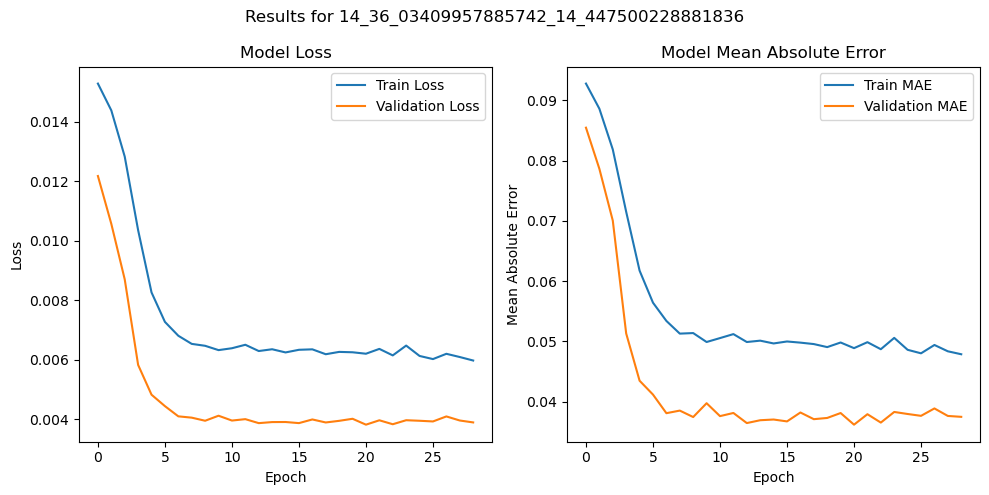

26/26 [==============================] - 18s 631ms/step

Test set Evaluation metrics for file: 14_36_03409957885742_14_447500228881836
Mean Squared Error (MSE): 0.002473700498863252
Mean Absolute Error (MAE): 0.03772363180729057
Root Mean Squared Error (RMSE): 0.04973630966269263



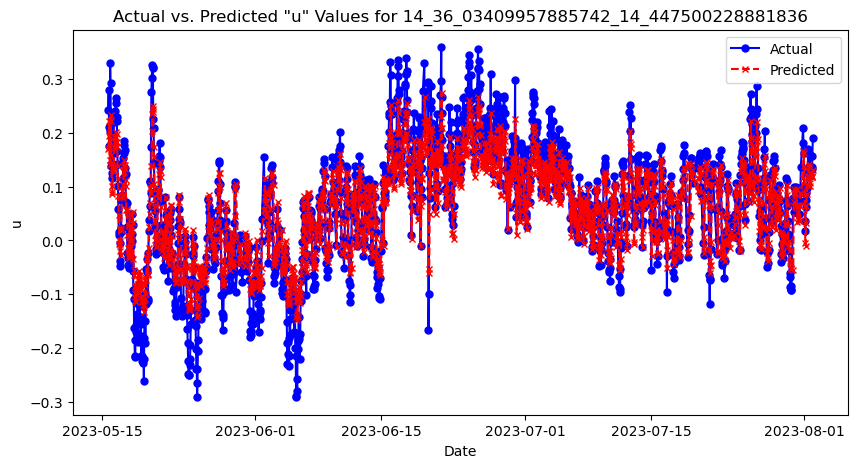

Model tarining & evaluation completed for file: 14_36_03409957885742_14_447500228881836.csv

Processing file: 15_36_03409957885742_14_48799991607666.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
137/137 [==============================] - ETA: 0s - loss: 0.0192 - mean_absolute_error: 0.1011INFO:tensorflow:Assets written to: Data/saved_models/models_u\15_36_03409957885742_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\15_36_03409957885742_14_48799991607666\assets


137/137 [==============================] - 247s 2s/step - loss: 0.0192 - mean_absolute_error: 0.1011 - val_loss: 0.0144 - val_mean_absolute_error: 0.0875
Epoch 2/100
137/137 [==============================] - ETA: 0s - loss: 0.0178 - mean_absolute_error: 0.0968INFO:tensorflow:Assets written to: Data/saved_models/models_u\15_36_03409957885742_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\15_36_03409957885742_14_48799991607666\assets


137/137 [==============================] - 238s 2s/step - loss: 0.0178 - mean_absolute_error: 0.0968 - val_loss: 0.0125 - val_mean_absolute_error: 0.0800
Epoch 3/100
137/137 [==============================] - ETA: 0s - loss: 0.0154 - mean_absolute_error: 0.0876INFO:tensorflow:Assets written to: Data/saved_models/models_u\15_36_03409957885742_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\15_36_03409957885742_14_48799991607666\assets


137/137 [==============================] - 237s 2s/step - loss: 0.0154 - mean_absolute_error: 0.0876 - val_loss: 0.0097 - val_mean_absolute_error: 0.0671
Epoch 4/100
137/137 [==============================] - ETA: 0s - loss: 0.0129 - mean_absolute_error: 0.0780INFO:tensorflow:Assets written to: Data/saved_models/models_u\15_36_03409957885742_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\15_36_03409957885742_14_48799991607666\assets


137/137 [==============================] - 234s 2s/step - loss: 0.0129 - mean_absolute_error: 0.0780 - val_loss: 0.0076 - val_mean_absolute_error: 0.0535
Epoch 5/100
137/137 [==============================] - ETA: 0s - loss: 0.0096 - mean_absolute_error: 0.0649INFO:tensorflow:Assets written to: Data/saved_models/models_u\15_36_03409957885742_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\15_36_03409957885742_14_48799991607666\assets


137/137 [==============================] - 249s 2s/step - loss: 0.0096 - mean_absolute_error: 0.0649 - val_loss: 0.0065 - val_mean_absolute_error: 0.0469
Epoch 6/100
137/137 [==============================] - ETA: 0s - loss: 0.0086 - mean_absolute_error: 0.0593INFO:tensorflow:Assets written to: Data/saved_models/models_u\15_36_03409957885742_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\15_36_03409957885742_14_48799991607666\assets


137/137 [==============================] - 242s 2s/step - loss: 0.0086 - mean_absolute_error: 0.0593 - val_loss: 0.0059 - val_mean_absolute_error: 0.0429
Epoch 7/100
137/137 [==============================] - ETA: 0s - loss: 0.0082 - mean_absolute_error: 0.0572INFO:tensorflow:Assets written to: Data/saved_models/models_u\15_36_03409957885742_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\15_36_03409957885742_14_48799991607666\assets


137/137 [==============================] - 243s 2s/step - loss: 0.0082 - mean_absolute_error: 0.0572 - val_loss: 0.0057 - val_mean_absolute_error: 0.0429
Epoch 8/100
137/137 [==============================] - ETA: 0s - loss: 0.0077 - mean_absolute_error: 0.0547INFO:tensorflow:Assets written to: Data/saved_models/models_u\15_36_03409957885742_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\15_36_03409957885742_14_48799991607666\assets


137/137 [==============================] - 244s 2s/step - loss: 0.0077 - mean_absolute_error: 0.0547 - val_loss: 0.0054 - val_mean_absolute_error: 0.0397
Epoch 9/100
137/137 [==============================] - ETA: 0s - loss: 0.0081 - mean_absolute_error: 0.0558INFO:tensorflow:Assets written to: Data/saved_models/models_u\15_36_03409957885742_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\15_36_03409957885742_14_48799991607666\assets


137/137 [==============================] - 242s 2s/step - loss: 0.0081 - mean_absolute_error: 0.0558 - val_loss: 0.0053 - val_mean_absolute_error: 0.0389
Epoch 10/100
137/137 [==============================] - 249s 2s/step - loss: 0.0077 - mean_absolute_error: 0.0550 - val_loss: 0.0054 - val_mean_absolute_error: 0.0404
Epoch 11/100
137/137 [==============================] - 246s 2s/step - loss: 0.0077 - mean_absolute_error: 0.0546 - val_loss: 0.0054 - val_mean_absolute_error: 0.0398
Epoch 12/100
137/137 [==============================] - 250s 2s/step - loss: 0.0078 - mean_absolute_error: 0.0549 - val_loss: 0.0054 - val_mean_absolute_error: 0.0409
Epoch 13/100
137/137 [==============================] - 250s 2s/step - loss: 0.0074 - mean_absolute_error: 0.0532 - val_loss: 0.0055 - val_mean_absolute_error: 0.0406
Epoch 14/100
137/137 [==============================] - 250s 2s/step - loss: 0.0075 - mean_absolute_error: 0.0534 - val_loss: 0.0054 - val_mean_absolute_error: 0.0414
Epoch 15/10

INFO:tensorflow:Assets written to: Data/saved_models/models_u\15_36_03409957885742_14_48799991607666\assets


137/137 [==============================] - 262s 2s/step - loss: 0.0075 - mean_absolute_error: 0.0536 - val_loss: 0.0053 - val_mean_absolute_error: 0.0394
Epoch 18/100
137/137 [==============================] - ETA: 0s - loss: 0.0075 - mean_absolute_error: 0.0537INFO:tensorflow:Assets written to: Data/saved_models/models_u\15_36_03409957885742_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\15_36_03409957885742_14_48799991607666\assets


137/137 [==============================] - 256s 2s/step - loss: 0.0075 - mean_absolute_error: 0.0537 - val_loss: 0.0053 - val_mean_absolute_error: 0.0394
Epoch 19/100
137/137 [==============================] - 240s 2s/step - loss: 0.0075 - mean_absolute_error: 0.0529 - val_loss: 0.0054 - val_mean_absolute_error: 0.0402
Epoch 20/100
137/137 [==============================] - 244s 2s/step - loss: 0.0075 - mean_absolute_error: 0.0528 - val_loss: 0.0054 - val_mean_absolute_error: 0.0404
Epoch 21/100
137/137 [==============================] - 244s 2s/step - loss: 0.0075 - mean_absolute_error: 0.0536 - val_loss: 0.0054 - val_mean_absolute_error: 0.0410
Epoch 22/100
137/137 [==============================] - 244s 2s/step - loss: 0.0076 - mean_absolute_error: 0.0534 - val_loss: 0.0056 - val_mean_absolute_error: 0.0422
Epoch 23/100
137/137 [==============================] - 244s 2s/step - loss: 0.0073 - mean_absolute_error: 0.0528 - val_loss: 0.0055 - val_mean_absolute_error: 0.0415
Epoch 24/10

INFO:tensorflow:Assets written to: Data/saved_models/models_u\15_36_03409957885742_14_48799991607666\assets


137/137 [==============================] - 255s 2s/step - loss: 0.0075 - mean_absolute_error: 0.0526 - val_loss: 0.0053 - val_mean_absolute_error: 0.0394
Epoch 26/100
137/137 [==============================] - 246s 2s/step - loss: 0.0075 - mean_absolute_error: 0.0527 - val_loss: 0.0053 - val_mean_absolute_error: 0.0405
Epoch 27/100
137/137 [==============================] - 248s 2s/step - loss: 0.0072 - mean_absolute_error: 0.0520 - val_loss: 0.0054 - val_mean_absolute_error: 0.0397
Epoch 28/100
137/137 [==============================] - 246s 2s/step - loss: 0.0074 - mean_absolute_error: 0.0526 - val_loss: 0.0054 - val_mean_absolute_error: 0.0403
Epoch 29/100
137/137 [==============================] - 246s 2s/step - loss: 0.0074 - mean_absolute_error: 0.0525 - val_loss: 0.0054 - val_mean_absolute_error: 0.0408
Epoch 30/100
137/137 [==============================] - 245s 2s/step - loss: 0.0075 - mean_absolute_error: 0.0531 - val_loss: 0.0055 - val_mean_absolute_error: 0.0413
Epoch 31/10

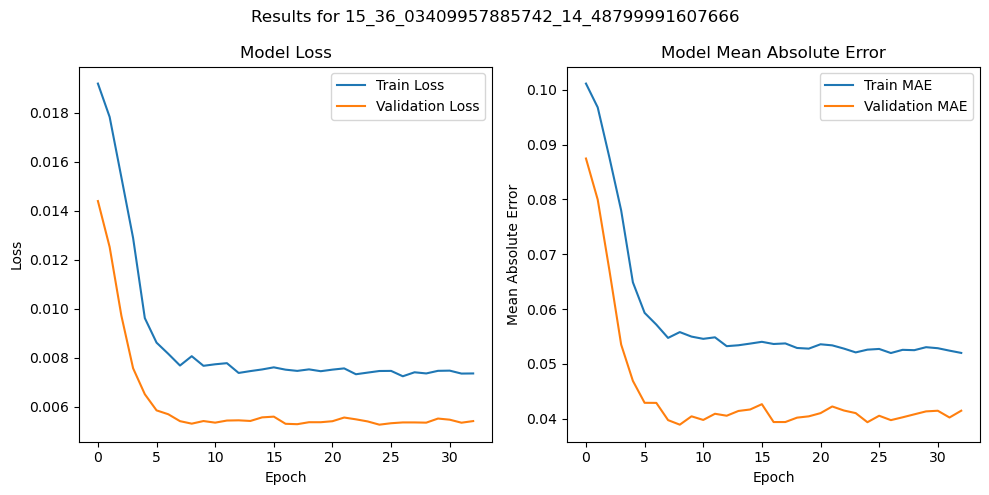

29/29 [==============================] - 21s 693ms/step

Test set Evaluation metrics for file: 15_36_03409957885742_14_48799991607666
Mean Squared Error (MSE): 0.0021087207826058843
Mean Absolute Error (MAE): 0.03425065686182127
Root Mean Squared Error (RMSE): 0.04592080990799143



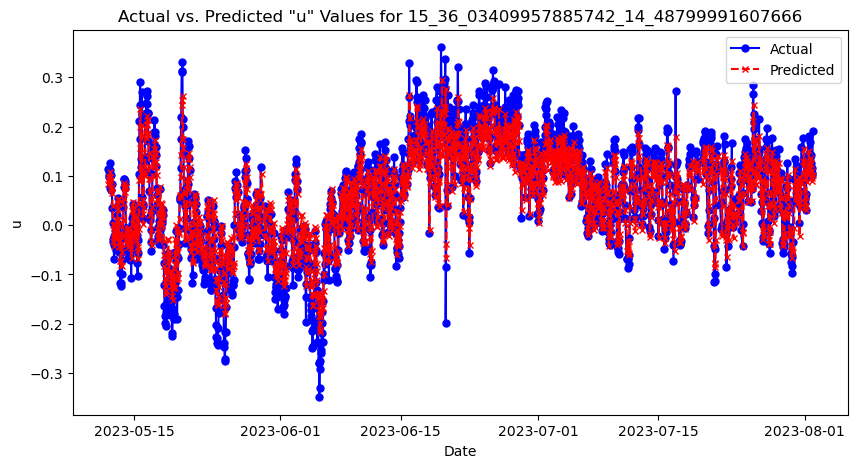

Model tarining & evaluation completed for file: 15_36_03409957885742_14_48799991607666.csv

Processing file: 16_36_03409957885742_14_528599739074707.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
156/156 [==============================] - ETA: 0s - loss: 0.0258 - mean_absolute_error: 0.1155INFO:tensorflow:Assets written to: Data/saved_models/models_u\16_36_03409957885742_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\16_36_03409957885742_14_528599739074707\assets


156/156 [==============================] - 288s 2s/step - loss: 0.0258 - mean_absolute_error: 0.1155 - val_loss: 0.0205 - val_mean_absolute_error: 0.1045
Epoch 2/100
156/156 [==============================] - ETA: 0s - loss: 0.0245 - mean_absolute_error: 0.1123INFO:tensorflow:Assets written to: Data/saved_models/models_u\16_36_03409957885742_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\16_36_03409957885742_14_528599739074707\assets


156/156 [==============================] - 286s 2s/step - loss: 0.0245 - mean_absolute_error: 0.1123 - val_loss: 0.0182 - val_mean_absolute_error: 0.0972
Epoch 3/100
156/156 [==============================] - ETA: 0s - loss: 0.0227 - mean_absolute_error: 0.1071INFO:tensorflow:Assets written to: Data/saved_models/models_u\16_36_03409957885742_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\16_36_03409957885742_14_528599739074707\assets


156/156 [==============================] - 287s 2s/step - loss: 0.0227 - mean_absolute_error: 0.1071 - val_loss: 0.0146 - val_mean_absolute_error: 0.0855
Epoch 4/100
156/156 [==============================] - ETA: 0s - loss: 0.0179 - mean_absolute_error: 0.0920INFO:tensorflow:Assets written to: Data/saved_models/models_u\16_36_03409957885742_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\16_36_03409957885742_14_528599739074707\assets


156/156 [==============================] - 318s 2s/step - loss: 0.0179 - mean_absolute_error: 0.0920 - val_loss: 0.0111 - val_mean_absolute_error: 0.0698
Epoch 5/100
156/156 [==============================] - ETA: 0s - loss: 0.0135 - mean_absolute_error: 0.0769INFO:tensorflow:Assets written to: Data/saved_models/models_u\16_36_03409957885742_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\16_36_03409957885742_14_528599739074707\assets


156/156 [==============================] - 320s 2s/step - loss: 0.0135 - mean_absolute_error: 0.0769 - val_loss: 0.0089 - val_mean_absolute_error: 0.0606
Epoch 6/100
156/156 [==============================] - ETA: 0s - loss: 0.0119 - mean_absolute_error: 0.0701INFO:tensorflow:Assets written to: Data/saved_models/models_u\16_36_03409957885742_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\16_36_03409957885742_14_528599739074707\assets


156/156 [==============================] - 315s 2s/step - loss: 0.0119 - mean_absolute_error: 0.0701 - val_loss: 0.0078 - val_mean_absolute_error: 0.0543
Epoch 7/100
156/156 [==============================] - 311s 2s/step - loss: 0.0107 - mean_absolute_error: 0.0655 - val_loss: 0.0079 - val_mean_absolute_error: 0.0553
Epoch 8/100
156/156 [==============================] - ETA: 0s - loss: 0.0109 - mean_absolute_error: 0.0659INFO:tensorflow:Assets written to: Data/saved_models/models_u\16_36_03409957885742_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\16_36_03409957885742_14_528599739074707\assets


156/156 [==============================] - 322s 2s/step - loss: 0.0109 - mean_absolute_error: 0.0659 - val_loss: 0.0076 - val_mean_absolute_error: 0.0532
Epoch 9/100
156/156 [==============================] - ETA: 0s - loss: 0.0105 - mean_absolute_error: 0.0640INFO:tensorflow:Assets written to: Data/saved_models/models_u\16_36_03409957885742_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\16_36_03409957885742_14_528599739074707\assets


156/156 [==============================] - 313s 2s/step - loss: 0.0105 - mean_absolute_error: 0.0640 - val_loss: 0.0073 - val_mean_absolute_error: 0.0523
Epoch 10/100
156/156 [==============================] - 308s 2s/step - loss: 0.0108 - mean_absolute_error: 0.0651 - val_loss: 0.0076 - val_mean_absolute_error: 0.0539
Epoch 11/100
156/156 [==============================] - 308s 2s/step - loss: 0.0105 - mean_absolute_error: 0.0643 - val_loss: 0.0075 - val_mean_absolute_error: 0.0539
Epoch 12/100
156/156 [==============================] - 310s 2s/step - loss: 0.0105 - mean_absolute_error: 0.0641 - val_loss: 0.0075 - val_mean_absolute_error: 0.0530
Epoch 13/100
156/156 [==============================] - 307s 2s/step - loss: 0.0104 - mean_absolute_error: 0.0634 - val_loss: 0.0074 - val_mean_absolute_error: 0.0526
Epoch 14/100
156/156 [==============================] - ETA: 0s - loss: 0.0105 - mean_absolute_error: 0.0639INFO:tensorflow:Assets written to: Data/saved_models/models_u\16_36_03

INFO:tensorflow:Assets written to: Data/saved_models/models_u\16_36_03409957885742_14_528599739074707\assets


156/156 [==============================] - 321s 2s/step - loss: 0.0105 - mean_absolute_error: 0.0639 - val_loss: 0.0073 - val_mean_absolute_error: 0.0521
Epoch 15/100
156/156 [==============================] - 309s 2s/step - loss: 0.0105 - mean_absolute_error: 0.0636 - val_loss: 0.0076 - val_mean_absolute_error: 0.0542
Epoch 16/100
156/156 [==============================] - ETA: 0s - loss: 0.0107 - mean_absolute_error: 0.0647INFO:tensorflow:Assets written to: Data/saved_models/models_u\16_36_03409957885742_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\16_36_03409957885742_14_528599739074707\assets


156/156 [==============================] - 319s 2s/step - loss: 0.0107 - mean_absolute_error: 0.0647 - val_loss: 0.0072 - val_mean_absolute_error: 0.0507
Epoch 17/100
156/156 [==============================] - 307s 2s/step - loss: 0.0107 - mean_absolute_error: 0.0642 - val_loss: 0.0075 - val_mean_absolute_error: 0.0529
Epoch 18/100
156/156 [==============================] - 306s 2s/step - loss: 0.0102 - mean_absolute_error: 0.0636 - val_loss: 0.0076 - val_mean_absolute_error: 0.0539
Epoch 19/100
156/156 [==============================] - 307s 2s/step - loss: 0.0106 - mean_absolute_error: 0.0644 - val_loss: 0.0075 - val_mean_absolute_error: 0.0527
Epoch 20/100
156/156 [==============================] - 305s 2s/step - loss: 0.0107 - mean_absolute_error: 0.0644 - val_loss: 0.0074 - val_mean_absolute_error: 0.0520
Epoch 21/100
156/156 [==============================] - 308s 2s/step - loss: 0.0103 - mean_absolute_error: 0.0629 - val_loss: 0.0073 - val_mean_absolute_error: 0.0518
Epoch 22/10

INFO:tensorflow:Assets written to: Data/saved_models/models_u\16_36_03409957885742_14_528599739074707\assets


156/156 [==============================] - 317s 2s/step - loss: 0.0105 - mean_absolute_error: 0.0634 - val_loss: 0.0071 - val_mean_absolute_error: 0.0502
Epoch 24/100
156/156 [==============================] - 303s 2s/step - loss: 0.0102 - mean_absolute_error: 0.0622 - val_loss: 0.0072 - val_mean_absolute_error: 0.0510
Epoch 25/100
156/156 [==============================] - 303s 2s/step - loss: 0.0104 - mean_absolute_error: 0.0634 - val_loss: 0.0074 - val_mean_absolute_error: 0.0518
Epoch 26/100
156/156 [==============================] - 304s 2s/step - loss: 0.0103 - mean_absolute_error: 0.0626 - val_loss: 0.0077 - val_mean_absolute_error: 0.0539
Epoch 27/100
156/156 [==============================] - 304s 2s/step - loss: 0.0103 - mean_absolute_error: 0.0625 - val_loss: 0.0073 - val_mean_absolute_error: 0.0508
Epoch 28/100
156/156 [==============================] - 304s 2s/step - loss: 0.0101 - mean_absolute_error: 0.0619 - val_loss: 0.0072 - val_mean_absolute_error: 0.0513
Epoch 29/10

INFO:tensorflow:Assets written to: Data/saved_models/models_u\16_36_03409957885742_14_528599739074707\assets


156/156 [==============================] - 315s 2s/step - loss: 0.0101 - mean_absolute_error: 0.0615 - val_loss: 0.0071 - val_mean_absolute_error: 0.0498
Epoch 32/100
156/156 [==============================] - 296s 2s/step - loss: 0.0100 - mean_absolute_error: 0.0609 - val_loss: 0.0071 - val_mean_absolute_error: 0.0498
Epoch 33/100
156/156 [==============================] - 292s 2s/step - loss: 0.0100 - mean_absolute_error: 0.0610 - val_loss: 0.0072 - val_mean_absolute_error: 0.0500
Epoch 34/100
156/156 [==============================] - 317s 2s/step - loss: 0.0099 - mean_absolute_error: 0.0611 - val_loss: 0.0073 - val_mean_absolute_error: 0.0512
Epoch 35/100
156/156 [==============================] - 309s 2s/step - loss: 0.0099 - mean_absolute_error: 0.0611 - val_loss: 0.0071 - val_mean_absolute_error: 0.0499
Epoch 36/100
156/156 [==============================] - 298s 2s/step - loss: 0.0099 - mean_absolute_error: 0.0606 - val_loss: 0.0074 - val_mean_absolute_error: 0.0519
Epoch 37/10

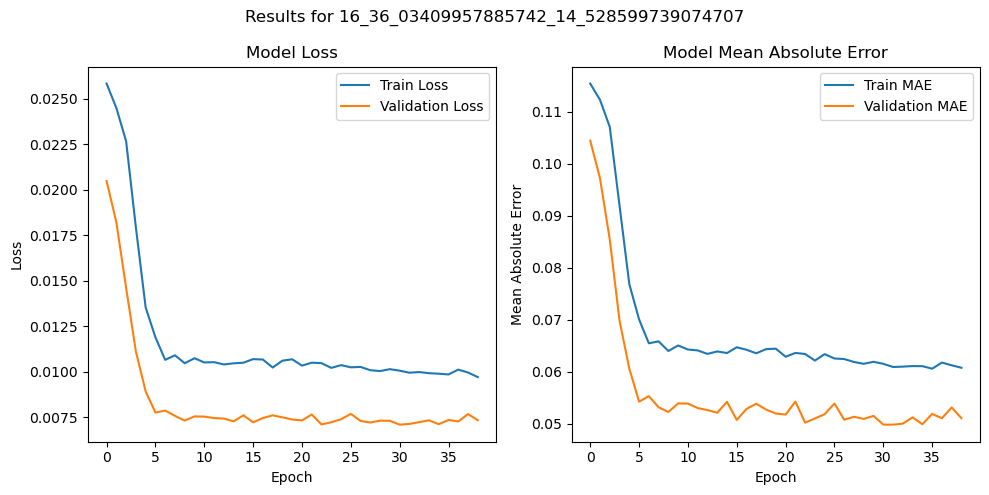

33/33 [==============================] - 26s 746ms/step

Test set Evaluation metrics for file: 16_36_03409957885742_14_528599739074707
Mean Squared Error (MSE): 0.0026313950828602867
Mean Absolute Error (MAE): 0.03846410451002358
Root Mean Squared Error (RMSE): 0.051297125483405856



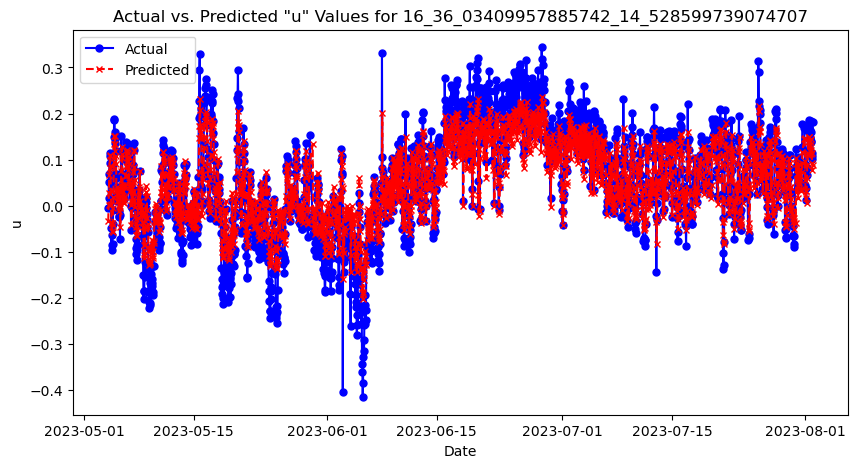

Model tarining & evaluation completed for file: 16_36_03409957885742_14_528599739074707.csv

Processing file: 17_36_03409957885742_14_569199562072754.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
153/153 [==============================] - ETA: 0s - loss: 0.0218 - mean_absolute_error: 0.1060INFO:tensorflow:Assets written to: Data/saved_models/models_u\17_36_03409957885742_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\17_36_03409957885742_14_569199562072754\assets


153/153 [==============================] - 305s 2s/step - loss: 0.0218 - mean_absolute_error: 0.1060 - val_loss: 0.0161 - val_mean_absolute_error: 0.0976
Epoch 2/100
153/153 [==============================] - ETA: 0s - loss: 0.0216 - mean_absolute_error: 0.1065INFO:tensorflow:Assets written to: Data/saved_models/models_u\17_36_03409957885742_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\17_36_03409957885742_14_569199562072754\assets


153/153 [==============================] - 296s 2s/step - loss: 0.0216 - mean_absolute_error: 0.1065 - val_loss: 0.0146 - val_mean_absolute_error: 0.0909
Epoch 3/100
153/153 [==============================] - ETA: 0s - loss: 0.0211 - mean_absolute_error: 0.1044INFO:tensorflow:Assets written to: Data/saved_models/models_u\17_36_03409957885742_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\17_36_03409957885742_14_569199562072754\assets


153/153 [==============================] - 290s 2s/step - loss: 0.0211 - mean_absolute_error: 0.1044 - val_loss: 0.0119 - val_mean_absolute_error: 0.0810
Epoch 4/100
153/153 [==============================] - ETA: 0s - loss: 0.0162 - mean_absolute_error: 0.0895INFO:tensorflow:Assets written to: Data/saved_models/models_u\17_36_03409957885742_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\17_36_03409957885742_14_569199562072754\assets


153/153 [==============================] - 336s 2s/step - loss: 0.0162 - mean_absolute_error: 0.0895 - val_loss: 0.0090 - val_mean_absolute_error: 0.0686
Epoch 5/100
153/153 [==============================] - ETA: 0s - loss: 0.0123 - mean_absolute_error: 0.0752INFO:tensorflow:Assets written to: Data/saved_models/models_u\17_36_03409957885742_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\17_36_03409957885742_14_569199562072754\assets


153/153 [==============================] - 328s 2s/step - loss: 0.0123 - mean_absolute_error: 0.0752 - val_loss: 0.0070 - val_mean_absolute_error: 0.0575
Epoch 6/100
153/153 [==============================] - ETA: 0s - loss: 0.0104 - mean_absolute_error: 0.0677INFO:tensorflow:Assets written to: Data/saved_models/models_u\17_36_03409957885742_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\17_36_03409957885742_14_569199562072754\assets


153/153 [==============================] - 324s 2s/step - loss: 0.0104 - mean_absolute_error: 0.0677 - val_loss: 0.0065 - val_mean_absolute_error: 0.0551
Epoch 7/100
153/153 [==============================] - ETA: 0s - loss: 0.0093 - mean_absolute_error: 0.0629INFO:tensorflow:Assets written to: Data/saved_models/models_u\17_36_03409957885742_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\17_36_03409957885742_14_569199562072754\assets


153/153 [==============================] - 331s 2s/step - loss: 0.0093 - mean_absolute_error: 0.0629 - val_loss: 0.0060 - val_mean_absolute_error: 0.0518
Epoch 8/100
153/153 [==============================] - ETA: 0s - loss: 0.0087 - mean_absolute_error: 0.0600INFO:tensorflow:Assets written to: Data/saved_models/models_u\17_36_03409957885742_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\17_36_03409957885742_14_569199562072754\assets


153/153 [==============================] - 331s 2s/step - loss: 0.0087 - mean_absolute_error: 0.0600 - val_loss: 0.0053 - val_mean_absolute_error: 0.0456
Epoch 9/100
153/153 [==============================] - 321s 2s/step - loss: 0.0088 - mean_absolute_error: 0.0599 - val_loss: 0.0054 - val_mean_absolute_error: 0.0472
Epoch 10/100
153/153 [==============================] - 321s 2s/step - loss: 0.0087 - mean_absolute_error: 0.0599 - val_loss: 0.0054 - val_mean_absolute_error: 0.0463
Epoch 11/100
153/153 [==============================] - 320s 2s/step - loss: 0.0085 - mean_absolute_error: 0.0590 - val_loss: 0.0055 - val_mean_absolute_error: 0.0476
Epoch 12/100
153/153 [==============================] - 318s 2s/step - loss: 0.0086 - mean_absolute_error: 0.0596 - val_loss: 0.0054 - val_mean_absolute_error: 0.0464
Epoch 13/100
153/153 [==============================] - 315s 2s/step - loss: 0.0087 - mean_absolute_error: 0.0596 - val_loss: 0.0056 - val_mean_absolute_error: 0.0487
Epoch 14/100

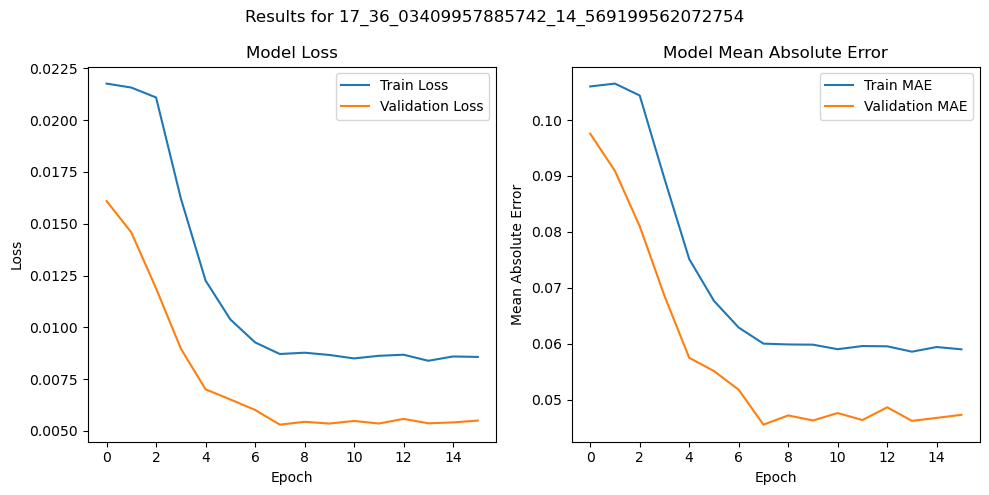

32/32 [==============================] - 28s 828ms/step

Test set Evaluation metrics for file: 17_36_03409957885742_14_569199562072754
Mean Squared Error (MSE): 0.0025002748501060158
Mean Absolute Error (MAE): 0.03871224625666052
Root Mean Squared Error (RMSE): 0.05000274842552173



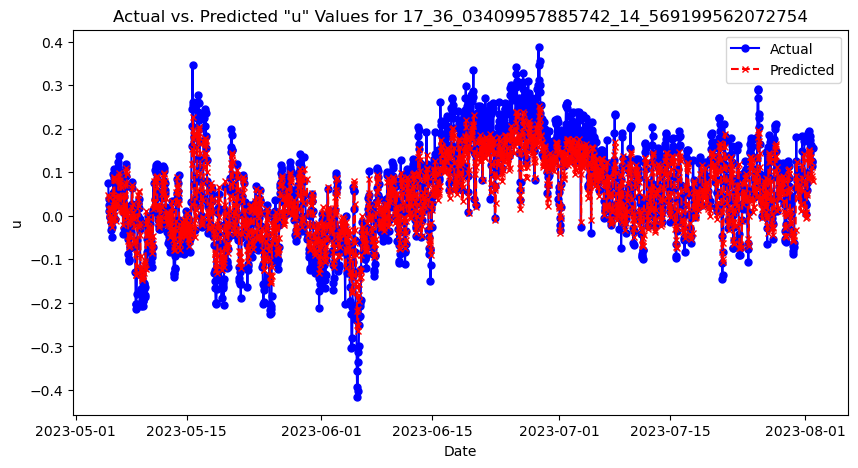

Model tarining & evaluation completed for file: 17_36_03409957885742_14_569199562072754.csv

Processing file: 18_36_056400299072266_14_447500228881836.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
128/128 [==============================] - ETA: 0s - loss: 0.0168 - mean_absolute_error: 0.0986INFO:tensorflow:Assets written to: Data/saved_models/models_u\18_36_056400299072266_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\18_36_056400299072266_14_447500228881836\assets


128/128 [==============================] - 281s 2s/step - loss: 0.0168 - mean_absolute_error: 0.0986 - val_loss: 0.0136 - val_mean_absolute_error: 0.0908
Epoch 2/100
128/128 [==============================] - ETA: 0s - loss: 0.0160 - mean_absolute_error: 0.0958INFO:tensorflow:Assets written to: Data/saved_models/models_u\18_36_056400299072266_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\18_36_056400299072266_14_447500228881836\assets


128/128 [==============================] - 263s 2s/step - loss: 0.0160 - mean_absolute_error: 0.0958 - val_loss: 0.0121 - val_mean_absolute_error: 0.0852
Epoch 3/100
128/128 [==============================] - ETA: 0s - loss: 0.0146 - mean_absolute_error: 0.0906INFO:tensorflow:Assets written to: Data/saved_models/models_u\18_36_056400299072266_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\18_36_056400299072266_14_447500228881836\assets


128/128 [==============================] - 262s 2s/step - loss: 0.0146 - mean_absolute_error: 0.0906 - val_loss: 0.0108 - val_mean_absolute_error: 0.0806
Epoch 4/100
128/128 [==============================] - ETA: 0s - loss: 0.0128 - mean_absolute_error: 0.0829INFO:tensorflow:Assets written to: Data/saved_models/models_u\18_36_056400299072266_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\18_36_056400299072266_14_447500228881836\assets


128/128 [==============================] - 263s 2s/step - loss: 0.0128 - mean_absolute_error: 0.0829 - val_loss: 0.0088 - val_mean_absolute_error: 0.0704
Epoch 5/100
128/128 [==============================] - ETA: 0s - loss: 0.0104 - mean_absolute_error: 0.0730INFO:tensorflow:Assets written to: Data/saved_models/models_u\18_36_056400299072266_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\18_36_056400299072266_14_447500228881836\assets


128/128 [==============================] - 262s 2s/step - loss: 0.0104 - mean_absolute_error: 0.0730 - val_loss: 0.0068 - val_mean_absolute_error: 0.0578
Epoch 6/100
128/128 [==============================] - ETA: 0s - loss: 0.0084 - mean_absolute_error: 0.0644INFO:tensorflow:Assets written to: Data/saved_models/models_u\18_36_056400299072266_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\18_36_056400299072266_14_447500228881836\assets


128/128 [==============================] - 277s 2s/step - loss: 0.0084 - mean_absolute_error: 0.0644 - val_loss: 0.0059 - val_mean_absolute_error: 0.0518
Epoch 7/100
128/128 [==============================] - ETA: 0s - loss: 0.0071 - mean_absolute_error: 0.0569INFO:tensorflow:Assets written to: Data/saved_models/models_u\18_36_056400299072266_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\18_36_056400299072266_14_447500228881836\assets


128/128 [==============================] - 273s 2s/step - loss: 0.0071 - mean_absolute_error: 0.0569 - val_loss: 0.0049 - val_mean_absolute_error: 0.0450
Epoch 8/100
128/128 [==============================] - ETA: 0s - loss: 0.0066 - mean_absolute_error: 0.0537INFO:tensorflow:Assets written to: Data/saved_models/models_u\18_36_056400299072266_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\18_36_056400299072266_14_447500228881836\assets


128/128 [==============================] - 279s 2s/step - loss: 0.0066 - mean_absolute_error: 0.0537 - val_loss: 0.0048 - val_mean_absolute_error: 0.0461
Epoch 9/100
128/128 [==============================] - ETA: 0s - loss: 0.0062 - mean_absolute_error: 0.0511INFO:tensorflow:Assets written to: Data/saved_models/models_u\18_36_056400299072266_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\18_36_056400299072266_14_447500228881836\assets


128/128 [==============================] - 273s 2s/step - loss: 0.0062 - mean_absolute_error: 0.0511 - val_loss: 0.0044 - val_mean_absolute_error: 0.0430
Epoch 10/100
128/128 [==============================] - ETA: 0s - loss: 0.0060 - mean_absolute_error: 0.0504INFO:tensorflow:Assets written to: Data/saved_models/models_u\18_36_056400299072266_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\18_36_056400299072266_14_447500228881836\assets


128/128 [==============================] - 276s 2s/step - loss: 0.0060 - mean_absolute_error: 0.0504 - val_loss: 0.0044 - val_mean_absolute_error: 0.0428
Epoch 11/100
128/128 [==============================] - ETA: 0s - loss: 0.0059 - mean_absolute_error: 0.0500INFO:tensorflow:Assets written to: Data/saved_models/models_u\18_36_056400299072266_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\18_36_056400299072266_14_447500228881836\assets


128/128 [==============================] - 273s 2s/step - loss: 0.0059 - mean_absolute_error: 0.0500 - val_loss: 0.0044 - val_mean_absolute_error: 0.0427
Epoch 12/100
128/128 [==============================] - 270s 2s/step - loss: 0.0059 - mean_absolute_error: 0.0492 - val_loss: 0.0045 - val_mean_absolute_error: 0.0436
Epoch 13/100
128/128 [==============================] - ETA: 0s - loss: 0.0059 - mean_absolute_error: 0.0487INFO:tensorflow:Assets written to: Data/saved_models/models_u\18_36_056400299072266_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\18_36_056400299072266_14_447500228881836\assets


128/128 [==============================] - 279s 2s/step - loss: 0.0059 - mean_absolute_error: 0.0487 - val_loss: 0.0044 - val_mean_absolute_error: 0.0427
Epoch 14/100
128/128 [==============================] - 265s 2s/step - loss: 0.0058 - mean_absolute_error: 0.0492 - val_loss: 0.0046 - val_mean_absolute_error: 0.0443
Epoch 15/100
128/128 [==============================] - 266s 2s/step - loss: 0.0058 - mean_absolute_error: 0.0485 - val_loss: 0.0044 - val_mean_absolute_error: 0.0431
Epoch 16/100
128/128 [==============================] - 266s 2s/step - loss: 0.0059 - mean_absolute_error: 0.0487 - val_loss: 0.0046 - val_mean_absolute_error: 0.0448
Epoch 17/100
128/128 [==============================] - ETA: 0s - loss: 0.0057 - mean_absolute_error: 0.0480INFO:tensorflow:Assets written to: Data/saved_models/models_u\18_36_056400299072266_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\18_36_056400299072266_14_447500228881836\assets


128/128 [==============================] - 278s 2s/step - loss: 0.0057 - mean_absolute_error: 0.0480 - val_loss: 0.0044 - val_mean_absolute_error: 0.0423
Epoch 18/100
128/128 [==============================] - 275s 2s/step - loss: 0.0057 - mean_absolute_error: 0.0480 - val_loss: 0.0046 - val_mean_absolute_error: 0.0449
Epoch 19/100
128/128 [==============================] - 269s 2s/step - loss: 0.0058 - mean_absolute_error: 0.0484 - val_loss: 0.0045 - val_mean_absolute_error: 0.0436
Epoch 20/100
128/128 [==============================] - 269s 2s/step - loss: 0.0057 - mean_absolute_error: 0.0482 - val_loss: 0.0045 - val_mean_absolute_error: 0.0440
Epoch 21/100
128/128 [==============================] - 269s 2s/step - loss: 0.0058 - mean_absolute_error: 0.0484 - val_loss: 0.0045 - val_mean_absolute_error: 0.0436
Epoch 22/100
128/128 [==============================] - 269s 2s/step - loss: 0.0057 - mean_absolute_error: 0.0482 - val_loss: 0.0047 - val_mean_absolute_error: 0.0453
Epoch 23/10

INFO:tensorflow:Assets written to: Data/saved_models/models_u\18_36_056400299072266_14_447500228881836\assets


128/128 [==============================] - 280s 2s/step - loss: 0.0057 - mean_absolute_error: 0.0478 - val_loss: 0.0043 - val_mean_absolute_error: 0.0422
Epoch 24/100
128/128 [==============================] - 263s 2s/step - loss: 0.0057 - mean_absolute_error: 0.0473 - val_loss: 0.0044 - val_mean_absolute_error: 0.0428
Epoch 25/100
128/128 [==============================] - 261s 2s/step - loss: 0.0057 - mean_absolute_error: 0.0478 - val_loss: 0.0044 - val_mean_absolute_error: 0.0430
Epoch 26/100
128/128 [==============================] - 261s 2s/step - loss: 0.0056 - mean_absolute_error: 0.0473 - val_loss: 0.0045 - val_mean_absolute_error: 0.0435
Epoch 27/100
128/128 [==============================] - 260s 2s/step - loss: 0.0056 - mean_absolute_error: 0.0473 - val_loss: 0.0044 - val_mean_absolute_error: 0.0432
Epoch 28/100
128/128 [==============================] - 261s 2s/step - loss: 0.0056 - mean_absolute_error: 0.0472 - val_loss: 0.0045 - val_mean_absolute_error: 0.0440
Epoch 29/10

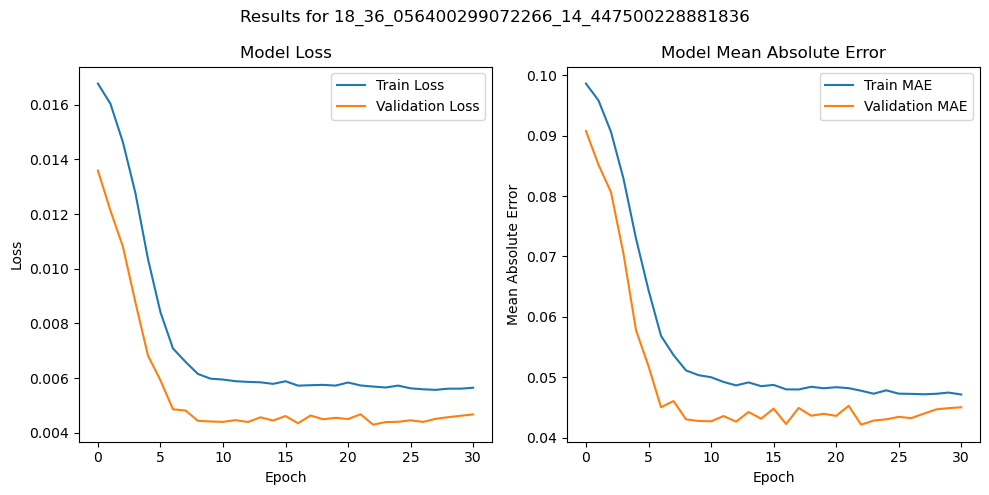

27/27 [==============================] - 24s 837ms/step

Test set Evaluation metrics for file: 18_36_056400299072266_14_447500228881836
Mean Squared Error (MSE): 0.0036119631348825363
Mean Absolute Error (MAE): 0.047967508736841656
Root Mean Squared Error (RMSE): 0.06009961010591114



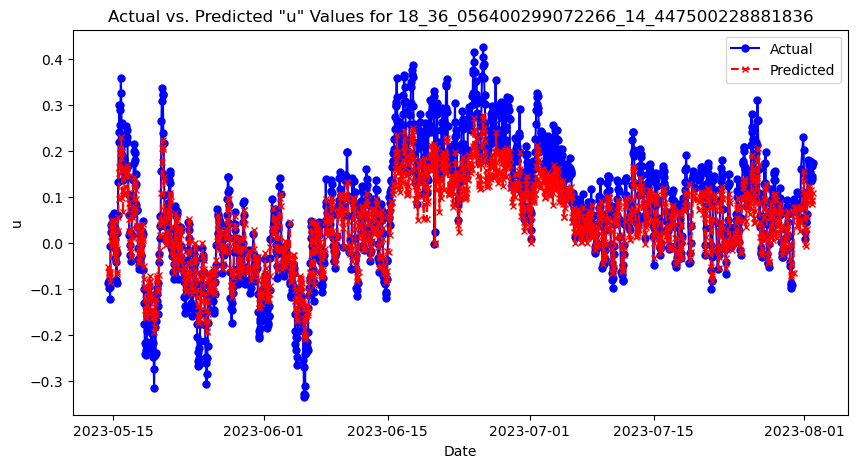

Model tarining & evaluation completed for file: 18_36_056400299072266_14_447500228881836.csv

Processing file: 19_36_056400299072266_14_48799991607666.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
138/138 [==============================] - ETA: 0s - loss: 0.0193 - mean_absolute_error: 0.1034INFO:tensorflow:Assets written to: Data/saved_models/models_u\19_36_056400299072266_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\19_36_056400299072266_14_48799991607666\assets


138/138 [==============================] - 287s 2s/step - loss: 0.0193 - mean_absolute_error: 0.1034 - val_loss: 0.0151 - val_mean_absolute_error: 0.0917
Epoch 2/100
138/138 [==============================] - ETA: 0s - loss: 0.0191 - mean_absolute_error: 0.1012INFO:tensorflow:Assets written to: Data/saved_models/models_u\19_36_056400299072266_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\19_36_056400299072266_14_48799991607666\assets


138/138 [==============================] - 266s 2s/step - loss: 0.0191 - mean_absolute_error: 0.1012 - val_loss: 0.0122 - val_mean_absolute_error: 0.0805
Epoch 3/100
138/138 [==============================] - ETA: 0s - loss: 0.0157 - mean_absolute_error: 0.0893INFO:tensorflow:Assets written to: Data/saved_models/models_u\19_36_056400299072266_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\19_36_056400299072266_14_48799991607666\assets


138/138 [==============================] - 266s 2s/step - loss: 0.0157 - mean_absolute_error: 0.0893 - val_loss: 0.0103 - val_mean_absolute_error: 0.0707
Epoch 4/100
138/138 [==============================] - ETA: 0s - loss: 0.0126 - mean_absolute_error: 0.0775INFO:tensorflow:Assets written to: Data/saved_models/models_u\19_36_056400299072266_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\19_36_056400299072266_14_48799991607666\assets


138/138 [==============================] - 263s 2s/step - loss: 0.0126 - mean_absolute_error: 0.0775 - val_loss: 0.0077 - val_mean_absolute_error: 0.0571
Epoch 5/100
138/138 [==============================] - ETA: 0s - loss: 0.0104 - mean_absolute_error: 0.0682INFO:tensorflow:Assets written to: Data/saved_models/models_u\19_36_056400299072266_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\19_36_056400299072266_14_48799991607666\assets


138/138 [==============================] - 264s 2s/step - loss: 0.0104 - mean_absolute_error: 0.0682 - val_loss: 0.0063 - val_mean_absolute_error: 0.0492
Epoch 6/100
138/138 [==============================] - ETA: 0s - loss: 0.0090 - mean_absolute_error: 0.0626INFO:tensorflow:Assets written to: Data/saved_models/models_u\19_36_056400299072266_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\19_36_056400299072266_14_48799991607666\assets


138/138 [==============================] - 265s 2s/step - loss: 0.0090 - mean_absolute_error: 0.0626 - val_loss: 0.0056 - val_mean_absolute_error: 0.0450
Epoch 7/100
138/138 [==============================] - ETA: 0s - loss: 0.0086 - mean_absolute_error: 0.0600INFO:tensorflow:Assets written to: Data/saved_models/models_u\19_36_056400299072266_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\19_36_056400299072266_14_48799991607666\assets


138/138 [==============================] - 263s 2s/step - loss: 0.0086 - mean_absolute_error: 0.0600 - val_loss: 0.0052 - val_mean_absolute_error: 0.0433
Epoch 8/100
138/138 [==============================] - 254s 2s/step - loss: 0.0083 - mean_absolute_error: 0.0581 - val_loss: 0.0056 - val_mean_absolute_error: 0.0473
Epoch 9/100
138/138 [==============================] - 253s 2s/step - loss: 0.0081 - mean_absolute_error: 0.0574 - val_loss: 0.0052 - val_mean_absolute_error: 0.0448
Epoch 10/100
138/138 [==============================] - ETA: 0s - loss: 0.0079 - mean_absolute_error: 0.0564INFO:tensorflow:Assets written to: Data/saved_models/models_u\19_36_056400299072266_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\19_36_056400299072266_14_48799991607666\assets


138/138 [==============================] - 265s 2s/step - loss: 0.0079 - mean_absolute_error: 0.0564 - val_loss: 0.0050 - val_mean_absolute_error: 0.0428
Epoch 11/100
138/138 [==============================] - 256s 2s/step - loss: 0.0080 - mean_absolute_error: 0.0569 - val_loss: 0.0052 - val_mean_absolute_error: 0.0445
Epoch 12/100
138/138 [==============================] - ETA: 0s - loss: 0.0077 - mean_absolute_error: 0.0552INFO:tensorflow:Assets written to: Data/saved_models/models_u\19_36_056400299072266_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\19_36_056400299072266_14_48799991607666\assets


138/138 [==============================] - 264s 2s/step - loss: 0.0077 - mean_absolute_error: 0.0552 - val_loss: 0.0049 - val_mean_absolute_error: 0.0422
Epoch 13/100
138/138 [==============================] - 254s 2s/step - loss: 0.0078 - mean_absolute_error: 0.0557 - val_loss: 0.0051 - val_mean_absolute_error: 0.0441
Epoch 14/100
138/138 [==============================] - 254s 2s/step - loss: 0.0079 - mean_absolute_error: 0.0559 - val_loss: 0.0051 - val_mean_absolute_error: 0.0444
Epoch 15/100
138/138 [==============================] - 255s 2s/step - loss: 0.0077 - mean_absolute_error: 0.0552 - val_loss: 0.0050 - val_mean_absolute_error: 0.0423
Epoch 16/100
138/138 [==============================] - 254s 2s/step - loss: 0.0077 - mean_absolute_error: 0.0553 - val_loss: 0.0052 - val_mean_absolute_error: 0.0449
Epoch 17/100
138/138 [==============================] - 254s 2s/step - loss: 0.0074 - mean_absolute_error: 0.0539 - val_loss: 0.0052 - val_mean_absolute_error: 0.0443
Epoch 18/10

INFO:tensorflow:Assets written to: Data/saved_models/models_u\19_36_056400299072266_14_48799991607666\assets


138/138 [==============================] - 264s 2s/step - loss: 0.0075 - mean_absolute_error: 0.0538 - val_loss: 0.0048 - val_mean_absolute_error: 0.0414
Epoch 20/100
138/138 [==============================] - ETA: 0s - loss: 0.0076 - mean_absolute_error: 0.0538INFO:tensorflow:Assets written to: Data/saved_models/models_u\19_36_056400299072266_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\19_36_056400299072266_14_48799991607666\assets


138/138 [==============================] - 266s 2s/step - loss: 0.0076 - mean_absolute_error: 0.0538 - val_loss: 0.0047 - val_mean_absolute_error: 0.0400
Epoch 21/100
138/138 [==============================] - 255s 2s/step - loss: 0.0076 - mean_absolute_error: 0.0540 - val_loss: 0.0047 - val_mean_absolute_error: 0.0408
Epoch 22/100
138/138 [==============================] - 257s 2s/step - loss: 0.0078 - mean_absolute_error: 0.0551 - val_loss: 0.0048 - val_mean_absolute_error: 0.0416
Epoch 23/100
138/138 [==============================] - 255s 2s/step - loss: 0.0077 - mean_absolute_error: 0.0556 - val_loss: 0.0051 - val_mean_absolute_error: 0.0437
Epoch 24/100
138/138 [==============================] - ETA: 0s - loss: 0.0076 - mean_absolute_error: 0.0548INFO:tensorflow:Assets written to: Data/saved_models/models_u\19_36_056400299072266_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\19_36_056400299072266_14_48799991607666\assets


138/138 [==============================] - 265s 2s/step - loss: 0.0076 - mean_absolute_error: 0.0548 - val_loss: 0.0046 - val_mean_absolute_error: 0.0385
Epoch 25/100
138/138 [==============================] - 257s 2s/step - loss: 0.0075 - mean_absolute_error: 0.0537 - val_loss: 0.0046 - val_mean_absolute_error: 0.0384
Epoch 26/100
138/138 [==============================] - 253s 2s/step - loss: 0.0075 - mean_absolute_error: 0.0538 - val_loss: 0.0046 - val_mean_absolute_error: 0.0390
Epoch 27/100
138/138 [==============================] - 252s 2s/step - loss: 0.0074 - mean_absolute_error: 0.0534 - val_loss: 0.0047 - val_mean_absolute_error: 0.0404
Epoch 28/100
138/138 [==============================] - 254s 2s/step - loss: 0.0075 - mean_absolute_error: 0.0540 - val_loss: 0.0046 - val_mean_absolute_error: 0.0390
Epoch 29/100
138/138 [==============================] - 253s 2s/step - loss: 0.0074 - mean_absolute_error: 0.0530 - val_loss: 0.0046 - val_mean_absolute_error: 0.0382
Epoch 30/10

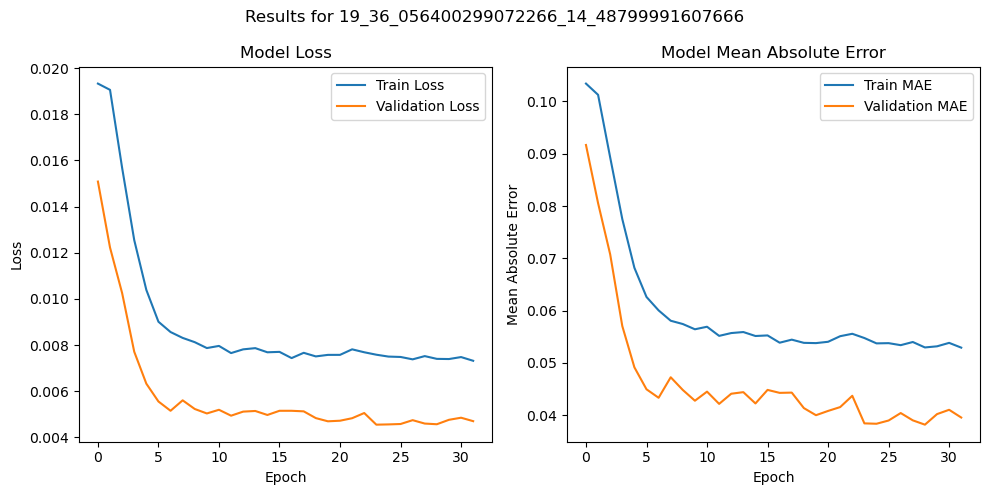

29/29 [==============================] - 23s 741ms/step

Test set Evaluation metrics for file: 19_36_056400299072266_14_48799991607666
Mean Squared Error (MSE): 0.002118582271773148
Mean Absolute Error (MAE): 0.035334097410488194
Root Mean Squared Error (RMSE): 0.0460280596133831



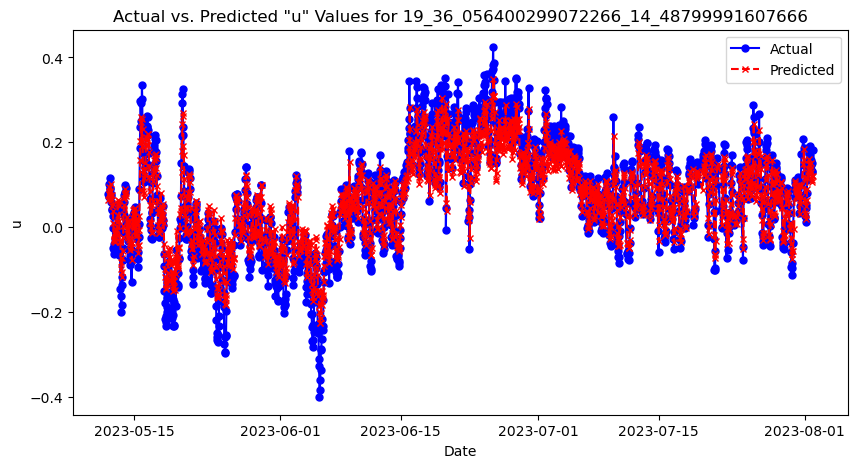

Model tarining & evaluation completed for file: 19_36_056400299072266_14_48799991607666.csv

Processing file: 20_36_056400299072266_14_528599739074707.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
156/156 [==============================] - ETA: 0s - loss: 0.0233 - mean_absolute_error: 0.1122INFO:tensorflow:Assets written to: Data/saved_models/models_u\20_36_056400299072266_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\20_36_056400299072266_14_528599739074707\assets


156/156 [==============================] - 297s 2s/step - loss: 0.0233 - mean_absolute_error: 0.1122 - val_loss: 0.0187 - val_mean_absolute_error: 0.0999
Epoch 2/100
156/156 [==============================] - ETA: 0s - loss: 0.0227 - mean_absolute_error: 0.1108INFO:tensorflow:Assets written to: Data/saved_models/models_u\20_36_056400299072266_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\20_36_056400299072266_14_528599739074707\assets


156/156 [==============================] - 293s 2s/step - loss: 0.0227 - mean_absolute_error: 0.1108 - val_loss: 0.0167 - val_mean_absolute_error: 0.0934
Epoch 3/100
156/156 [==============================] - ETA: 0s - loss: 0.0203 - mean_absolute_error: 0.1036INFO:tensorflow:Assets written to: Data/saved_models/models_u\20_36_056400299072266_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\20_36_056400299072266_14_528599739074707\assets


156/156 [==============================] - 293s 2s/step - loss: 0.0203 - mean_absolute_error: 0.1036 - val_loss: 0.0143 - val_mean_absolute_error: 0.0845
Epoch 4/100
156/156 [==============================] - ETA: 0s - loss: 0.0166 - mean_absolute_error: 0.0916INFO:tensorflow:Assets written to: Data/saved_models/models_u\20_36_056400299072266_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\20_36_056400299072266_14_528599739074707\assets


156/156 [==============================] - 307s 2s/step - loss: 0.0166 - mean_absolute_error: 0.0916 - val_loss: 0.0118 - val_mean_absolute_error: 0.0751
Epoch 5/100
156/156 [==============================] - ETA: 0s - loss: 0.0132 - mean_absolute_error: 0.0784INFO:tensorflow:Assets written to: Data/saved_models/models_u\20_36_056400299072266_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\20_36_056400299072266_14_528599739074707\assets


156/156 [==============================] - 298s 2s/step - loss: 0.0132 - mean_absolute_error: 0.0784 - val_loss: 0.0095 - val_mean_absolute_error: 0.0644
Epoch 6/100
156/156 [==============================] - ETA: 0s - loss: 0.0108 - mean_absolute_error: 0.0688INFO:tensorflow:Assets written to: Data/saved_models/models_u\20_36_056400299072266_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\20_36_056400299072266_14_528599739074707\assets


156/156 [==============================] - 313s 2s/step - loss: 0.0108 - mean_absolute_error: 0.0688 - val_loss: 0.0077 - val_mean_absolute_error: 0.0562
Epoch 7/100
156/156 [==============================] - ETA: 0s - loss: 0.0097 - mean_absolute_error: 0.0637INFO:tensorflow:Assets written to: Data/saved_models/models_u\20_36_056400299072266_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\20_36_056400299072266_14_528599739074707\assets


156/156 [==============================] - 304s 2s/step - loss: 0.0097 - mean_absolute_error: 0.0637 - val_loss: 0.0075 - val_mean_absolute_error: 0.0557
Epoch 8/100
156/156 [==============================] - 289s 2s/step - loss: 0.0095 - mean_absolute_error: 0.0628 - val_loss: 0.0078 - val_mean_absolute_error: 0.0581
Epoch 9/100
156/156 [==============================] - ETA: 0s - loss: 0.0095 - mean_absolute_error: 0.0628INFO:tensorflow:Assets written to: Data/saved_models/models_u\20_36_056400299072266_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\20_36_056400299072266_14_528599739074707\assets


156/156 [==============================] - 297s 2s/step - loss: 0.0095 - mean_absolute_error: 0.0628 - val_loss: 0.0073 - val_mean_absolute_error: 0.0539
Epoch 10/100
156/156 [==============================] - ETA: 0s - loss: 0.0095 - mean_absolute_error: 0.0627INFO:tensorflow:Assets written to: Data/saved_models/models_u\20_36_056400299072266_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\20_36_056400299072266_14_528599739074707\assets


156/156 [==============================] - 301s 2s/step - loss: 0.0095 - mean_absolute_error: 0.0627 - val_loss: 0.0071 - val_mean_absolute_error: 0.0528
Epoch 11/100
156/156 [==============================] - 287s 2s/step - loss: 0.0092 - mean_absolute_error: 0.0613 - val_loss: 0.0073 - val_mean_absolute_error: 0.0543
Epoch 12/100
156/156 [==============================] - 287s 2s/step - loss: 0.0092 - mean_absolute_error: 0.0613 - val_loss: 0.0077 - val_mean_absolute_error: 0.0564
Epoch 13/100
156/156 [==============================] - 286s 2s/step - loss: 0.0094 - mean_absolute_error: 0.0618 - val_loss: 0.0074 - val_mean_absolute_error: 0.0555
Epoch 14/100
156/156 [==============================] - 287s 2s/step - loss: 0.0093 - mean_absolute_error: 0.0612 - val_loss: 0.0080 - val_mean_absolute_error: 0.0589
Epoch 15/100
156/156 [==============================] - 287s 2s/step - loss: 0.0094 - mean_absolute_error: 0.0623 - val_loss: 0.0078 - val_mean_absolute_error: 0.0579
Epoch 16/10

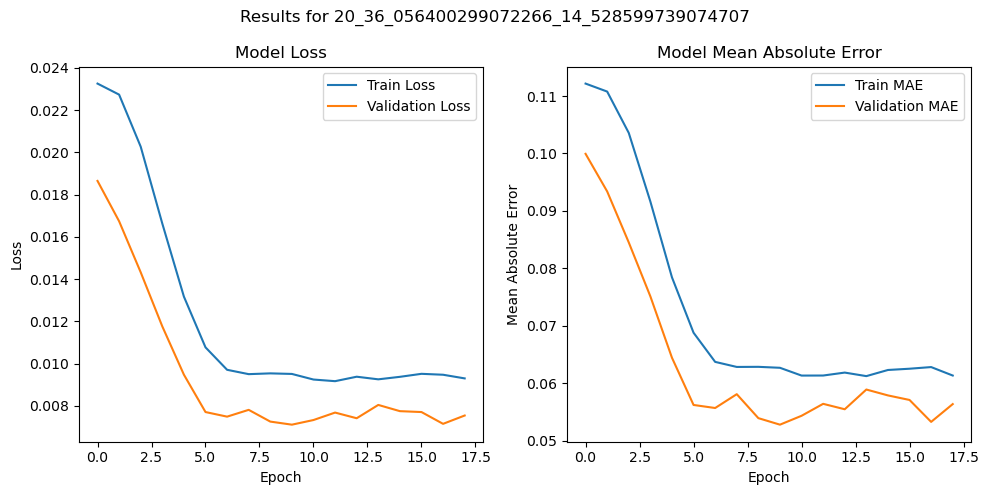

33/33 [==============================] - 28s 808ms/step

Test set Evaluation metrics for file: 20_36_056400299072266_14_528599739074707
Mean Squared Error (MSE): 0.0031067239352826955
Mean Absolute Error (MAE): 0.043524169796729545
Root Mean Squared Error (RMSE): 0.055737993642422184



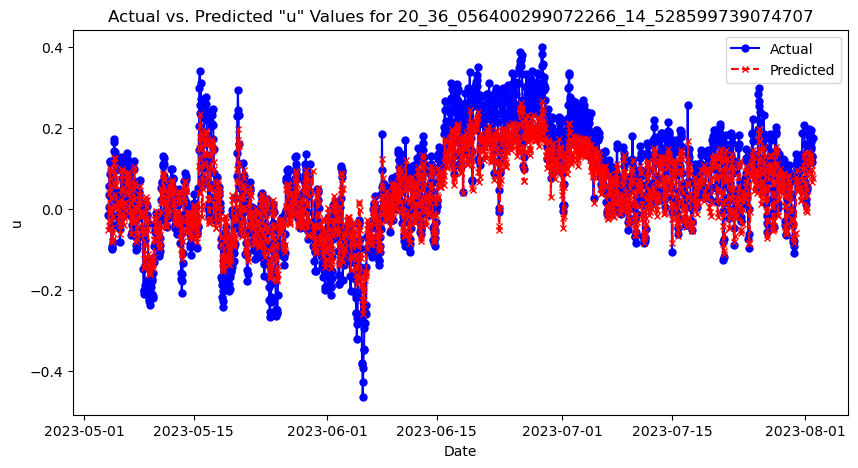

Model tarining & evaluation completed for file: 20_36_056400299072266_14_528599739074707.csv

Processing file: 21_36_056400299072266_14_569199562072754.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
154/154 [==============================] - ETA: 0s - loss: 0.0215 - mean_absolute_error: 0.1061INFO:tensorflow:Assets written to: Data/saved_models/models_u\21_36_056400299072266_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\21_36_056400299072266_14_569199562072754\assets


154/154 [==============================] - 310s 2s/step - loss: 0.0215 - mean_absolute_error: 0.1061 - val_loss: 0.0153 - val_mean_absolute_error: 0.0965
Epoch 2/100
154/154 [==============================] - ETA: 0s - loss: 0.0220 - mean_absolute_error: 0.1095INFO:tensorflow:Assets written to: Data/saved_models/models_u\21_36_056400299072266_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\21_36_056400299072266_14_569199562072754\assets


154/154 [==============================] - 294s 2s/step - loss: 0.0220 - mean_absolute_error: 0.1095 - val_loss: 0.0150 - val_mean_absolute_error: 0.0953
Epoch 3/100
154/154 [==============================] - ETA: 0s - loss: 0.0209 - mean_absolute_error: 0.1048INFO:tensorflow:Assets written to: Data/saved_models/models_u\21_36_056400299072266_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\21_36_056400299072266_14_569199562072754\assets


154/154 [==============================] - 303s 2s/step - loss: 0.0209 - mean_absolute_error: 0.1048 - val_loss: 0.0132 - val_mean_absolute_error: 0.0880
Epoch 4/100
154/154 [==============================] - ETA: 0s - loss: 0.0175 - mean_absolute_error: 0.0939INFO:tensorflow:Assets written to: Data/saved_models/models_u\21_36_056400299072266_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\21_36_056400299072266_14_569199562072754\assets


154/154 [==============================] - 295s 2s/step - loss: 0.0175 - mean_absolute_error: 0.0939 - val_loss: 0.0104 - val_mean_absolute_error: 0.0764
Epoch 5/100
154/154 [==============================] - ETA: 0s - loss: 0.0133 - mean_absolute_error: 0.0799INFO:tensorflow:Assets written to: Data/saved_models/models_u\21_36_056400299072266_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\21_36_056400299072266_14_569199562072754\assets


154/154 [==============================] - 296s 2s/step - loss: 0.0133 - mean_absolute_error: 0.0799 - val_loss: 0.0074 - val_mean_absolute_error: 0.0626
Epoch 6/100
154/154 [==============================] - ETA: 0s - loss: 0.0108 - mean_absolute_error: 0.0699INFO:tensorflow:Assets written to: Data/saved_models/models_u\21_36_056400299072266_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\21_36_056400299072266_14_569199562072754\assets


154/154 [==============================] - 300s 2s/step - loss: 0.0108 - mean_absolute_error: 0.0699 - val_loss: 0.0068 - val_mean_absolute_error: 0.0603
Epoch 7/100
154/154 [==============================] - ETA: 0s - loss: 0.0098 - mean_absolute_error: 0.0650INFO:tensorflow:Assets written to: Data/saved_models/models_u\21_36_056400299072266_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\21_36_056400299072266_14_569199562072754\assets


154/154 [==============================] - 301s 2s/step - loss: 0.0098 - mean_absolute_error: 0.0650 - val_loss: 0.0063 - val_mean_absolute_error: 0.0566
Epoch 8/100
154/154 [==============================] - ETA: 0s - loss: 0.0093 - mean_absolute_error: 0.0630INFO:tensorflow:Assets written to: Data/saved_models/models_u\21_36_056400299072266_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\21_36_056400299072266_14_569199562072754\assets


154/154 [==============================] - 306s 2s/step - loss: 0.0093 - mean_absolute_error: 0.0630 - val_loss: 0.0059 - val_mean_absolute_error: 0.0530
Epoch 9/100
154/154 [==============================] - ETA: 0s - loss: 0.0093 - mean_absolute_error: 0.0623INFO:tensorflow:Assets written to: Data/saved_models/models_u\21_36_056400299072266_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\21_36_056400299072266_14_569199562072754\assets


154/154 [==============================] - 302s 2s/step - loss: 0.0093 - mean_absolute_error: 0.0623 - val_loss: 0.0058 - val_mean_absolute_error: 0.0520
Epoch 10/100
154/154 [==============================] - ETA: 0s - loss: 0.0091 - mean_absolute_error: 0.0614INFO:tensorflow:Assets written to: Data/saved_models/models_u\21_36_056400299072266_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\21_36_056400299072266_14_569199562072754\assets


154/154 [==============================] - 302s 2s/step - loss: 0.0091 - mean_absolute_error: 0.0614 - val_loss: 0.0056 - val_mean_absolute_error: 0.0508
Epoch 11/100
154/154 [==============================] - 289s 2s/step - loss: 0.0092 - mean_absolute_error: 0.0616 - val_loss: 0.0058 - val_mean_absolute_error: 0.0533
Epoch 12/100
154/154 [==============================] - 288s 2s/step - loss: 0.0092 - mean_absolute_error: 0.0619 - val_loss: 0.0058 - val_mean_absolute_error: 0.0529
Epoch 13/100
154/154 [==============================] - 290s 2s/step - loss: 0.0091 - mean_absolute_error: 0.0617 - val_loss: 0.0058 - val_mean_absolute_error: 0.0532
Epoch 14/100
154/154 [==============================] - 289s 2s/step - loss: 0.0092 - mean_absolute_error: 0.0614 - val_loss: 0.0056 - val_mean_absolute_error: 0.0514
Epoch 15/100
154/154 [==============================] - ETA: 0s - loss: 0.0090 - mean_absolute_error: 0.0612INFO:tensorflow:Assets written to: Data/saved_models/models_u\21_36_05

INFO:tensorflow:Assets written to: Data/saved_models/models_u\21_36_056400299072266_14_569199562072754\assets


154/154 [==============================] - 299s 2s/step - loss: 0.0090 - mean_absolute_error: 0.0612 - val_loss: 0.0054 - val_mean_absolute_error: 0.0497
Epoch 16/100
154/154 [==============================] - ETA: 0s - loss: 0.0090 - mean_absolute_error: 0.0604INFO:tensorflow:Assets written to: Data/saved_models/models_u\21_36_056400299072266_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\21_36_056400299072266_14_569199562072754\assets


154/154 [==============================] - 299s 2s/step - loss: 0.0090 - mean_absolute_error: 0.0604 - val_loss: 0.0053 - val_mean_absolute_error: 0.0481
Epoch 17/100
154/154 [==============================] - 292s 2s/step - loss: 0.0090 - mean_absolute_error: 0.0603 - val_loss: 0.0056 - val_mean_absolute_error: 0.0512
Epoch 18/100
154/154 [==============================] - 291s 2s/step - loss: 0.0089 - mean_absolute_error: 0.0603 - val_loss: 0.0059 - val_mean_absolute_error: 0.0536
Epoch 19/100
154/154 [==============================] - 293s 2s/step - loss: 0.0088 - mean_absolute_error: 0.0598 - val_loss: 0.0054 - val_mean_absolute_error: 0.0499
Epoch 20/100
154/154 [==============================] - 291s 2s/step - loss: 0.0088 - mean_absolute_error: 0.0600 - val_loss: 0.0055 - val_mean_absolute_error: 0.0497
Epoch 21/100
154/154 [==============================] - 291s 2s/step - loss: 0.0088 - mean_absolute_error: 0.0599 - val_loss: 0.0055 - val_mean_absolute_error: 0.0502
Epoch 22/10

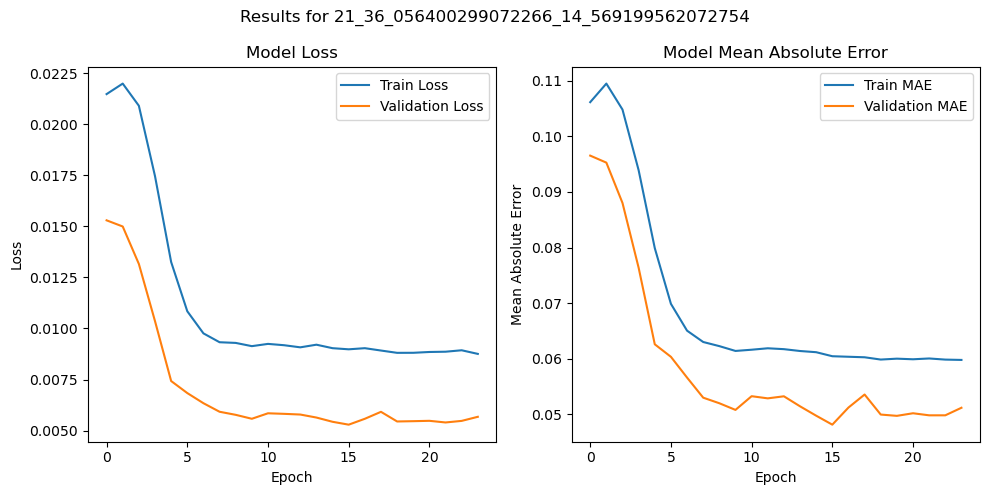

32/32 [==============================] - 26s 769ms/step

Test set Evaluation metrics for file: 21_36_056400299072266_14_569199562072754
Mean Squared Error (MSE): 0.0028003963100139825
Mean Absolute Error (MAE): 0.04129651181917099
Root Mean Squared Error (RMSE): 0.05291877086643248



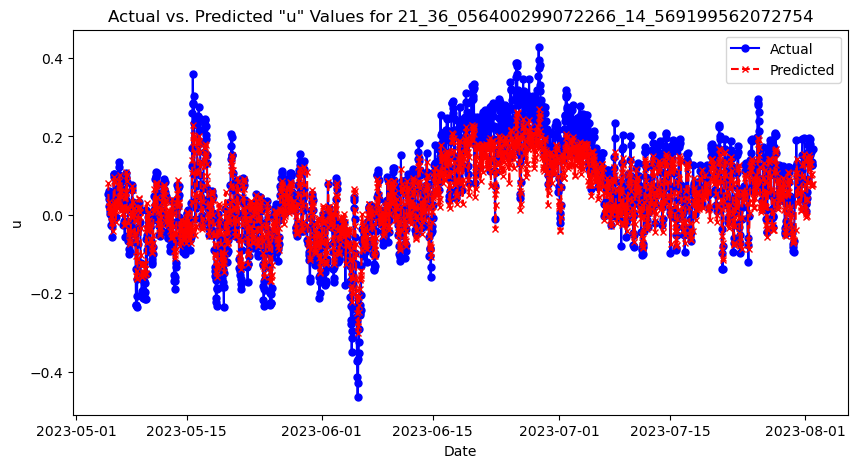

Model tarining & evaluation completed for file: 21_36_056400299072266_14_569199562072754.csv

Processing file: 22_36_07870101928711_14_366399765014648.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
103/103 [==============================] - ETA: 0s - loss: 0.0191 - mean_absolute_error: 0.1068INFO:tensorflow:Assets written to: Data/saved_models/models_u\22_36_07870101928711_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\22_36_07870101928711_14_366399765014648\assets


103/103 [==============================] - 209s 2s/step - loss: 0.0191 - mean_absolute_error: 0.1068 - val_loss: 0.0118 - val_mean_absolute_error: 0.0886
Epoch 2/100
103/103 [==============================] - ETA: 0s - loss: 0.0165 - mean_absolute_error: 0.0969INFO:tensorflow:Assets written to: Data/saved_models/models_u\22_36_07870101928711_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\22_36_07870101928711_14_366399765014648\assets


103/103 [==============================] - 203s 2s/step - loss: 0.0165 - mean_absolute_error: 0.0969 - val_loss: 0.0095 - val_mean_absolute_error: 0.0792
Epoch 3/100
103/103 [==============================] - ETA: 0s - loss: 0.0144 - mean_absolute_error: 0.0891INFO:tensorflow:Assets written to: Data/saved_models/models_u\22_36_07870101928711_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\22_36_07870101928711_14_366399765014648\assets


103/103 [==============================] - 201s 2s/step - loss: 0.0144 - mean_absolute_error: 0.0891 - val_loss: 0.0064 - val_mean_absolute_error: 0.0629
Epoch 4/100
103/103 [==============================] - ETA: 0s - loss: 0.0116 - mean_absolute_error: 0.0791INFO:tensorflow:Assets written to: Data/saved_models/models_u\22_36_07870101928711_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\22_36_07870101928711_14_366399765014648\assets


103/103 [==============================] - 202s 2s/step - loss: 0.0116 - mean_absolute_error: 0.0791 - val_loss: 0.0049 - val_mean_absolute_error: 0.0535
Epoch 5/100
103/103 [==============================] - ETA: 0s - loss: 0.0096 - mean_absolute_error: 0.0699INFO:tensorflow:Assets written to: Data/saved_models/models_u\22_36_07870101928711_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\22_36_07870101928711_14_366399765014648\assets


103/103 [==============================] - 210s 2s/step - loss: 0.0096 - mean_absolute_error: 0.0699 - val_loss: 0.0032 - val_mean_absolute_error: 0.0402
Epoch 6/100
103/103 [==============================] - ETA: 0s - loss: 0.0079 - mean_absolute_error: 0.0618INFO:tensorflow:Assets written to: Data/saved_models/models_u\22_36_07870101928711_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\22_36_07870101928711_14_366399765014648\assets


103/103 [==============================] - 208s 2s/step - loss: 0.0079 - mean_absolute_error: 0.0618 - val_loss: 0.0027 - val_mean_absolute_error: 0.0367
Epoch 7/100
103/103 [==============================] - 196s 2s/step - loss: 0.0074 - mean_absolute_error: 0.0588 - val_loss: 0.0028 - val_mean_absolute_error: 0.0365
Epoch 8/100
103/103 [==============================] - ETA: 0s - loss: 0.0074 - mean_absolute_error: 0.0579INFO:tensorflow:Assets written to: Data/saved_models/models_u\22_36_07870101928711_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\22_36_07870101928711_14_366399765014648\assets


103/103 [==============================] - 204s 2s/step - loss: 0.0074 - mean_absolute_error: 0.0579 - val_loss: 0.0026 - val_mean_absolute_error: 0.0350
Epoch 9/100
103/103 [==============================] - ETA: 0s - loss: 0.0071 - mean_absolute_error: 0.0566INFO:tensorflow:Assets written to: Data/saved_models/models_u\22_36_07870101928711_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\22_36_07870101928711_14_366399765014648\assets


103/103 [==============================] - 206s 2s/step - loss: 0.0071 - mean_absolute_error: 0.0566 - val_loss: 0.0025 - val_mean_absolute_error: 0.0335
Epoch 10/100
103/103 [==============================] - 200s 2s/step - loss: 0.0071 - mean_absolute_error: 0.0569 - val_loss: 0.0026 - val_mean_absolute_error: 0.0348
Epoch 11/100
103/103 [==============================] - 200s 2s/step - loss: 0.0069 - mean_absolute_error: 0.0560 - val_loss: 0.0025 - val_mean_absolute_error: 0.0332
Epoch 12/100
103/103 [==============================] - 199s 2s/step - loss: 0.0068 - mean_absolute_error: 0.0552 - val_loss: 0.0027 - val_mean_absolute_error: 0.0353
Epoch 13/100
103/103 [==============================] - 199s 2s/step - loss: 0.0067 - mean_absolute_error: 0.0552 - val_loss: 0.0026 - val_mean_absolute_error: 0.0340
Epoch 14/100
103/103 [==============================] - ETA: 0s - loss: 0.0068 - mean_absolute_error: 0.0554INFO:tensorflow:Assets written to: Data/saved_models/models_u\22_36_07

INFO:tensorflow:Assets written to: Data/saved_models/models_u\22_36_07870101928711_14_366399765014648\assets


103/103 [==============================] - 209s 2s/step - loss: 0.0068 - mean_absolute_error: 0.0554 - val_loss: 0.0025 - val_mean_absolute_error: 0.0323
Epoch 15/100
103/103 [==============================] - ETA: 0s - loss: 0.0067 - mean_absolute_error: 0.0547INFO:tensorflow:Assets written to: Data/saved_models/models_u\22_36_07870101928711_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\22_36_07870101928711_14_366399765014648\assets


103/103 [==============================] - 205s 2s/step - loss: 0.0067 - mean_absolute_error: 0.0547 - val_loss: 0.0024 - val_mean_absolute_error: 0.0320
Epoch 16/100
103/103 [==============================] - ETA: 0s - loss: 0.0069 - mean_absolute_error: 0.0553INFO:tensorflow:Assets written to: Data/saved_models/models_u\22_36_07870101928711_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\22_36_07870101928711_14_366399765014648\assets


103/103 [==============================] - 209s 2s/step - loss: 0.0069 - mean_absolute_error: 0.0553 - val_loss: 0.0024 - val_mean_absolute_error: 0.0317
Epoch 17/100
103/103 [==============================] - 201s 2s/step - loss: 0.0068 - mean_absolute_error: 0.0553 - val_loss: 0.0024 - val_mean_absolute_error: 0.0317
Epoch 18/100
103/103 [==============================] - 202s 2s/step - loss: 0.0068 - mean_absolute_error: 0.0551 - val_loss: 0.0024 - val_mean_absolute_error: 0.0322
Epoch 19/100
103/103 [==============================] - ETA: 0s - loss: 0.0067 - mean_absolute_error: 0.0540INFO:tensorflow:Assets written to: Data/saved_models/models_u\22_36_07870101928711_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\22_36_07870101928711_14_366399765014648\assets


103/103 [==============================] - 210s 2s/step - loss: 0.0067 - mean_absolute_error: 0.0540 - val_loss: 0.0023 - val_mean_absolute_error: 0.0300
Epoch 20/100
103/103 [==============================] - 198s 2s/step - loss: 0.0068 - mean_absolute_error: 0.0545 - val_loss: 0.0024 - val_mean_absolute_error: 0.0314
Epoch 21/100
103/103 [==============================] - 196s 2s/step - loss: 0.0066 - mean_absolute_error: 0.0537 - val_loss: 0.0024 - val_mean_absolute_error: 0.0323
Epoch 22/100
103/103 [==============================] - 198s 2s/step - loss: 0.0067 - mean_absolute_error: 0.0544 - val_loss: 0.0025 - val_mean_absolute_error: 0.0331
Epoch 23/100
103/103 [==============================] - 198s 2s/step - loss: 0.0068 - mean_absolute_error: 0.0542 - val_loss: 0.0024 - val_mean_absolute_error: 0.0315
Epoch 24/100
103/103 [==============================] - 198s 2s/step - loss: 0.0067 - mean_absolute_error: 0.0541 - val_loss: 0.0025 - val_mean_absolute_error: 0.0329
Epoch 25/10

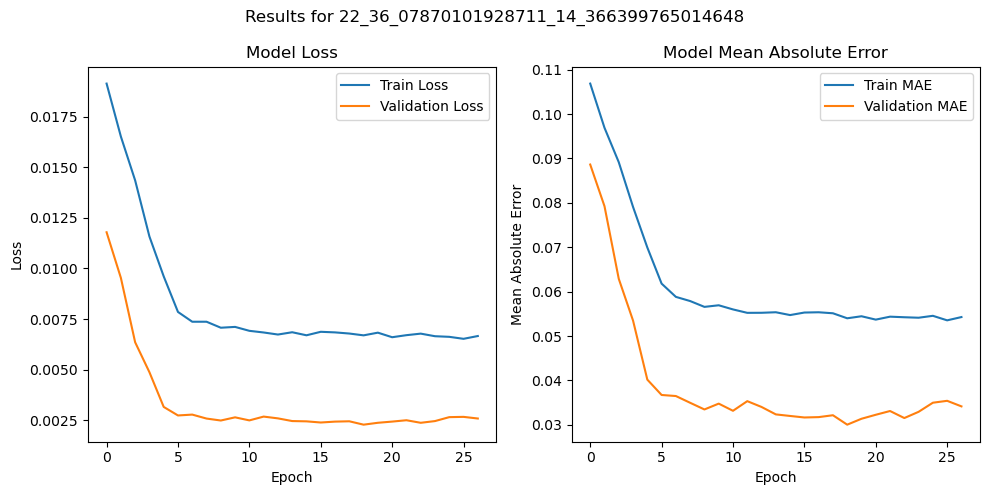

22/22 [==============================] - 19s 800ms/step

Test set Evaluation metrics for file: 22_36_07870101928711_14_366399765014648
Mean Squared Error (MSE): 0.0025802426731814684
Mean Absolute Error (MAE): 0.03822709688778601
Root Mean Squared Error (RMSE): 0.05079608915242854



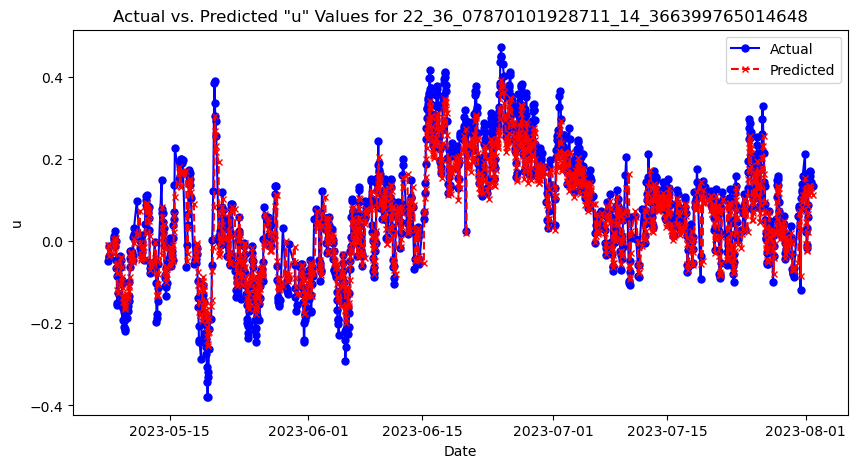

Model tarining & evaluation completed for file: 22_36_07870101928711_14_366399765014648.csv

Processing file: 23_36_07870101928711_14_406900405883789.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
125/125 [==============================] - ETA: 0s - loss: 0.0170 - mean_absolute_error: 0.0995INFO:tensorflow:Assets written to: Data/saved_models/models_u\23_36_07870101928711_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\23_36_07870101928711_14_406900405883789\assets


125/125 [==============================] - 258s 2s/step - loss: 0.0170 - mean_absolute_error: 0.0995 - val_loss: 0.0138 - val_mean_absolute_error: 0.0939
Epoch 2/100
125/125 [==============================] - ETA: 0s - loss: 0.0144 - mean_absolute_error: 0.0901INFO:tensorflow:Assets written to: Data/saved_models/models_u\23_36_07870101928711_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\23_36_07870101928711_14_406900405883789\assets


125/125 [==============================] - 255s 2s/step - loss: 0.0144 - mean_absolute_error: 0.0901 - val_loss: 0.0096 - val_mean_absolute_error: 0.0754
Epoch 3/100
125/125 [==============================] - ETA: 0s - loss: 0.0122 - mean_absolute_error: 0.0821INFO:tensorflow:Assets written to: Data/saved_models/models_u\23_36_07870101928711_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\23_36_07870101928711_14_406900405883789\assets


125/125 [==============================] - 246s 2s/step - loss: 0.0122 - mean_absolute_error: 0.0821 - val_loss: 0.0066 - val_mean_absolute_error: 0.0564
Epoch 4/100
125/125 [==============================] - ETA: 0s - loss: 0.0096 - mean_absolute_error: 0.0710INFO:tensorflow:Assets written to: Data/saved_models/models_u\23_36_07870101928711_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\23_36_07870101928711_14_406900405883789\assets


125/125 [==============================] - 246s 2s/step - loss: 0.0096 - mean_absolute_error: 0.0710 - val_loss: 0.0056 - val_mean_absolute_error: 0.0500
Epoch 5/100
125/125 [==============================] - ETA: 0s - loss: 0.0076 - mean_absolute_error: 0.0611INFO:tensorflow:Assets written to: Data/saved_models/models_u\23_36_07870101928711_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\23_36_07870101928711_14_406900405883789\assets


125/125 [==============================] - 245s 2s/step - loss: 0.0076 - mean_absolute_error: 0.0611 - val_loss: 0.0049 - val_mean_absolute_error: 0.0455
Epoch 6/100
125/125 [==============================] - ETA: 0s - loss: 0.0067 - mean_absolute_error: 0.0562INFO:tensorflow:Assets written to: Data/saved_models/models_u\23_36_07870101928711_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\23_36_07870101928711_14_406900405883789\assets


125/125 [==============================] - 248s 2s/step - loss: 0.0067 - mean_absolute_error: 0.0562 - val_loss: 0.0047 - val_mean_absolute_error: 0.0444
Epoch 7/100
125/125 [==============================] - ETA: 0s - loss: 0.0063 - mean_absolute_error: 0.0533INFO:tensorflow:Assets written to: Data/saved_models/models_u\23_36_07870101928711_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\23_36_07870101928711_14_406900405883789\assets


125/125 [==============================] - 245s 2s/step - loss: 0.0063 - mean_absolute_error: 0.0533 - val_loss: 0.0043 - val_mean_absolute_error: 0.0407
Epoch 8/100
125/125 [==============================] - 234s 2s/step - loss: 0.0061 - mean_absolute_error: 0.0524 - val_loss: 0.0045 - val_mean_absolute_error: 0.0429
Epoch 9/100
125/125 [==============================] - 235s 2s/step - loss: 0.0061 - mean_absolute_error: 0.0515 - val_loss: 0.0043 - val_mean_absolute_error: 0.0408
Epoch 10/100
125/125 [==============================] - 234s 2s/step - loss: 0.0059 - mean_absolute_error: 0.0511 - val_loss: 0.0044 - val_mean_absolute_error: 0.0416
Epoch 11/100
125/125 [==============================] - ETA: 0s - loss: 0.0060 - mean_absolute_error: 0.0507INFO:tensorflow:Assets written to: Data/saved_models/models_u\23_36_07870101928711_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\23_36_07870101928711_14_406900405883789\assets


125/125 [==============================] - 247s 2s/step - loss: 0.0060 - mean_absolute_error: 0.0507 - val_loss: 0.0042 - val_mean_absolute_error: 0.0399
Epoch 12/100
125/125 [==============================] - ETA: 0s - loss: 0.0060 - mean_absolute_error: 0.0504INFO:tensorflow:Assets written to: Data/saved_models/models_u\23_36_07870101928711_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\23_36_07870101928711_14_406900405883789\assets


125/125 [==============================] - 254s 2s/step - loss: 0.0060 - mean_absolute_error: 0.0504 - val_loss: 0.0041 - val_mean_absolute_error: 0.0386
Epoch 13/100
125/125 [==============================] - 239s 2s/step - loss: 0.0059 - mean_absolute_error: 0.0504 - val_loss: 0.0043 - val_mean_absolute_error: 0.0406
Epoch 14/100
125/125 [==============================] - 238s 2s/step - loss: 0.0059 - mean_absolute_error: 0.0506 - val_loss: 0.0044 - val_mean_absolute_error: 0.0415
Epoch 15/100
125/125 [==============================] - 240s 2s/step - loss: 0.0060 - mean_absolute_error: 0.0513 - val_loss: 0.0042 - val_mean_absolute_error: 0.0401
Epoch 16/100
125/125 [==============================] - 238s 2s/step - loss: 0.0060 - mean_absolute_error: 0.0505 - val_loss: 0.0043 - val_mean_absolute_error: 0.0410
Epoch 17/100
125/125 [==============================] - 239s 2s/step - loss: 0.0062 - mean_absolute_error: 0.0519 - val_loss: 0.0045 - val_mean_absolute_error: 0.0425
Epoch 18/10

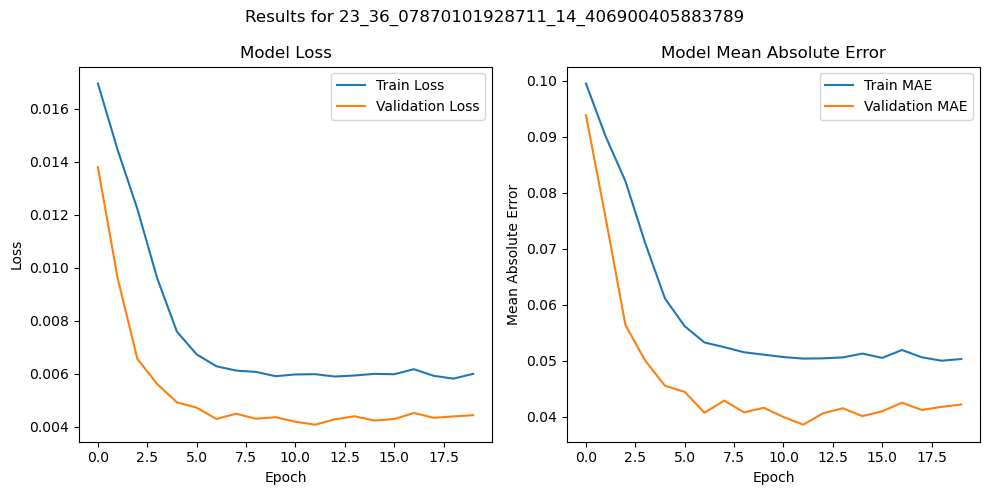

26/26 [==============================] - 23s 807ms/step

Test set Evaluation metrics for file: 23_36_07870101928711_14_406900405883789
Mean Squared Error (MSE): 0.003514877519181322
Mean Absolute Error (MAE): 0.046600756706977775
Root Mean Squared Error (RMSE): 0.059286402481355895



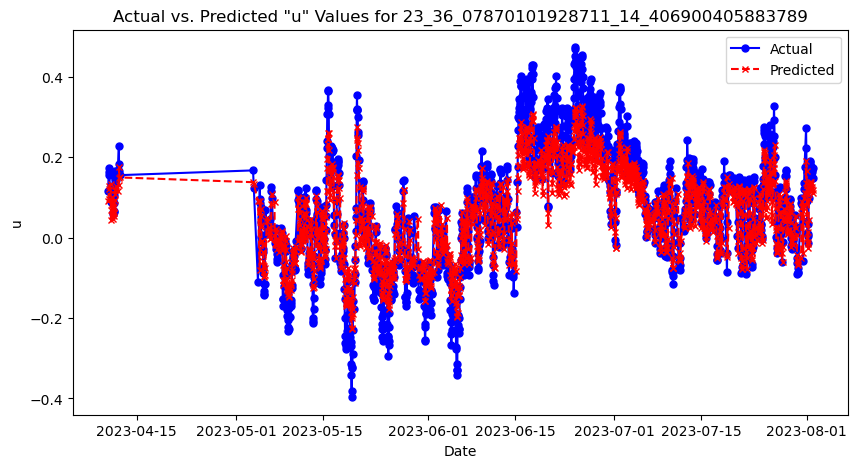

Model tarining & evaluation completed for file: 23_36_07870101928711_14_406900405883789.csv

Processing file: 24_36_07870101928711_14_447500228881836.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
151/151 [==============================] - ETA: 0s - loss: 0.0204 - mean_absolute_error: 0.1080INFO:tensorflow:Assets written to: Data/saved_models/models_u\24_36_07870101928711_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\24_36_07870101928711_14_447500228881836\assets


151/151 [==============================] - 306s 2s/step - loss: 0.0204 - mean_absolute_error: 0.1080 - val_loss: 0.0150 - val_mean_absolute_error: 0.0909
Epoch 2/100
151/151 [==============================] - ETA: 0s - loss: 0.0183 - mean_absolute_error: 0.1010INFO:tensorflow:Assets written to: Data/saved_models/models_u\24_36_07870101928711_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\24_36_07870101928711_14_447500228881836\assets


151/151 [==============================] - 299s 2s/step - loss: 0.0183 - mean_absolute_error: 0.1010 - val_loss: 0.0141 - val_mean_absolute_error: 0.0862
Epoch 3/100
151/151 [==============================] - ETA: 0s - loss: 0.0158 - mean_absolute_error: 0.0933INFO:tensorflow:Assets written to: Data/saved_models/models_u\24_36_07870101928711_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\24_36_07870101928711_14_447500228881836\assets


151/151 [==============================] - 301s 2s/step - loss: 0.0158 - mean_absolute_error: 0.0933 - val_loss: 0.0111 - val_mean_absolute_error: 0.0747
Epoch 4/100
151/151 [==============================] - ETA: 0s - loss: 0.0121 - mean_absolute_error: 0.0786INFO:tensorflow:Assets written to: Data/saved_models/models_u\24_36_07870101928711_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\24_36_07870101928711_14_447500228881836\assets


151/151 [==============================] - 295s 2s/step - loss: 0.0121 - mean_absolute_error: 0.0786 - val_loss: 0.0088 - val_mean_absolute_error: 0.0655
Epoch 5/100
151/151 [==============================] - ETA: 0s - loss: 0.0092 - mean_absolute_error: 0.0660INFO:tensorflow:Assets written to: Data/saved_models/models_u\24_36_07870101928711_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\24_36_07870101928711_14_447500228881836\assets


151/151 [==============================] - 295s 2s/step - loss: 0.0092 - mean_absolute_error: 0.0660 - val_loss: 0.0067 - val_mean_absolute_error: 0.0524
Epoch 6/100
151/151 [==============================] - ETA: 0s - loss: 0.0078 - mean_absolute_error: 0.0592INFO:tensorflow:Assets written to: Data/saved_models/models_u\24_36_07870101928711_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\24_36_07870101928711_14_447500228881836\assets


151/151 [==============================] - 308s 2s/step - loss: 0.0078 - mean_absolute_error: 0.0592 - val_loss: 0.0061 - val_mean_absolute_error: 0.0492
Epoch 7/100
151/151 [==============================] - ETA: 0s - loss: 0.0073 - mean_absolute_error: 0.0559INFO:tensorflow:Assets written to: Data/saved_models/models_u\24_36_07870101928711_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\24_36_07870101928711_14_447500228881836\assets


151/151 [==============================] - 299s 2s/step - loss: 0.0073 - mean_absolute_error: 0.0559 - val_loss: 0.0059 - val_mean_absolute_error: 0.0474
Epoch 8/100
151/151 [==============================] - 292s 2s/step - loss: 0.0074 - mean_absolute_error: 0.0556 - val_loss: 0.0059 - val_mean_absolute_error: 0.0482
Epoch 9/100
151/151 [==============================] - ETA: 0s - loss: 0.0071 - mean_absolute_error: 0.0539INFO:tensorflow:Assets written to: Data/saved_models/models_u\24_36_07870101928711_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\24_36_07870101928711_14_447500228881836\assets


151/151 [==============================] - 305s 2s/step - loss: 0.0071 - mean_absolute_error: 0.0539 - val_loss: 0.0058 - val_mean_absolute_error: 0.0473
Epoch 10/100
151/151 [==============================] - ETA: 0s - loss: 0.0072 - mean_absolute_error: 0.0547INFO:tensorflow:Assets written to: Data/saved_models/models_u\24_36_07870101928711_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\24_36_07870101928711_14_447500228881836\assets


151/151 [==============================] - 303s 2s/step - loss: 0.0072 - mean_absolute_error: 0.0547 - val_loss: 0.0057 - val_mean_absolute_error: 0.0466
Epoch 11/100
151/151 [==============================] - ETA: 0s - loss: 0.0070 - mean_absolute_error: 0.0539INFO:tensorflow:Assets written to: Data/saved_models/models_u\24_36_07870101928711_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\24_36_07870101928711_14_447500228881836\assets


151/151 [==============================] - 301s 2s/step - loss: 0.0070 - mean_absolute_error: 0.0539 - val_loss: 0.0056 - val_mean_absolute_error: 0.0456
Epoch 12/100
151/151 [==============================] - ETA: 0s - loss: 0.0070 - mean_absolute_error: 0.0536INFO:tensorflow:Assets written to: Data/saved_models/models_u\24_36_07870101928711_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\24_36_07870101928711_14_447500228881836\assets


151/151 [==============================] - 303s 2s/step - loss: 0.0070 - mean_absolute_error: 0.0536 - val_loss: 0.0056 - val_mean_absolute_error: 0.0455
Epoch 13/100
151/151 [==============================] - 287s 2s/step - loss: 0.0072 - mean_absolute_error: 0.0546 - val_loss: 0.0058 - val_mean_absolute_error: 0.0469
Epoch 14/100
151/151 [==============================] - ETA: 0s - loss: 0.0071 - mean_absolute_error: 0.0543INFO:tensorflow:Assets written to: Data/saved_models/models_u\24_36_07870101928711_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\24_36_07870101928711_14_447500228881836\assets


151/151 [==============================] - 297s 2s/step - loss: 0.0071 - mean_absolute_error: 0.0543 - val_loss: 0.0055 - val_mean_absolute_error: 0.0445
Epoch 15/100
151/151 [==============================] - 294s 2s/step - loss: 0.0071 - mean_absolute_error: 0.0538 - val_loss: 0.0058 - val_mean_absolute_error: 0.0473
Epoch 16/100
151/151 [==============================] - ETA: 0s - loss: 0.0070 - mean_absolute_error: 0.0543INFO:tensorflow:Assets written to: Data/saved_models/models_u\24_36_07870101928711_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\24_36_07870101928711_14_447500228881836\assets


151/151 [==============================] - 301s 2s/step - loss: 0.0070 - mean_absolute_error: 0.0543 - val_loss: 0.0052 - val_mean_absolute_error: 0.0423
Epoch 17/100
151/151 [==============================] - 288s 2s/step - loss: 0.0071 - mean_absolute_error: 0.0543 - val_loss: 0.0057 - val_mean_absolute_error: 0.0463
Epoch 18/100
151/151 [==============================] - 287s 2s/step - loss: 0.0071 - mean_absolute_error: 0.0544 - val_loss: 0.0056 - val_mean_absolute_error: 0.0458
Epoch 19/100
151/151 [==============================] - 288s 2s/step - loss: 0.0070 - mean_absolute_error: 0.0538 - val_loss: 0.0055 - val_mean_absolute_error: 0.0450
Epoch 20/100
151/151 [==============================] - 287s 2s/step - loss: 0.0069 - mean_absolute_error: 0.0542 - val_loss: 0.0056 - val_mean_absolute_error: 0.0461
Epoch 21/100
151/151 [==============================] - 288s 2s/step - loss: 0.0069 - mean_absolute_error: 0.0539 - val_loss: 0.0054 - val_mean_absolute_error: 0.0445
Epoch 22/10

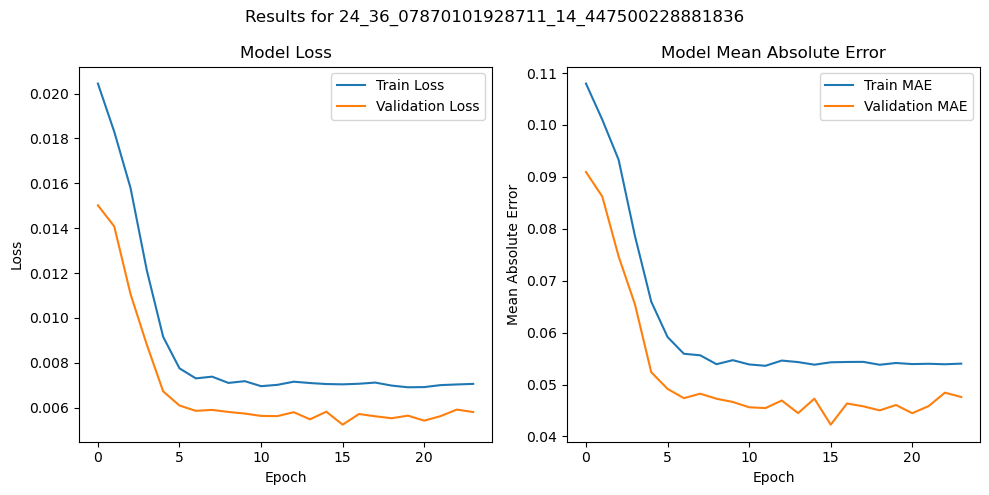

32/32 [==============================] - 27s 792ms/step

Test set Evaluation metrics for file: 24_36_07870101928711_14_447500228881836
Mean Squared Error (MSE): 0.002760822862310253
Mean Absolute Error (MAE): 0.04066539434843065
Root Mean Squared Error (RMSE): 0.052543533020822396



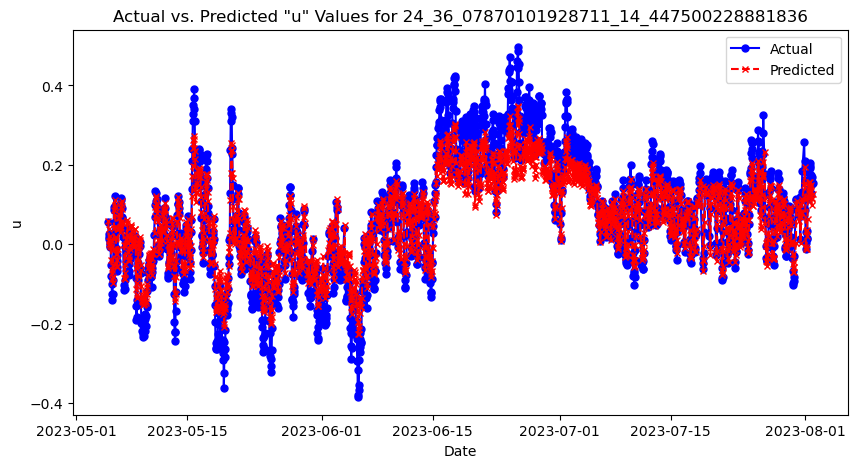

Model tarining & evaluation completed for file: 24_36_07870101928711_14_447500228881836.csv

Processing file: 25_36_07870101928711_14_48799991607666.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
154/154 [==============================] - ETA: 0s - loss: 0.0256 - mean_absolute_error: 0.1199INFO:tensorflow:Assets written to: Data/saved_models/models_u\25_36_07870101928711_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\25_36_07870101928711_14_48799991607666\assets


154/154 [==============================] - 307s 2s/step - loss: 0.0256 - mean_absolute_error: 0.1199 - val_loss: 0.0178 - val_mean_absolute_error: 0.0956
Epoch 2/100
154/154 [==============================] - 286s 2s/step - loss: 0.0234 - mean_absolute_error: 0.1132 - val_loss: 0.0182 - val_mean_absolute_error: 0.0966
Epoch 3/100
154/154 [==============================] - ETA: 0s - loss: 0.0210 - mean_absolute_error: 0.1066INFO:tensorflow:Assets written to: Data/saved_models/models_u\25_36_07870101928711_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\25_36_07870101928711_14_48799991607666\assets


154/154 [==============================] - 299s 2s/step - loss: 0.0210 - mean_absolute_error: 0.1066 - val_loss: 0.0164 - val_mean_absolute_error: 0.0910
Epoch 4/100
154/154 [==============================] - ETA: 0s - loss: 0.0175 - mean_absolute_error: 0.0962INFO:tensorflow:Assets written to: Data/saved_models/models_u\25_36_07870101928711_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\25_36_07870101928711_14_48799991607666\assets


154/154 [==============================] - 301s 2s/step - loss: 0.0175 - mean_absolute_error: 0.0962 - val_loss: 0.0136 - val_mean_absolute_error: 0.0812
Epoch 5/100
154/154 [==============================] - ETA: 0s - loss: 0.0132 - mean_absolute_error: 0.0801INFO:tensorflow:Assets written to: Data/saved_models/models_u\25_36_07870101928711_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\25_36_07870101928711_14_48799991607666\assets


154/154 [==============================] - 301s 2s/step - loss: 0.0132 - mean_absolute_error: 0.0801 - val_loss: 0.0110 - val_mean_absolute_error: 0.0710
Epoch 6/100
154/154 [==============================] - ETA: 0s - loss: 0.0107 - mean_absolute_error: 0.0698INFO:tensorflow:Assets written to: Data/saved_models/models_u\25_36_07870101928711_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\25_36_07870101928711_14_48799991607666\assets


154/154 [==============================] - 301s 2s/step - loss: 0.0107 - mean_absolute_error: 0.0698 - val_loss: 0.0096 - val_mean_absolute_error: 0.0660
Epoch 7/100
154/154 [==============================] - ETA: 0s - loss: 0.0092 - mean_absolute_error: 0.0625INFO:tensorflow:Assets written to: Data/saved_models/models_u\25_36_07870101928711_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\25_36_07870101928711_14_48799991607666\assets


154/154 [==============================] - 301s 2s/step - loss: 0.0092 - mean_absolute_error: 0.0625 - val_loss: 0.0079 - val_mean_absolute_error: 0.0563
Epoch 8/100
154/154 [==============================] - ETA: 0s - loss: 0.0089 - mean_absolute_error: 0.0603INFO:tensorflow:Assets written to: Data/saved_models/models_u\25_36_07870101928711_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\25_36_07870101928711_14_48799991607666\assets


154/154 [==============================] - 301s 2s/step - loss: 0.0089 - mean_absolute_error: 0.0603 - val_loss: 0.0077 - val_mean_absolute_error: 0.0541
Epoch 9/100
154/154 [==============================] - ETA: 0s - loss: 0.0086 - mean_absolute_error: 0.0592INFO:tensorflow:Assets written to: Data/saved_models/models_u\25_36_07870101928711_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\25_36_07870101928711_14_48799991607666\assets


154/154 [==============================] - 299s 2s/step - loss: 0.0086 - mean_absolute_error: 0.0592 - val_loss: 0.0076 - val_mean_absolute_error: 0.0532
Epoch 10/100
154/154 [==============================] - ETA: 0s - loss: 0.0087 - mean_absolute_error: 0.0596INFO:tensorflow:Assets written to: Data/saved_models/models_u\25_36_07870101928711_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\25_36_07870101928711_14_48799991607666\assets


154/154 [==============================] - 309s 2s/step - loss: 0.0087 - mean_absolute_error: 0.0596 - val_loss: 0.0075 - val_mean_absolute_error: 0.0524
Epoch 11/100
154/154 [==============================] - ETA: 0s - loss: 0.0083 - mean_absolute_error: 0.0575INFO:tensorflow:Assets written to: Data/saved_models/models_u\25_36_07870101928711_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\25_36_07870101928711_14_48799991607666\assets


154/154 [==============================] - 309s 2s/step - loss: 0.0083 - mean_absolute_error: 0.0575 - val_loss: 0.0074 - val_mean_absolute_error: 0.0514
Epoch 12/100
154/154 [==============================] - ETA: 0s - loss: 0.0083 - mean_absolute_error: 0.0577INFO:tensorflow:Assets written to: Data/saved_models/models_u\25_36_07870101928711_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\25_36_07870101928711_14_48799991607666\assets


154/154 [==============================] - 311s 2s/step - loss: 0.0083 - mean_absolute_error: 0.0577 - val_loss: 0.0073 - val_mean_absolute_error: 0.0505
Epoch 13/100
154/154 [==============================] - 295s 2s/step - loss: 0.0083 - mean_absolute_error: 0.0577 - val_loss: 0.0077 - val_mean_absolute_error: 0.0537
Epoch 14/100
154/154 [==============================] - 299s 2s/step - loss: 0.0082 - mean_absolute_error: 0.0576 - val_loss: 0.0074 - val_mean_absolute_error: 0.0516
Epoch 15/100
154/154 [==============================] - ETA: 0s - loss: 0.0086 - mean_absolute_error: 0.0592INFO:tensorflow:Assets written to: Data/saved_models/models_u\25_36_07870101928711_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\25_36_07870101928711_14_48799991607666\assets


154/154 [==============================] - 307s 2s/step - loss: 0.0086 - mean_absolute_error: 0.0592 - val_loss: 0.0071 - val_mean_absolute_error: 0.0493
Epoch 16/100
154/154 [==============================] - 304s 2s/step - loss: 0.0084 - mean_absolute_error: 0.0576 - val_loss: 0.0071 - val_mean_absolute_error: 0.0493
Epoch 17/100
154/154 [==============================] - 306s 2s/step - loss: 0.0085 - mean_absolute_error: 0.0585 - val_loss: 0.0072 - val_mean_absolute_error: 0.0505
Epoch 18/100
154/154 [==============================] - 304s 2s/step - loss: 0.0084 - mean_absolute_error: 0.0579 - val_loss: 0.0073 - val_mean_absolute_error: 0.0509
Epoch 19/100
154/154 [==============================] - 306s 2s/step - loss: 0.0082 - mean_absolute_error: 0.0574 - val_loss: 0.0072 - val_mean_absolute_error: 0.0503
Epoch 20/100
154/154 [==============================] - 305s 2s/step - loss: 0.0082 - mean_absolute_error: 0.0576 - val_loss: 0.0074 - val_mean_absolute_error: 0.0517
Epoch 21/10

INFO:tensorflow:Assets written to: Data/saved_models/models_u\25_36_07870101928711_14_48799991607666\assets


154/154 [==============================] - 313s 2s/step - loss: 0.0083 - mean_absolute_error: 0.0582 - val_loss: 0.0070 - val_mean_absolute_error: 0.0489
Epoch 23/100
154/154 [==============================] - ETA: 0s - loss: 0.0082 - mean_absolute_error: 0.0568INFO:tensorflow:Assets written to: Data/saved_models/models_u\25_36_07870101928711_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\25_36_07870101928711_14_48799991607666\assets


154/154 [==============================] - 307s 2s/step - loss: 0.0082 - mean_absolute_error: 0.0568 - val_loss: 0.0068 - val_mean_absolute_error: 0.0471
Epoch 24/100
154/154 [==============================] - 302s 2s/step - loss: 0.0084 - mean_absolute_error: 0.0579 - val_loss: 0.0074 - val_mean_absolute_error: 0.0517
Epoch 25/100
154/154 [==============================] - 301s 2s/step - loss: 0.0084 - mean_absolute_error: 0.0581 - val_loss: 0.0073 - val_mean_absolute_error: 0.0511
Epoch 26/100
154/154 [==============================] - 303s 2s/step - loss: 0.0083 - mean_absolute_error: 0.0574 - val_loss: 0.0074 - val_mean_absolute_error: 0.0518
Epoch 27/100
154/154 [==============================] - 302s 2s/step - loss: 0.0084 - mean_absolute_error: 0.0575 - val_loss: 0.0073 - val_mean_absolute_error: 0.0510
Epoch 28/100
154/154 [==============================] - 302s 2s/step - loss: 0.0082 - mean_absolute_error: 0.0571 - val_loss: 0.0078 - val_mean_absolute_error: 0.0545
Epoch 29/10

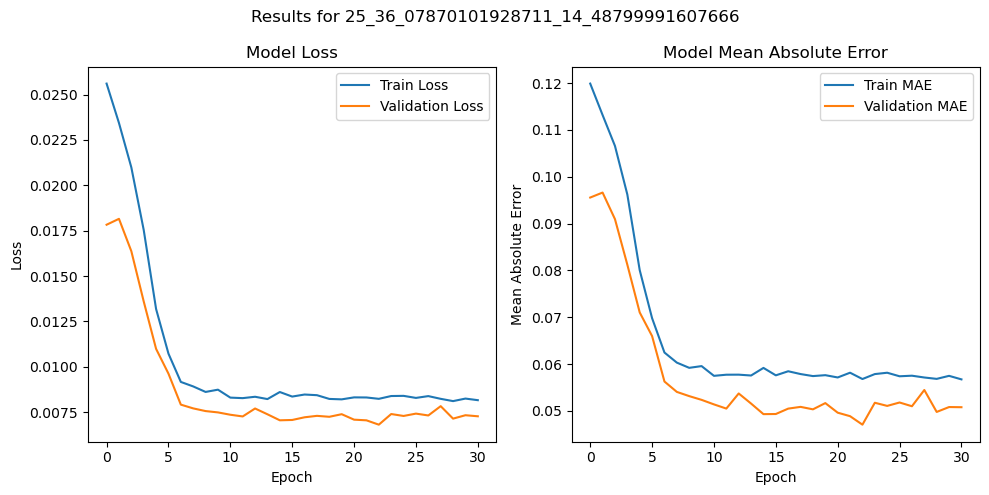

33/33 [==============================] - 28s 795ms/step

Test set Evaluation metrics for file: 25_36_07870101928711_14_48799991607666
Mean Squared Error (MSE): 0.0025781429840815596
Mean Absolute Error (MAE): 0.03926415033830729
Root Mean Squared Error (RMSE): 0.05077541712365896



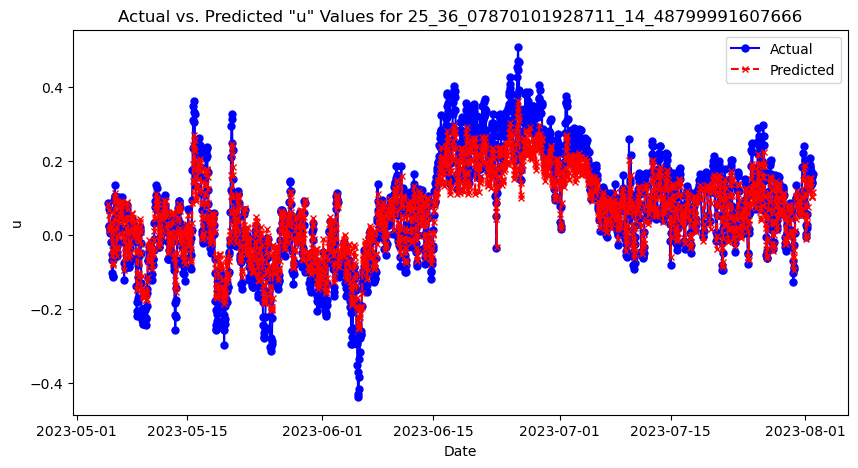

Model tarining & evaluation completed for file: 25_36_07870101928711_14_48799991607666.csv

Processing file: 26_36_07870101928711_14_528599739074707.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
174/174 [==============================] - ETA: 0s - loss: 0.0269 - mean_absolute_error: 0.1221INFO:tensorflow:Assets written to: Data/saved_models/models_u\26_36_07870101928711_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\26_36_07870101928711_14_528599739074707\assets


174/174 [==============================] - 342s 2s/step - loss: 0.0269 - mean_absolute_error: 0.1221 - val_loss: 0.0217 - val_mean_absolute_error: 0.1053
Epoch 2/100
174/174 [==============================] - ETA: 0s - loss: 0.0275 - mean_absolute_error: 0.1238INFO:tensorflow:Assets written to: Data/saved_models/models_u\26_36_07870101928711_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\26_36_07870101928711_14_528599739074707\assets


174/174 [==============================] - 332s 2s/step - loss: 0.0275 - mean_absolute_error: 0.1238 - val_loss: 0.0184 - val_mean_absolute_error: 0.0934
Epoch 3/100
174/174 [==============================] - ETA: 0s - loss: 0.0232 - mean_absolute_error: 0.1123INFO:tensorflow:Assets written to: Data/saved_models/models_u\26_36_07870101928711_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\26_36_07870101928711_14_528599739074707\assets


174/174 [==============================] - 328s 2s/step - loss: 0.0232 - mean_absolute_error: 0.1123 - val_loss: 0.0159 - val_mean_absolute_error: 0.0846
Epoch 4/100
174/174 [==============================] - ETA: 0s - loss: 0.0166 - mean_absolute_error: 0.0923INFO:tensorflow:Assets written to: Data/saved_models/models_u\26_36_07870101928711_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\26_36_07870101928711_14_528599739074707\assets


174/174 [==============================] - 329s 2s/step - loss: 0.0166 - mean_absolute_error: 0.0923 - val_loss: 0.0126 - val_mean_absolute_error: 0.0749
Epoch 5/100
174/174 [==============================] - ETA: 0s - loss: 0.0135 - mean_absolute_error: 0.0805INFO:tensorflow:Assets written to: Data/saved_models/models_u\26_36_07870101928711_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\26_36_07870101928711_14_528599739074707\assets


174/174 [==============================] - 348s 2s/step - loss: 0.0135 - mean_absolute_error: 0.0805 - val_loss: 0.0100 - val_mean_absolute_error: 0.0616
Epoch 6/100
174/174 [==============================] - ETA: 0s - loss: 0.0116 - mean_absolute_error: 0.0728INFO:tensorflow:Assets written to: Data/saved_models/models_u\26_36_07870101928711_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\26_36_07870101928711_14_528599739074707\assets


174/174 [==============================] - 348s 2s/step - loss: 0.0116 - mean_absolute_error: 0.0728 - val_loss: 0.0089 - val_mean_absolute_error: 0.0537
Epoch 7/100
174/174 [==============================] - ETA: 0s - loss: 0.0105 - mean_absolute_error: 0.0684INFO:tensorflow:Assets written to: Data/saved_models/models_u\26_36_07870101928711_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\26_36_07870101928711_14_528599739074707\assets


174/174 [==============================] - 343s 2s/step - loss: 0.0105 - mean_absolute_error: 0.0684 - val_loss: 0.0086 - val_mean_absolute_error: 0.0513
Epoch 8/100
174/174 [==============================] - 336s 2s/step - loss: 0.0102 - mean_absolute_error: 0.0669 - val_loss: 0.0087 - val_mean_absolute_error: 0.0521
Epoch 9/100
174/174 [==============================] - 331s 2s/step - loss: 0.0104 - mean_absolute_error: 0.0673 - val_loss: 0.0087 - val_mean_absolute_error: 0.0521
Epoch 10/100
174/174 [==============================] - ETA: 0s - loss: 0.0103 - mean_absolute_error: 0.0663INFO:tensorflow:Assets written to: Data/saved_models/models_u\26_36_07870101928711_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\26_36_07870101928711_14_528599739074707\assets


174/174 [==============================] - 346s 2s/step - loss: 0.0103 - mean_absolute_error: 0.0663 - val_loss: 0.0086 - val_mean_absolute_error: 0.0508
Epoch 11/100
174/174 [==============================] - 338s 2s/step - loss: 0.0100 - mean_absolute_error: 0.0654 - val_loss: 0.0088 - val_mean_absolute_error: 0.0525
Epoch 12/100
174/174 [==============================] - 334s 2s/step - loss: 0.0098 - mean_absolute_error: 0.0645 - val_loss: 0.0088 - val_mean_absolute_error: 0.0520
Epoch 13/100
174/174 [==============================] - 335s 2s/step - loss: 0.0098 - mean_absolute_error: 0.0647 - val_loss: 0.0087 - val_mean_absolute_error: 0.0516
Epoch 14/100
174/174 [==============================] - 339s 2s/step - loss: 0.0100 - mean_absolute_error: 0.0649 - val_loss: 0.0090 - val_mean_absolute_error: 0.0530
Epoch 15/100
174/174 [==============================] - 334s 2s/step - loss: 0.0098 - mean_absolute_error: 0.0638 - val_loss: 0.0088 - val_mean_absolute_error: 0.0516
Epoch 16/10

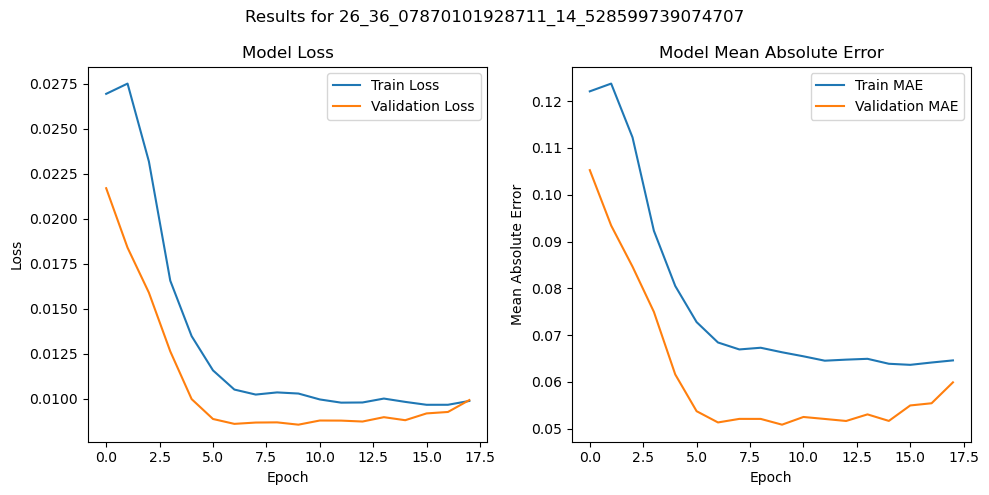

37/37 [==============================] - 31s 792ms/step

Test set Evaluation metrics for file: 26_36_07870101928711_14_528599739074707
Mean Squared Error (MSE): 0.002465095852756523
Mean Absolute Error (MAE): 0.038398485410945336
Root Mean Squared Error (RMSE): 0.049649731648383794



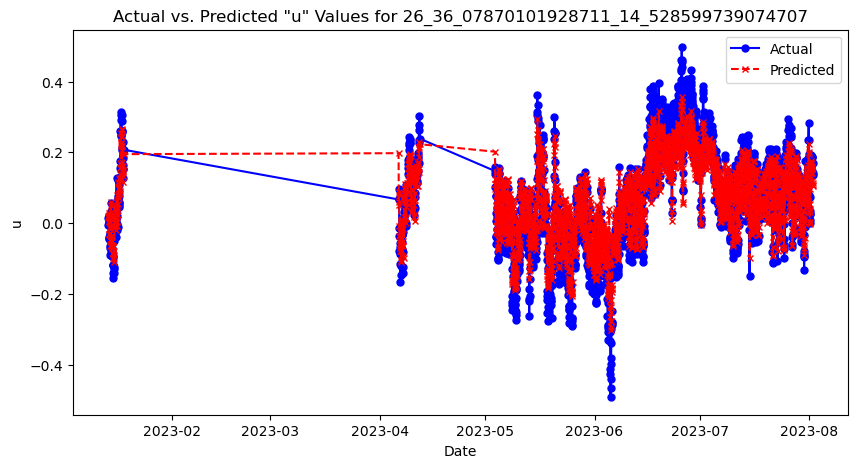

Model tarining & evaluation completed for file: 26_36_07870101928711_14_528599739074707.csv

Processing file: 27_36_07870101928711_14_569199562072754.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
171/171 [==============================] - ETA: 0s - loss: 0.0260 - mean_absolute_error: 0.1206INFO:tensorflow:Assets written to: Data/saved_models/models_u\27_36_07870101928711_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\27_36_07870101928711_14_569199562072754\assets


171/171 [==============================] - 335s 2s/step - loss: 0.0260 - mean_absolute_error: 0.1206 - val_loss: 0.0135 - val_mean_absolute_error: 0.0879
Epoch 2/100
171/171 [==============================] - ETA: 0s - loss: 0.0255 - mean_absolute_error: 0.1179INFO:tensorflow:Assets written to: Data/saved_models/models_u\27_36_07870101928711_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\27_36_07870101928711_14_569199562072754\assets


171/171 [==============================] - 328s 2s/step - loss: 0.0255 - mean_absolute_error: 0.1179 - val_loss: 0.0134 - val_mean_absolute_error: 0.0879
Epoch 3/100
171/171 [==============================] - ETA: 0s - loss: 0.0238 - mean_absolute_error: 0.1138INFO:tensorflow:Assets written to: Data/saved_models/models_u\27_36_07870101928711_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\27_36_07870101928711_14_569199562072754\assets


171/171 [==============================] - 322s 2s/step - loss: 0.0238 - mean_absolute_error: 0.1138 - val_loss: 0.0107 - val_mean_absolute_error: 0.0770
Epoch 4/100
171/171 [==============================] - ETA: 0s - loss: 0.0185 - mean_absolute_error: 0.0972INFO:tensorflow:Assets written to: Data/saved_models/models_u\27_36_07870101928711_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\27_36_07870101928711_14_569199562072754\assets


171/171 [==============================] - 334s 2s/step - loss: 0.0185 - mean_absolute_error: 0.0972 - val_loss: 0.0087 - val_mean_absolute_error: 0.0690
Epoch 5/100
171/171 [==============================] - ETA: 0s - loss: 0.0149 - mean_absolute_error: 0.0850INFO:tensorflow:Assets written to: Data/saved_models/models_u\27_36_07870101928711_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\27_36_07870101928711_14_569199562072754\assets


171/171 [==============================] - 327s 2s/step - loss: 0.0149 - mean_absolute_error: 0.0850 - val_loss: 0.0067 - val_mean_absolute_error: 0.0586
Epoch 6/100
171/171 [==============================] - ETA: 0s - loss: 0.0130 - mean_absolute_error: 0.0771INFO:tensorflow:Assets written to: Data/saved_models/models_u\27_36_07870101928711_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\27_36_07870101928711_14_569199562072754\assets


171/171 [==============================] - 330s 2s/step - loss: 0.0130 - mean_absolute_error: 0.0771 - val_loss: 0.0056 - val_mean_absolute_error: 0.0491
Epoch 7/100
171/171 [==============================] - ETA: 0s - loss: 0.0121 - mean_absolute_error: 0.0732INFO:tensorflow:Assets written to: Data/saved_models/models_u\27_36_07870101928711_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\27_36_07870101928711_14_569199562072754\assets


171/171 [==============================] - 353s 2s/step - loss: 0.0121 - mean_absolute_error: 0.0732 - val_loss: 0.0053 - val_mean_absolute_error: 0.0470
Epoch 8/100
171/171 [==============================] - 338s 2s/step - loss: 0.0116 - mean_absolute_error: 0.0714 - val_loss: 0.0053 - val_mean_absolute_error: 0.0474
Epoch 9/100
171/171 [==============================] - ETA: 0s - loss: 0.0113 - mean_absolute_error: 0.0705INFO:tensorflow:Assets written to: Data/saved_models/models_u\27_36_07870101928711_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\27_36_07870101928711_14_569199562072754\assets


171/171 [==============================] - 348s 2s/step - loss: 0.0113 - mean_absolute_error: 0.0705 - val_loss: 0.0051 - val_mean_absolute_error: 0.0462
Epoch 10/100
171/171 [==============================] - ETA: 0s - loss: 0.0113 - mean_absolute_error: 0.0692INFO:tensorflow:Assets written to: Data/saved_models/models_u\27_36_07870101928711_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\27_36_07870101928711_14_569199562072754\assets


171/171 [==============================] - 354s 2s/step - loss: 0.0113 - mean_absolute_error: 0.0692 - val_loss: 0.0051 - val_mean_absolute_error: 0.0457
Epoch 11/100
171/171 [==============================] - ETA: 0s - loss: 0.0110 - mean_absolute_error: 0.0686INFO:tensorflow:Assets written to: Data/saved_models/models_u\27_36_07870101928711_14_569199562072754\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\27_36_07870101928711_14_569199562072754\assets


171/171 [==============================] - 346s 2s/step - loss: 0.0110 - mean_absolute_error: 0.0686 - val_loss: 0.0051 - val_mean_absolute_error: 0.0454
Epoch 12/100
171/171 [==============================] - 341s 2s/step - loss: 0.0109 - mean_absolute_error: 0.0671 - val_loss: 0.0054 - val_mean_absolute_error: 0.0482
Epoch 13/100
171/171 [==============================] - 339s 2s/step - loss: 0.0110 - mean_absolute_error: 0.0683 - val_loss: 0.0053 - val_mean_absolute_error: 0.0472
Epoch 14/100
171/171 [==============================] - 337s 2s/step - loss: 0.0108 - mean_absolute_error: 0.0666 - val_loss: 0.0052 - val_mean_absolute_error: 0.0462
Epoch 15/100
171/171 [==============================] - 339s 2s/step - loss: 0.0110 - mean_absolute_error: 0.0676 - val_loss: 0.0052 - val_mean_absolute_error: 0.0468
Epoch 16/100
171/171 [==============================] - 337s 2s/step - loss: 0.0108 - mean_absolute_error: 0.0674 - val_loss: 0.0055 - val_mean_absolute_error: 0.0490
Epoch 17/10

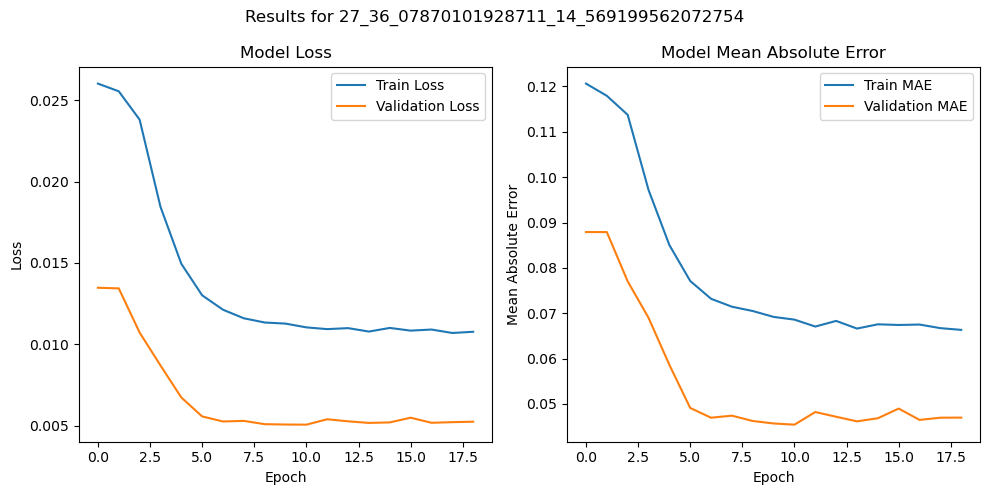

36/36 [==============================] - 32s 836ms/step

Test set Evaluation metrics for file: 27_36_07870101928711_14_569199562072754
Mean Squared Error (MSE): 0.002491964676301383
Mean Absolute Error (MAE): 0.03918275461372759
Root Mean Squared Error (RMSE): 0.04991958209261555



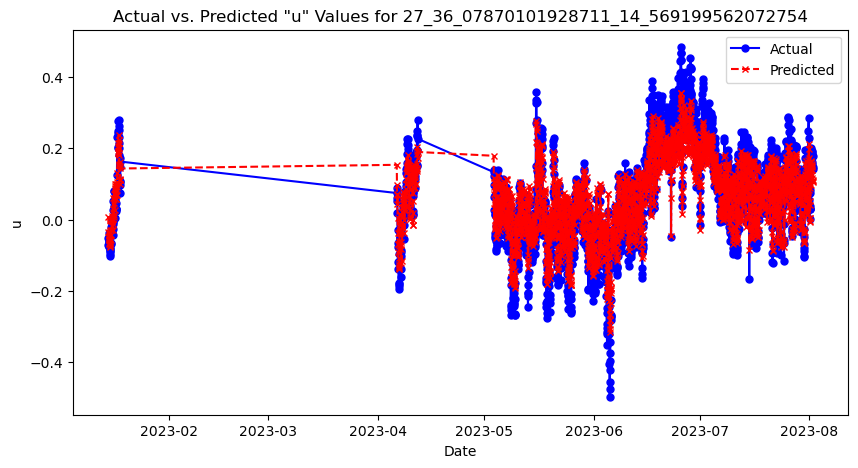

Model tarining & evaluation completed for file: 27_36_07870101928711_14_569199562072754.csv

Processing file: 28_35_945098876953125_14_528599739074707.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
79/79 [==============================] - ETA: 0s - loss: 0.0152 - mean_absolute_error: 0.0979INFO:tensorflow:Assets written to: Data/saved_models/models_u\28_35_945098876953125_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\28_35_945098876953125_14_528599739074707\assets


79/79 [==============================] - 165s 2s/step - loss: 0.0152 - mean_absolute_error: 0.0979 - val_loss: 0.0175 - val_mean_absolute_error: 0.1057
Epoch 2/100
79/79 [==============================] - ETA: 0s - loss: 0.0137 - mean_absolute_error: 0.0927INFO:tensorflow:Assets written to: Data/saved_models/models_u\28_35_945098876953125_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\28_35_945098876953125_14_528599739074707\assets


79/79 [==============================] - 156s 2s/step - loss: 0.0137 - mean_absolute_error: 0.0927 - val_loss: 0.0169 - val_mean_absolute_error: 0.1038
Epoch 3/100
79/79 [==============================] - ETA: 0s - loss: 0.0132 - mean_absolute_error: 0.0904INFO:tensorflow:Assets written to: Data/saved_models/models_u\28_35_945098876953125_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\28_35_945098876953125_14_528599739074707\assets


79/79 [==============================] - 155s 2s/step - loss: 0.0132 - mean_absolute_error: 0.0904 - val_loss: 0.0152 - val_mean_absolute_error: 0.0978
Epoch 4/100
79/79 [==============================] - ETA: 0s - loss: 0.0110 - mean_absolute_error: 0.0803INFO:tensorflow:Assets written to: Data/saved_models/models_u\28_35_945098876953125_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\28_35_945098876953125_14_528599739074707\assets


79/79 [==============================] - 157s 2s/step - loss: 0.0110 - mean_absolute_error: 0.0803 - val_loss: 0.0101 - val_mean_absolute_error: 0.0778
Epoch 5/100
79/79 [==============================] - ETA: 0s - loss: 0.0084 - mean_absolute_error: 0.0673INFO:tensorflow:Assets written to: Data/saved_models/models_u\28_35_945098876953125_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\28_35_945098876953125_14_528599739074707\assets


79/79 [==============================] - 157s 2s/step - loss: 0.0084 - mean_absolute_error: 0.0673 - val_loss: 0.0078 - val_mean_absolute_error: 0.0665
Epoch 6/100
79/79 [==============================] - ETA: 0s - loss: 0.0074 - mean_absolute_error: 0.0620INFO:tensorflow:Assets written to: Data/saved_models/models_u\28_35_945098876953125_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\28_35_945098876953125_14_528599739074707\assets


79/79 [==============================] - 156s 2s/step - loss: 0.0074 - mean_absolute_error: 0.0620 - val_loss: 0.0067 - val_mean_absolute_error: 0.0602
Epoch 7/100
79/79 [==============================] - ETA: 0s - loss: 0.0067 - mean_absolute_error: 0.0580INFO:tensorflow:Assets written to: Data/saved_models/models_u\28_35_945098876953125_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\28_35_945098876953125_14_528599739074707\assets


79/79 [==============================] - 166s 2s/step - loss: 0.0067 - mean_absolute_error: 0.0580 - val_loss: 0.0059 - val_mean_absolute_error: 0.0547
Epoch 8/100
79/79 [==============================] - ETA: 0s - loss: 0.0062 - mean_absolute_error: 0.0547INFO:tensorflow:Assets written to: Data/saved_models/models_u\28_35_945098876953125_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\28_35_945098876953125_14_528599739074707\assets


79/79 [==============================] - 164s 2s/step - loss: 0.0062 - mean_absolute_error: 0.0547 - val_loss: 0.0055 - val_mean_absolute_error: 0.0525
Epoch 9/100
79/79 [==============================] - ETA: 0s - loss: 0.0059 - mean_absolute_error: 0.0532INFO:tensorflow:Assets written to: Data/saved_models/models_u\28_35_945098876953125_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\28_35_945098876953125_14_528599739074707\assets


79/79 [==============================] - 166s 2s/step - loss: 0.0059 - mean_absolute_error: 0.0532 - val_loss: 0.0055 - val_mean_absolute_error: 0.0522
Epoch 10/100
79/79 [==============================] - ETA: 0s - loss: 0.0059 - mean_absolute_error: 0.0529INFO:tensorflow:Assets written to: Data/saved_models/models_u\28_35_945098876953125_14_528599739074707\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\28_35_945098876953125_14_528599739074707\assets


79/79 [==============================] - 161s 2s/step - loss: 0.0059 - mean_absolute_error: 0.0529 - val_loss: 0.0054 - val_mean_absolute_error: 0.0519
Epoch 11/100
79/79 [==============================] - 155s 2s/step - loss: 0.0057 - mean_absolute_error: 0.0518 - val_loss: 0.0057 - val_mean_absolute_error: 0.0537
Epoch 12/100
79/79 [==============================] - 155s 2s/step - loss: 0.0060 - mean_absolute_error: 0.0527 - val_loss: 0.0055 - val_mean_absolute_error: 0.0521
Epoch 13/100
79/79 [==============================] - 155s 2s/step - loss: 0.0058 - mean_absolute_error: 0.0524 - val_loss: 0.0059 - val_mean_absolute_error: 0.0553
Epoch 14/100
79/79 [==============================] - 155s 2s/step - loss: 0.0058 - mean_absolute_error: 0.0518 - val_loss: 0.0056 - val_mean_absolute_error: 0.0529
Epoch 15/100
79/79 [==============================] - 155s 2s/step - loss: 0.0057 - mean_absolute_error: 0.0512 - val_loss: 0.0057 - val_mean_absolute_error: 0.0538
Epoch 16/100
79/79 [===

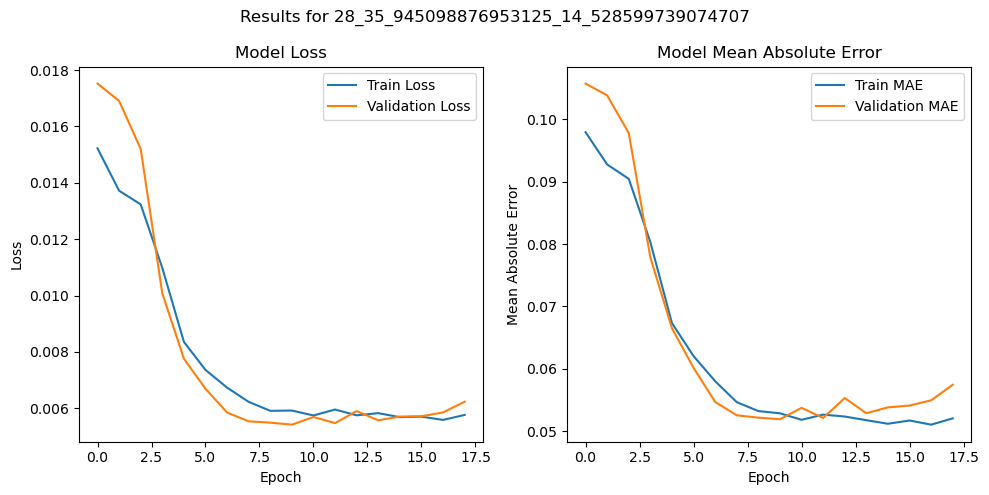

16/16 [==============================] - 15s 824ms/step

Test set Evaluation metrics for file: 28_35_945098876953125_14_528599739074707
Mean Squared Error (MSE): 0.0035302294886927024
Mean Absolute Error (MAE): 0.04477136468151077
Root Mean Squared Error (RMSE): 0.05941573435288587



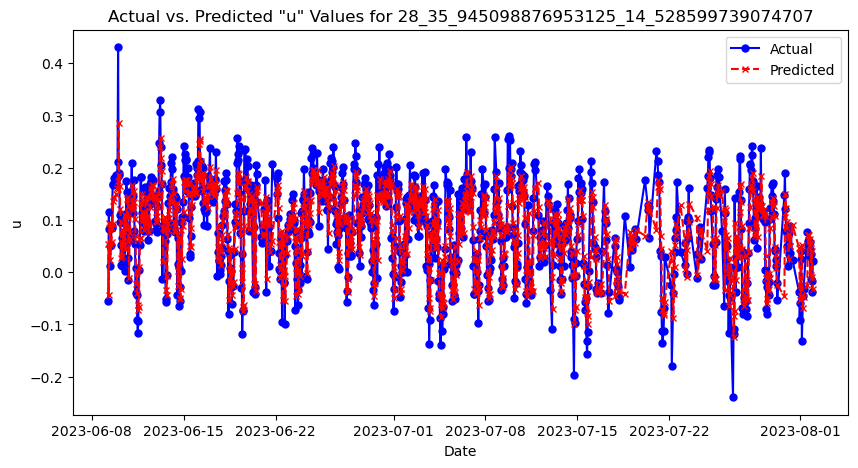

Model tarining & evaluation completed for file: 28_35_945098876953125_14_528599739074707.csv

Processing file: 29_36_03409957885742_14_406900405883789.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
98/98 [==============================] - ETA: 0s - loss: 0.0156 - mean_absolute_error: 0.0940INFO:tensorflow:Assets written to: Data/saved_models/models_u\29_36_03409957885742_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\29_36_03409957885742_14_406900405883789\assets


98/98 [==============================] - 211s 2s/step - loss: 0.0156 - mean_absolute_error: 0.0940 - val_loss: 0.0116 - val_mean_absolute_error: 0.0876
Epoch 2/100
98/98 [==============================] - ETA: 0s - loss: 0.0142 - mean_absolute_error: 0.0887INFO:tensorflow:Assets written to: Data/saved_models/models_u\29_36_03409957885742_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\29_36_03409957885742_14_406900405883789\assets


98/98 [==============================] - 200s 2s/step - loss: 0.0142 - mean_absolute_error: 0.0887 - val_loss: 0.0083 - val_mean_absolute_error: 0.0740
Epoch 3/100
98/98 [==============================] - 192s 2s/step - loss: 0.0134 - mean_absolute_error: 0.0868 - val_loss: 0.0092 - val_mean_absolute_error: 0.0780
Epoch 4/100
98/98 [==============================] - ETA: 0s - loss: 0.0126 - mean_absolute_error: 0.0830INFO:tensorflow:Assets written to: Data/saved_models/models_u\29_36_03409957885742_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\29_36_03409957885742_14_406900405883789\assets


98/98 [==============================] - 200s 2s/step - loss: 0.0126 - mean_absolute_error: 0.0830 - val_loss: 0.0069 - val_mean_absolute_error: 0.0669
Epoch 5/100
98/98 [==============================] - ETA: 0s - loss: 0.0117 - mean_absolute_error: 0.0795INFO:tensorflow:Assets written to: Data/saved_models/models_u\29_36_03409957885742_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\29_36_03409957885742_14_406900405883789\assets


98/98 [==============================] - 203s 2s/step - loss: 0.0117 - mean_absolute_error: 0.0795 - val_loss: 0.0056 - val_mean_absolute_error: 0.0603
Epoch 6/100
98/98 [==============================] - ETA: 0s - loss: 0.0104 - mean_absolute_error: 0.0730INFO:tensorflow:Assets written to: Data/saved_models/models_u\29_36_03409957885742_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\29_36_03409957885742_14_406900405883789\assets


98/98 [==============================] - 203s 2s/step - loss: 0.0104 - mean_absolute_error: 0.0730 - val_loss: 0.0041 - val_mean_absolute_error: 0.0512
Epoch 7/100
98/98 [==============================] - ETA: 0s - loss: 0.0087 - mean_absolute_error: 0.0652INFO:tensorflow:Assets written to: Data/saved_models/models_u\29_36_03409957885742_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\29_36_03409957885742_14_406900405883789\assets


98/98 [==============================] - 197s 2s/step - loss: 0.0087 - mean_absolute_error: 0.0652 - val_loss: 0.0031 - val_mean_absolute_error: 0.0437
Epoch 8/100
98/98 [==============================] - ETA: 0s - loss: 0.0075 - mean_absolute_error: 0.0591INFO:tensorflow:Assets written to: Data/saved_models/models_u\29_36_03409957885742_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\29_36_03409957885742_14_406900405883789\assets


98/98 [==============================] - 199s 2s/step - loss: 0.0075 - mean_absolute_error: 0.0591 - val_loss: 0.0025 - val_mean_absolute_error: 0.0389
Epoch 9/100
98/98 [==============================] - ETA: 0s - loss: 0.0070 - mean_absolute_error: 0.0560INFO:tensorflow:Assets written to: Data/saved_models/models_u\29_36_03409957885742_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\29_36_03409957885742_14_406900405883789\assets


98/98 [==============================] - 196s 2s/step - loss: 0.0070 - mean_absolute_error: 0.0560 - val_loss: 0.0025 - val_mean_absolute_error: 0.0391
Epoch 10/100
98/98 [==============================] - ETA: 0s - loss: 0.0068 - mean_absolute_error: 0.0544INFO:tensorflow:Assets written to: Data/saved_models/models_u\29_36_03409957885742_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\29_36_03409957885742_14_406900405883789\assets


98/98 [==============================] - 197s 2s/step - loss: 0.0068 - mean_absolute_error: 0.0544 - val_loss: 0.0023 - val_mean_absolute_error: 0.0380
Epoch 11/100
98/98 [==============================] - 187s 2s/step - loss: 0.0065 - mean_absolute_error: 0.0526 - val_loss: 0.0023 - val_mean_absolute_error: 0.0382
Epoch 12/100
98/98 [==============================] - ETA: 0s - loss: 0.0063 - mean_absolute_error: 0.0516INFO:tensorflow:Assets written to: Data/saved_models/models_u\29_36_03409957885742_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\29_36_03409957885742_14_406900405883789\assets


98/98 [==============================] - 199s 2s/step - loss: 0.0063 - mean_absolute_error: 0.0516 - val_loss: 0.0021 - val_mean_absolute_error: 0.0357
Epoch 13/100
98/98 [==============================] - 190s 2s/step - loss: 0.0064 - mean_absolute_error: 0.0523 - val_loss: 0.0024 - val_mean_absolute_error: 0.0380
Epoch 14/100
98/98 [==============================] - 191s 2s/step - loss: 0.0065 - mean_absolute_error: 0.0527 - val_loss: 0.0024 - val_mean_absolute_error: 0.0379
Epoch 15/100
98/98 [==============================] - 191s 2s/step - loss: 0.0063 - mean_absolute_error: 0.0520 - val_loss: 0.0022 - val_mean_absolute_error: 0.0373
Epoch 16/100
98/98 [==============================] - 192s 2s/step - loss: 0.0064 - mean_absolute_error: 0.0527 - val_loss: 0.0023 - val_mean_absolute_error: 0.0371
Epoch 17/100
98/98 [==============================] - 190s 2s/step - loss: 0.0062 - mean_absolute_error: 0.0515 - val_loss: 0.0022 - val_mean_absolute_error: 0.0365
Epoch 18/100
98/98 [===

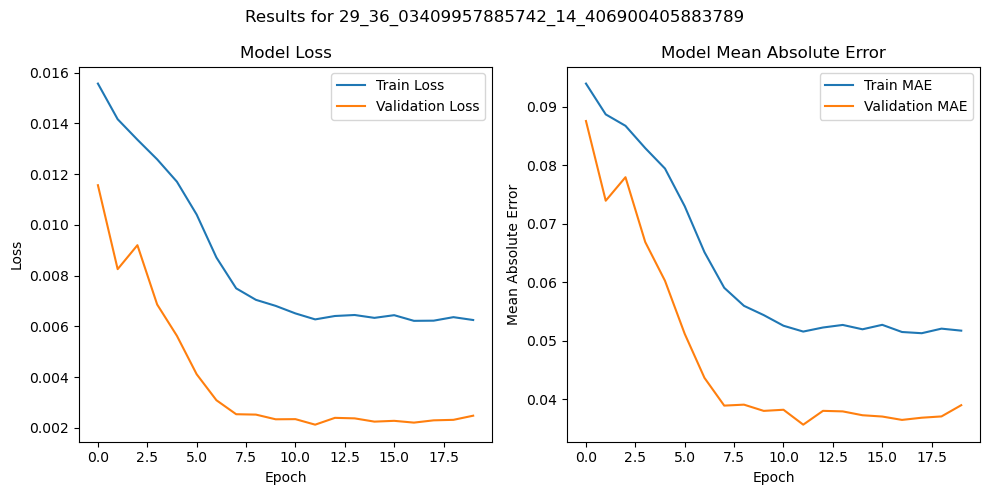

20/20 [==============================] - 18s 822ms/step

Test set Evaluation metrics for file: 29_36_03409957885742_14_406900405883789
Mean Squared Error (MSE): 0.0037242510908699726
Mean Absolute Error (MAE): 0.04789090087043459
Root Mean Squared Error (RMSE): 0.06102664246761387



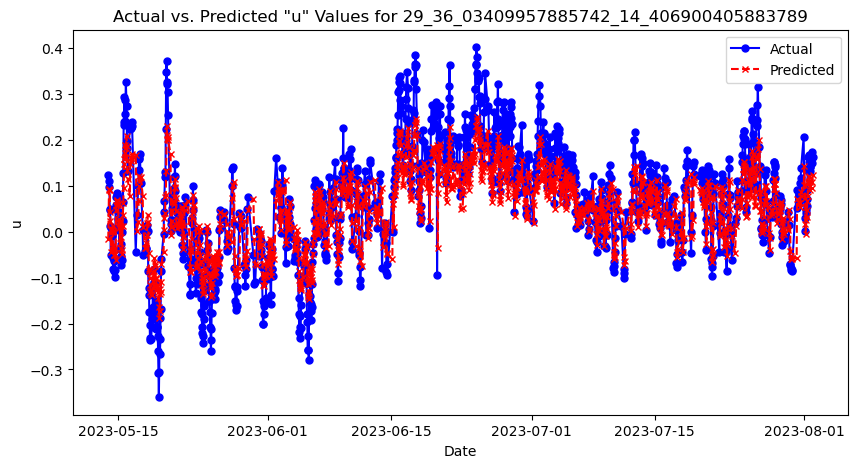

Model tarining & evaluation completed for file: 29_36_03409957885742_14_406900405883789.csv

Processing file: 30_36_056400299072266_14_406900405883789.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
102/102 [==============================] - ETA: 0s - loss: 0.0166 - mean_absolute_error: 0.0975INFO:tensorflow:Assets written to: Data/saved_models/models_u\30_36_056400299072266_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\30_36_056400299072266_14_406900405883789\assets


102/102 [==============================] - 214s 2s/step - loss: 0.0166 - mean_absolute_error: 0.0975 - val_loss: 0.0108 - val_mean_absolute_error: 0.0844
Epoch 2/100
102/102 [==============================] - ETA: 0s - loss: 0.0164 - mean_absolute_error: 0.0960INFO:tensorflow:Assets written to: Data/saved_models/models_u\30_36_056400299072266_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\30_36_056400299072266_14_406900405883789\assets


102/102 [==============================] - 203s 2s/step - loss: 0.0164 - mean_absolute_error: 0.0960 - val_loss: 0.0102 - val_mean_absolute_error: 0.0820
Epoch 3/100
102/102 [==============================] - ETA: 0s - loss: 0.0152 - mean_absolute_error: 0.0926INFO:tensorflow:Assets written to: Data/saved_models/models_u\30_36_056400299072266_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\30_36_056400299072266_14_406900405883789\assets


102/102 [==============================] - 206s 2s/step - loss: 0.0152 - mean_absolute_error: 0.0926 - val_loss: 0.0087 - val_mean_absolute_error: 0.0755
Epoch 4/100
102/102 [==============================] - ETA: 0s - loss: 0.0143 - mean_absolute_error: 0.0880INFO:tensorflow:Assets written to: Data/saved_models/models_u\30_36_056400299072266_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\30_36_056400299072266_14_406900405883789\assets


102/102 [==============================] - 203s 2s/step - loss: 0.0143 - mean_absolute_error: 0.0880 - val_loss: 0.0058 - val_mean_absolute_error: 0.0610
Epoch 5/100
102/102 [==============================] - ETA: 0s - loss: 0.0122 - mean_absolute_error: 0.0809INFO:tensorflow:Assets written to: Data/saved_models/models_u\30_36_056400299072266_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\30_36_056400299072266_14_406900405883789\assets


102/102 [==============================] - 205s 2s/step - loss: 0.0122 - mean_absolute_error: 0.0809 - val_loss: 0.0052 - val_mean_absolute_error: 0.0577
Epoch 6/100
102/102 [==============================] - ETA: 0s - loss: 0.0106 - mean_absolute_error: 0.0736INFO:tensorflow:Assets written to: Data/saved_models/models_u\30_36_056400299072266_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\30_36_056400299072266_14_406900405883789\assets


102/102 [==============================] - 202s 2s/step - loss: 0.0106 - mean_absolute_error: 0.0736 - val_loss: 0.0037 - val_mean_absolute_error: 0.0485
Epoch 7/100
102/102 [==============================] - ETA: 0s - loss: 0.0091 - mean_absolute_error: 0.0671INFO:tensorflow:Assets written to: Data/saved_models/models_u\30_36_056400299072266_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\30_36_056400299072266_14_406900405883789\assets


102/102 [==============================] - 203s 2s/step - loss: 0.0091 - mean_absolute_error: 0.0671 - val_loss: 0.0031 - val_mean_absolute_error: 0.0440
Epoch 8/100
102/102 [==============================] - 189s 2s/step - loss: 0.0079 - mean_absolute_error: 0.0615 - val_loss: 0.0032 - val_mean_absolute_error: 0.0435
Epoch 9/100
102/102 [==============================] - ETA: 0s - loss: 0.0073 - mean_absolute_error: 0.0578INFO:tensorflow:Assets written to: Data/saved_models/models_u\30_36_056400299072266_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\30_36_056400299072266_14_406900405883789\assets


102/102 [==============================] - 201s 2s/step - loss: 0.0073 - mean_absolute_error: 0.0578 - val_loss: 0.0026 - val_mean_absolute_error: 0.0395
Epoch 10/100
102/102 [==============================] - ETA: 0s - loss: 0.0069 - mean_absolute_error: 0.0550INFO:tensorflow:Assets written to: Data/saved_models/models_u\30_36_056400299072266_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\30_36_056400299072266_14_406900405883789\assets


102/102 [==============================] - 214s 2s/step - loss: 0.0069 - mean_absolute_error: 0.0550 - val_loss: 0.0023 - val_mean_absolute_error: 0.0371
Epoch 11/100
102/102 [==============================] - 201s 2s/step - loss: 0.0069 - mean_absolute_error: 0.0547 - val_loss: 0.0025 - val_mean_absolute_error: 0.0386
Epoch 12/100
102/102 [==============================] - 199s 2s/step - loss: 0.0069 - mean_absolute_error: 0.0546 - val_loss: 0.0025 - val_mean_absolute_error: 0.0384
Epoch 13/100
102/102 [==============================] - 198s 2s/step - loss: 0.0069 - mean_absolute_error: 0.0550 - val_loss: 0.0024 - val_mean_absolute_error: 0.0372
Epoch 14/100
102/102 [==============================] - 201s 2s/step - loss: 0.0068 - mean_absolute_error: 0.0547 - val_loss: 0.0026 - val_mean_absolute_error: 0.0390
Epoch 15/100
102/102 [==============================] - 199s 2s/step - loss: 0.0070 - mean_absolute_error: 0.0558 - val_loss: 0.0025 - val_mean_absolute_error: 0.0391
Epoch 16/10

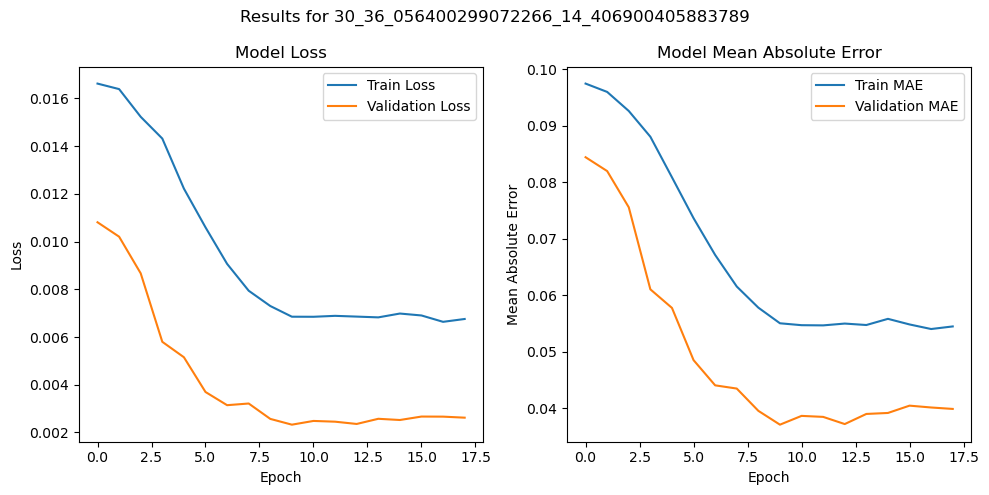

21/21 [==============================] - 19s 834ms/step

Test set Evaluation metrics for file: 30_36_056400299072266_14_406900405883789
Mean Squared Error (MSE): 0.0044463460385689695
Mean Absolute Error (MAE): 0.052476492016108545
Root Mean Squared Error (RMSE): 0.06668092709740146



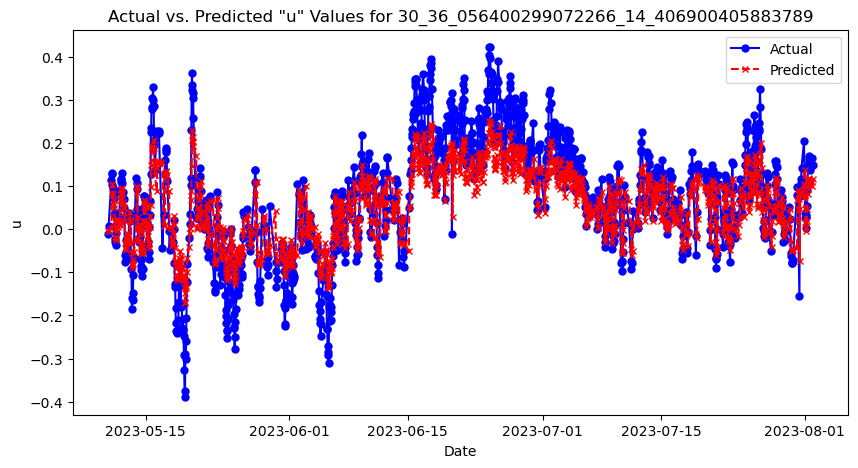

Model tarining & evaluation completed for file: 30_36_056400299072266_14_406900405883789.csv

Processing file: 31_36_01190185546875_14_406900405883789.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
66/66 [==============================] - ETA: 0s - loss: 0.0147 - mean_absolute_error: 0.0928INFO:tensorflow:Assets written to: Data/saved_models/models_u\31_36_01190185546875_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\31_36_01190185546875_14_406900405883789\assets


66/66 [==============================] - 146s 2s/step - loss: 0.0147 - mean_absolute_error: 0.0928 - val_loss: 0.0153 - val_mean_absolute_error: 0.1011
Epoch 2/100
66/66 [==============================] - ETA: 0s - loss: 0.0135 - mean_absolute_error: 0.0879INFO:tensorflow:Assets written to: Data/saved_models/models_u\31_36_01190185546875_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\31_36_01190185546875_14_406900405883789\assets


66/66 [==============================] - 138s 2s/step - loss: 0.0135 - mean_absolute_error: 0.0879 - val_loss: 0.0121 - val_mean_absolute_error: 0.0892
Epoch 3/100
66/66 [==============================] - 135s 2s/step - loss: 0.0130 - mean_absolute_error: 0.0863 - val_loss: 0.0144 - val_mean_absolute_error: 0.0984
Epoch 4/100
66/66 [==============================] - ETA: 0s - loss: 0.0127 - mean_absolute_error: 0.0854INFO:tensorflow:Assets written to: Data/saved_models/models_u\31_36_01190185546875_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\31_36_01190185546875_14_406900405883789\assets


66/66 [==============================] - 147s 2s/step - loss: 0.0127 - mean_absolute_error: 0.0854 - val_loss: 0.0116 - val_mean_absolute_error: 0.0875
Epoch 5/100
66/66 [==============================] - ETA: 0s - loss: 0.0117 - mean_absolute_error: 0.0810INFO:tensorflow:Assets written to: Data/saved_models/models_u\31_36_01190185546875_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\31_36_01190185546875_14_406900405883789\assets


66/66 [==============================] - 142s 2s/step - loss: 0.0117 - mean_absolute_error: 0.0810 - val_loss: 0.0088 - val_mean_absolute_error: 0.0754
Epoch 6/100
66/66 [==============================] - ETA: 0s - loss: 0.0112 - mean_absolute_error: 0.0793INFO:tensorflow:Assets written to: Data/saved_models/models_u\31_36_01190185546875_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\31_36_01190185546875_14_406900405883789\assets


66/66 [==============================] - 143s 2s/step - loss: 0.0112 - mean_absolute_error: 0.0793 - val_loss: 0.0083 - val_mean_absolute_error: 0.0728
Epoch 7/100
66/66 [==============================] - ETA: 0s - loss: 0.0108 - mean_absolute_error: 0.0778INFO:tensorflow:Assets written to: Data/saved_models/models_u\31_36_01190185546875_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\31_36_01190185546875_14_406900405883789\assets


66/66 [==============================] - 142s 2s/step - loss: 0.0108 - mean_absolute_error: 0.0778 - val_loss: 0.0076 - val_mean_absolute_error: 0.0693
Epoch 8/100
66/66 [==============================] - ETA: 0s - loss: 0.0103 - mean_absolute_error: 0.0754INFO:tensorflow:Assets written to: Data/saved_models/models_u\31_36_01190185546875_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\31_36_01190185546875_14_406900405883789\assets


66/66 [==============================] - 147s 2s/step - loss: 0.0103 - mean_absolute_error: 0.0754 - val_loss: 0.0068 - val_mean_absolute_error: 0.0653
Epoch 9/100
66/66 [==============================] - ETA: 0s - loss: 0.0097 - mean_absolute_error: 0.0720INFO:tensorflow:Assets written to: Data/saved_models/models_u\31_36_01190185546875_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\31_36_01190185546875_14_406900405883789\assets


66/66 [==============================] - 143s 2s/step - loss: 0.0097 - mean_absolute_error: 0.0720 - val_loss: 0.0061 - val_mean_absolute_error: 0.0616
Epoch 10/100
66/66 [==============================] - ETA: 0s - loss: 0.0091 - mean_absolute_error: 0.0691INFO:tensorflow:Assets written to: Data/saved_models/models_u\31_36_01190185546875_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\31_36_01190185546875_14_406900405883789\assets


66/66 [==============================] - 142s 2s/step - loss: 0.0091 - mean_absolute_error: 0.0691 - val_loss: 0.0053 - val_mean_absolute_error: 0.0576
Epoch 11/100
66/66 [==============================] - ETA: 0s - loss: 0.0080 - mean_absolute_error: 0.0635INFO:tensorflow:Assets written to: Data/saved_models/models_u\31_36_01190185546875_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\31_36_01190185546875_14_406900405883789\assets


66/66 [==============================] - 141s 2s/step - loss: 0.0080 - mean_absolute_error: 0.0635 - val_loss: 0.0041 - val_mean_absolute_error: 0.0502
Epoch 12/100
66/66 [==============================] - ETA: 0s - loss: 0.0074 - mean_absolute_error: 0.0603INFO:tensorflow:Assets written to: Data/saved_models/models_u\31_36_01190185546875_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\31_36_01190185546875_14_406900405883789\assets


66/66 [==============================] - 142s 2s/step - loss: 0.0074 - mean_absolute_error: 0.0603 - val_loss: 0.0038 - val_mean_absolute_error: 0.0485
Epoch 13/100
66/66 [==============================] - ETA: 0s - loss: 0.0070 - mean_absolute_error: 0.0578INFO:tensorflow:Assets written to: Data/saved_models/models_u\31_36_01190185546875_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\31_36_01190185546875_14_406900405883789\assets


66/66 [==============================] - 144s 2s/step - loss: 0.0070 - mean_absolute_error: 0.0578 - val_loss: 0.0036 - val_mean_absolute_error: 0.0463
Epoch 14/100
66/66 [==============================] - 133s 2s/step - loss: 0.0070 - mean_absolute_error: 0.0570 - val_loss: 0.0037 - val_mean_absolute_error: 0.0470
Epoch 15/100
66/66 [==============================] - ETA: 0s - loss: 0.0069 - mean_absolute_error: 0.0566INFO:tensorflow:Assets written to: Data/saved_models/models_u\31_36_01190185546875_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\31_36_01190185546875_14_406900405883789\assets


66/66 [==============================] - 142s 2s/step - loss: 0.0069 - mean_absolute_error: 0.0566 - val_loss: 0.0036 - val_mean_absolute_error: 0.0462
Epoch 16/100
66/66 [==============================] - ETA: 0s - loss: 0.0069 - mean_absolute_error: 0.0571INFO:tensorflow:Assets written to: Data/saved_models/models_u\31_36_01190185546875_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\31_36_01190185546875_14_406900405883789\assets


66/66 [==============================] - 143s 2s/step - loss: 0.0069 - mean_absolute_error: 0.0571 - val_loss: 0.0035 - val_mean_absolute_error: 0.0451
Epoch 17/100
66/66 [==============================] - 131s 2s/step - loss: 0.0065 - mean_absolute_error: 0.0551 - val_loss: 0.0037 - val_mean_absolute_error: 0.0466
Epoch 18/100
66/66 [==============================] - 130s 2s/step - loss: 0.0069 - mean_absolute_error: 0.0565 - val_loss: 0.0036 - val_mean_absolute_error: 0.0461
Epoch 19/100
66/66 [==============================] - 130s 2s/step - loss: 0.0067 - mean_absolute_error: 0.0559 - val_loss: 0.0035 - val_mean_absolute_error: 0.0455
Epoch 20/100
66/66 [==============================] - 131s 2s/step - loss: 0.0067 - mean_absolute_error: 0.0561 - val_loss: 0.0037 - val_mean_absolute_error: 0.0470
Epoch 21/100
66/66 [==============================] - 131s 2s/step - loss: 0.0066 - mean_absolute_error: 0.0551 - val_loss: 0.0036 - val_mean_absolute_error: 0.0460
Epoch 22/100
66/66 [===

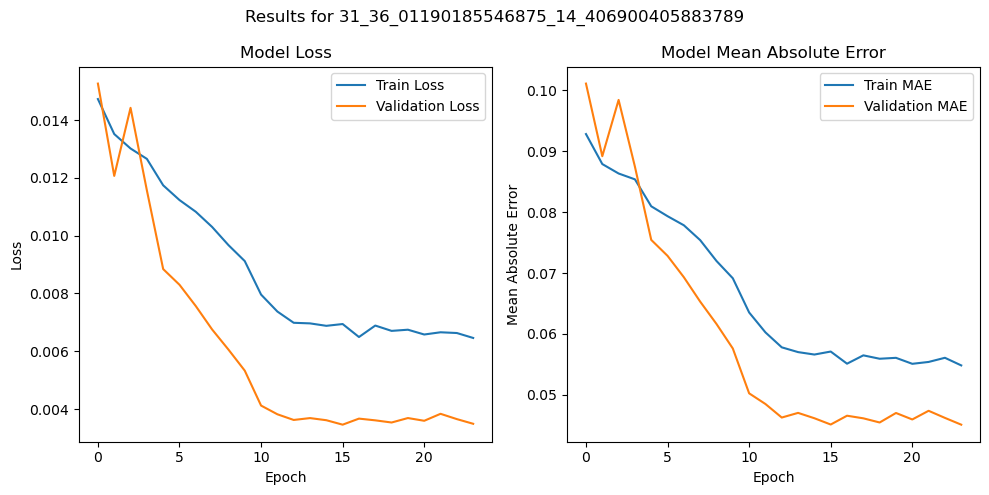

14/14 [==============================] - 13s 794ms/step

Test set Evaluation metrics for file: 31_36_01190185546875_14_406900405883789
Mean Squared Error (MSE): 0.003824430286011454
Mean Absolute Error (MAE): 0.04790554797489778
Root Mean Squared Error (RMSE): 0.06184197834813707



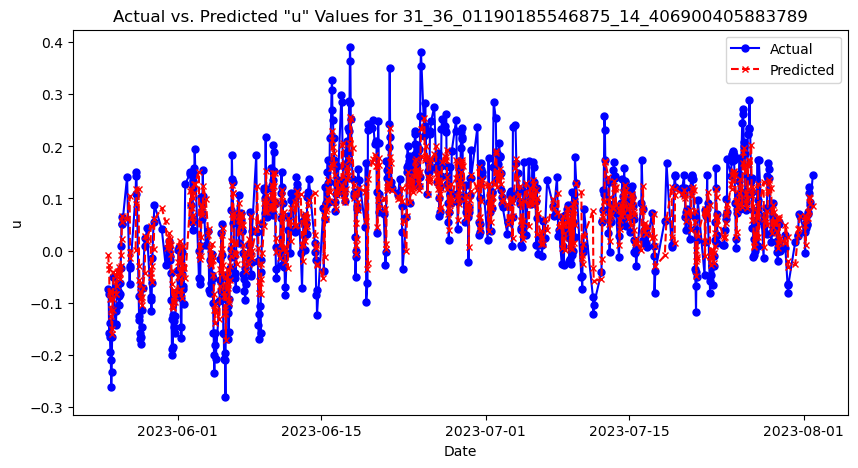

Model tarining & evaluation completed for file: 31_36_01190185546875_14_406900405883789.csv

Processing file: 32_36_03409957885742_14_366399765014648.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
67/67 [==============================] - ETA: 0s - loss: 0.0132 - mean_absolute_error: 0.0877INFO:tensorflow:Assets written to: Data/saved_models/models_u\32_36_03409957885742_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\32_36_03409957885742_14_366399765014648\assets


67/67 [==============================] - 152s 2s/step - loss: 0.0132 - mean_absolute_error: 0.0877 - val_loss: 0.0137 - val_mean_absolute_error: 0.0976
Epoch 2/100
67/67 [==============================] - 131s 2s/step - loss: 0.0127 - mean_absolute_error: 0.0850 - val_loss: 0.0146 - val_mean_absolute_error: 0.1013
Epoch 3/100
67/67 [==============================] - ETA: 0s - loss: 0.0121 - mean_absolute_error: 0.0824INFO:tensorflow:Assets written to: Data/saved_models/models_u\32_36_03409957885742_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\32_36_03409957885742_14_366399765014648\assets


67/67 [==============================] - 143s 2s/step - loss: 0.0121 - mean_absolute_error: 0.0824 - val_loss: 0.0130 - val_mean_absolute_error: 0.0948
Epoch 4/100
67/67 [==============================] - ETA: 0s - loss: 0.0116 - mean_absolute_error: 0.0803INFO:tensorflow:Assets written to: Data/saved_models/models_u\32_36_03409957885742_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\32_36_03409957885742_14_366399765014648\assets


67/67 [==============================] - 142s 2s/step - loss: 0.0116 - mean_absolute_error: 0.0803 - val_loss: 0.0119 - val_mean_absolute_error: 0.0899
Epoch 5/100
67/67 [==============================] - ETA: 0s - loss: 0.0115 - mean_absolute_error: 0.0808INFO:tensorflow:Assets written to: Data/saved_models/models_u\32_36_03409957885742_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\32_36_03409957885742_14_366399765014648\assets


67/67 [==============================] - 143s 2s/step - loss: 0.0115 - mean_absolute_error: 0.0808 - val_loss: 0.0110 - val_mean_absolute_error: 0.0860
Epoch 6/100
67/67 [==============================] - ETA: 0s - loss: 0.0107 - mean_absolute_error: 0.0765INFO:tensorflow:Assets written to: Data/saved_models/models_u\32_36_03409957885742_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\32_36_03409957885742_14_366399765014648\assets


67/67 [==============================] - 147s 2s/step - loss: 0.0107 - mean_absolute_error: 0.0765 - val_loss: 0.0096 - val_mean_absolute_error: 0.0792
Epoch 7/100
67/67 [==============================] - ETA: 0s - loss: 0.0100 - mean_absolute_error: 0.0738INFO:tensorflow:Assets written to: Data/saved_models/models_u\32_36_03409957885742_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\32_36_03409957885742_14_366399765014648\assets


67/67 [==============================] - 142s 2s/step - loss: 0.0100 - mean_absolute_error: 0.0738 - val_loss: 0.0084 - val_mean_absolute_error: 0.0736
Epoch 8/100
67/67 [==============================] - ETA: 0s - loss: 0.0094 - mean_absolute_error: 0.0716INFO:tensorflow:Assets written to: Data/saved_models/models_u\32_36_03409957885742_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\32_36_03409957885742_14_366399765014648\assets


67/67 [==============================] - 142s 2s/step - loss: 0.0094 - mean_absolute_error: 0.0716 - val_loss: 0.0071 - val_mean_absolute_error: 0.0668
Epoch 9/100
67/67 [==============================] - ETA: 0s - loss: 0.0087 - mean_absolute_error: 0.0674INFO:tensorflow:Assets written to: Data/saved_models/models_u\32_36_03409957885742_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\32_36_03409957885742_14_366399765014648\assets


67/67 [==============================] - 148s 2s/step - loss: 0.0087 - mean_absolute_error: 0.0674 - val_loss: 0.0065 - val_mean_absolute_error: 0.0641
Epoch 10/100
67/67 [==============================] - ETA: 0s - loss: 0.0081 - mean_absolute_error: 0.0640INFO:tensorflow:Assets written to: Data/saved_models/models_u\32_36_03409957885742_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\32_36_03409957885742_14_366399765014648\assets


67/67 [==============================] - 156s 2s/step - loss: 0.0081 - mean_absolute_error: 0.0640 - val_loss: 0.0048 - val_mean_absolute_error: 0.0539
Epoch 11/100
67/67 [==============================] - ETA: 0s - loss: 0.0072 - mean_absolute_error: 0.0594INFO:tensorflow:Assets written to: Data/saved_models/models_u\32_36_03409957885742_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\32_36_03409957885742_14_366399765014648\assets


67/67 [==============================] - 148s 2s/step - loss: 0.0072 - mean_absolute_error: 0.0594 - val_loss: 0.0038 - val_mean_absolute_error: 0.0470
Epoch 12/100
67/67 [==============================] - 139s 2s/step - loss: 0.0068 - mean_absolute_error: 0.0570 - val_loss: 0.0038 - val_mean_absolute_error: 0.0479
Epoch 13/100
67/67 [==============================] - ETA: 0s - loss: 0.0066 - mean_absolute_error: 0.0559INFO:tensorflow:Assets written to: Data/saved_models/models_u\32_36_03409957885742_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\32_36_03409957885742_14_366399765014648\assets


67/67 [==============================] - 147s 2s/step - loss: 0.0066 - mean_absolute_error: 0.0559 - val_loss: 0.0034 - val_mean_absolute_error: 0.0440
Epoch 14/100
67/67 [==============================] - 136s 2s/step - loss: 0.0066 - mean_absolute_error: 0.0557 - val_loss: 0.0035 - val_mean_absolute_error: 0.0449
Epoch 15/100
67/67 [==============================] - 138s 2s/step - loss: 0.0066 - mean_absolute_error: 0.0554 - val_loss: 0.0034 - val_mean_absolute_error: 0.0437
Epoch 16/100
67/67 [==============================] - 137s 2s/step - loss: 0.0064 - mean_absolute_error: 0.0545 - val_loss: 0.0036 - val_mean_absolute_error: 0.0452
Epoch 17/100
67/67 [==============================] - ETA: 0s - loss: 0.0062 - mean_absolute_error: 0.0533INFO:tensorflow:Assets written to: Data/saved_models/models_u\32_36_03409957885742_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\32_36_03409957885742_14_366399765014648\assets


67/67 [==============================] - 149s 2s/step - loss: 0.0062 - mean_absolute_error: 0.0533 - val_loss: 0.0032 - val_mean_absolute_error: 0.0426
Epoch 18/100
67/67 [==============================] - 141s 2s/step - loss: 0.0064 - mean_absolute_error: 0.0541 - val_loss: 0.0033 - val_mean_absolute_error: 0.0431
Epoch 19/100
67/67 [==============================] - 142s 2s/step - loss: 0.0062 - mean_absolute_error: 0.0529 - val_loss: 0.0036 - val_mean_absolute_error: 0.0458
Epoch 20/100
67/67 [==============================] - 141s 2s/step - loss: 0.0064 - mean_absolute_error: 0.0536 - val_loss: 0.0035 - val_mean_absolute_error: 0.0453
Epoch 21/100
67/67 [==============================] - 142s 2s/step - loss: 0.0064 - mean_absolute_error: 0.0543 - val_loss: 0.0039 - val_mean_absolute_error: 0.0480
Epoch 22/100
67/67 [==============================] - 142s 2s/step - loss: 0.0065 - mean_absolute_error: 0.0545 - val_loss: 0.0040 - val_mean_absolute_error: 0.0477
Epoch 23/100
67/67 [===

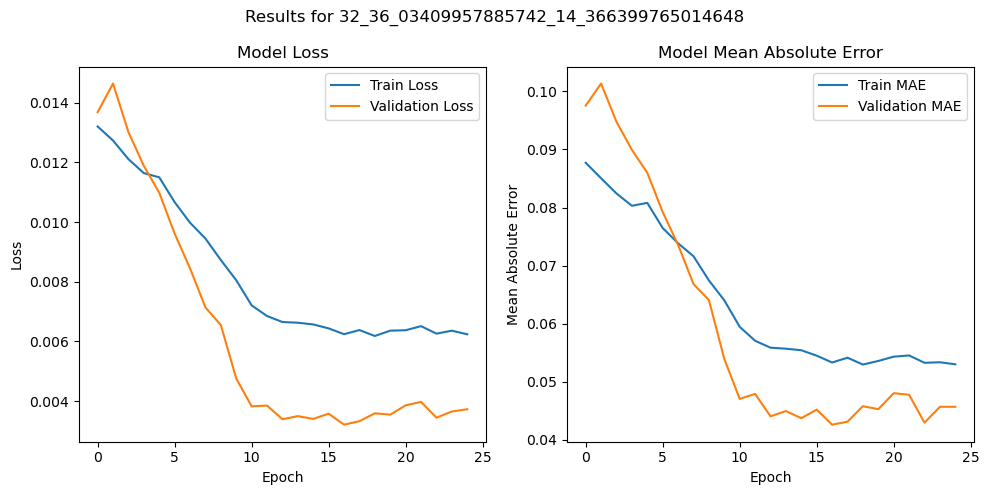

14/14 [==============================] - 14s 876ms/step

Test set Evaluation metrics for file: 32_36_03409957885742_14_366399765014648
Mean Squared Error (MSE): 0.0028901848783262196
Mean Absolute Error (MAE): 0.04271904203473386
Root Mean Squared Error (RMSE): 0.05376043971477744



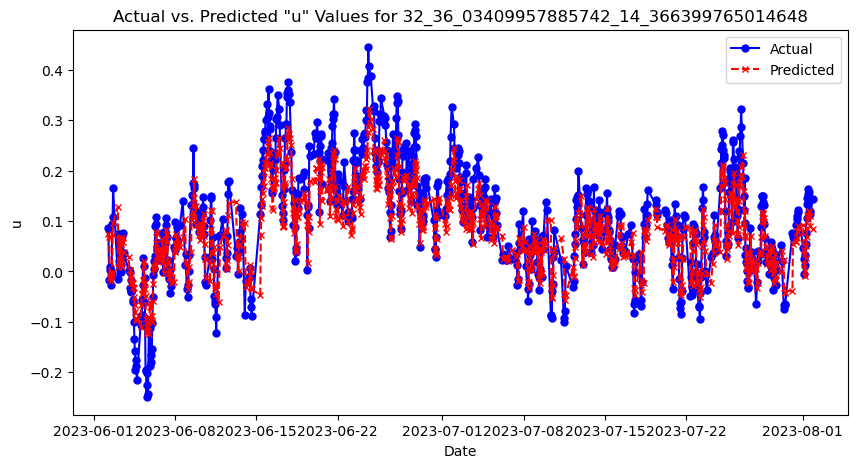

Model tarining & evaluation completed for file: 32_36_03409957885742_14_366399765014648.csv

Processing file: 33_36_056400299072266_14_366399765014648.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
69/69 [==============================] - ETA: 0s - loss: 0.0139 - mean_absolute_error: 0.0909INFO:tensorflow:Assets written to: Data/saved_models/models_u\33_36_056400299072266_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\33_36_056400299072266_14_366399765014648\assets


69/69 [==============================] - 159s 2s/step - loss: 0.0139 - mean_absolute_error: 0.0909 - val_loss: 0.0154 - val_mean_absolute_error: 0.1034
Epoch 2/100
69/69 [==============================] - ETA: 0s - loss: 0.0139 - mean_absolute_error: 0.0895INFO:tensorflow:Assets written to: Data/saved_models/models_u\33_36_056400299072266_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\33_36_056400299072266_14_366399765014648\assets


69/69 [==============================] - 144s 2s/step - loss: 0.0139 - mean_absolute_error: 0.0895 - val_loss: 0.0142 - val_mean_absolute_error: 0.0987
Epoch 3/100
69/69 [==============================] - ETA: 0s - loss: 0.0127 - mean_absolute_error: 0.0848INFO:tensorflow:Assets written to: Data/saved_models/models_u\33_36_056400299072266_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\33_36_056400299072266_14_366399765014648\assets


69/69 [==============================] - 147s 2s/step - loss: 0.0127 - mean_absolute_error: 0.0848 - val_loss: 0.0120 - val_mean_absolute_error: 0.0899
Epoch 4/100
69/69 [==============================] - ETA: 0s - loss: 0.0112 - mean_absolute_error: 0.0792INFO:tensorflow:Assets written to: Data/saved_models/models_u\33_36_056400299072266_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\33_36_056400299072266_14_366399765014648\assets


69/69 [==============================] - 149s 2s/step - loss: 0.0112 - mean_absolute_error: 0.0792 - val_loss: 0.0098 - val_mean_absolute_error: 0.0797
Epoch 5/100
69/69 [==============================] - ETA: 0s - loss: 0.0105 - mean_absolute_error: 0.0769INFO:tensorflow:Assets written to: Data/saved_models/models_u\33_36_056400299072266_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\33_36_056400299072266_14_366399765014648\assets


69/69 [==============================] - 147s 2s/step - loss: 0.0105 - mean_absolute_error: 0.0769 - val_loss: 0.0088 - val_mean_absolute_error: 0.0750
Epoch 6/100
69/69 [==============================] - ETA: 0s - loss: 0.0097 - mean_absolute_error: 0.0731INFO:tensorflow:Assets written to: Data/saved_models/models_u\33_36_056400299072266_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\33_36_056400299072266_14_366399765014648\assets


69/69 [==============================] - 147s 2s/step - loss: 0.0097 - mean_absolute_error: 0.0731 - val_loss: 0.0073 - val_mean_absolute_error: 0.0672
Epoch 7/100
69/69 [==============================] - ETA: 0s - loss: 0.0088 - mean_absolute_error: 0.0686INFO:tensorflow:Assets written to: Data/saved_models/models_u\33_36_056400299072266_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\33_36_056400299072266_14_366399765014648\assets


69/69 [==============================] - 145s 2s/step - loss: 0.0088 - mean_absolute_error: 0.0686 - val_loss: 0.0060 - val_mean_absolute_error: 0.0608
Epoch 8/100
69/69 [==============================] - ETA: 0s - loss: 0.0082 - mean_absolute_error: 0.0654INFO:tensorflow:Assets written to: Data/saved_models/models_u\33_36_056400299072266_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\33_36_056400299072266_14_366399765014648\assets


69/69 [==============================] - 148s 2s/step - loss: 0.0082 - mean_absolute_error: 0.0654 - val_loss: 0.0051 - val_mean_absolute_error: 0.0552
Epoch 9/100
69/69 [==============================] - ETA: 0s - loss: 0.0073 - mean_absolute_error: 0.0615INFO:tensorflow:Assets written to: Data/saved_models/models_u\33_36_056400299072266_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\33_36_056400299072266_14_366399765014648\assets


69/69 [==============================] - 147s 2s/step - loss: 0.0073 - mean_absolute_error: 0.0615 - val_loss: 0.0042 - val_mean_absolute_error: 0.0500
Epoch 10/100
69/69 [==============================] - ETA: 0s - loss: 0.0065 - mean_absolute_error: 0.0571INFO:tensorflow:Assets written to: Data/saved_models/models_u\33_36_056400299072266_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\33_36_056400299072266_14_366399765014648\assets


69/69 [==============================] - 147s 2s/step - loss: 0.0065 - mean_absolute_error: 0.0571 - val_loss: 0.0034 - val_mean_absolute_error: 0.0445
Epoch 11/100
69/69 [==============================] - ETA: 0s - loss: 0.0060 - mean_absolute_error: 0.0542INFO:tensorflow:Assets written to: Data/saved_models/models_u\33_36_056400299072266_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\33_36_056400299072266_14_366399765014648\assets


69/69 [==============================] - 146s 2s/step - loss: 0.0060 - mean_absolute_error: 0.0542 - val_loss: 0.0031 - val_mean_absolute_error: 0.0420
Epoch 12/100
69/69 [==============================] - 136s 2s/step - loss: 0.0060 - mean_absolute_error: 0.0532 - val_loss: 0.0034 - val_mean_absolute_error: 0.0436
Epoch 13/100
69/69 [==============================] - 136s 2s/step - loss: 0.0057 - mean_absolute_error: 0.0514 - val_loss: 0.0034 - val_mean_absolute_error: 0.0439
Epoch 14/100
69/69 [==============================] - 136s 2s/step - loss: 0.0057 - mean_absolute_error: 0.0523 - val_loss: 0.0032 - val_mean_absolute_error: 0.0433
Epoch 15/100
69/69 [==============================] - 136s 2s/step - loss: 0.0057 - mean_absolute_error: 0.0516 - val_loss: 0.0034 - val_mean_absolute_error: 0.0448
Epoch 16/100
69/69 [==============================] - 136s 2s/step - loss: 0.0058 - mean_absolute_error: 0.0516 - val_loss: 0.0032 - val_mean_absolute_error: 0.0426
Epoch 17/100
69/69 [===

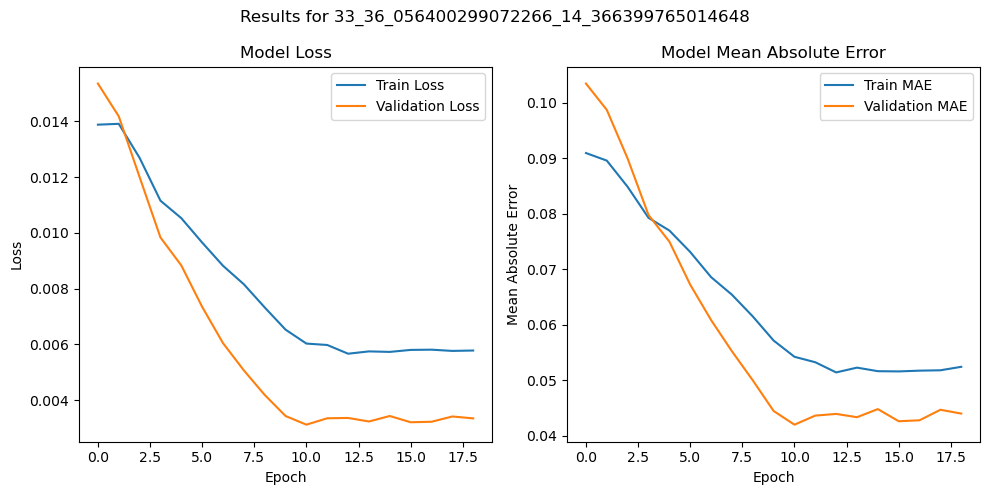

14/14 [==============================] - 13s 805ms/step

Test set Evaluation metrics for file: 33_36_056400299072266_14_366399765014648
Mean Squared Error (MSE): 0.0028636653736387745
Mean Absolute Error (MAE): 0.042337729863019966
Root Mean Squared Error (RMSE): 0.053513226156145496



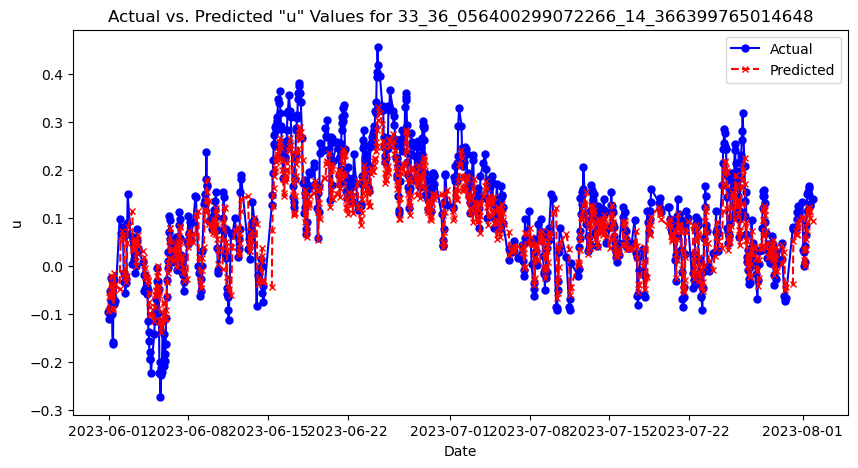

Model tarining & evaluation completed for file: 33_36_056400299072266_14_366399765014648.csv

Processing file: 34_35_96730041503906_14_48799991607666.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
56/56 [==============================] - ETA: 0s - loss: 0.0120 - mean_absolute_error: 0.0822INFO:tensorflow:Assets written to: Data/saved_models/models_u\34_35_96730041503906_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\34_35_96730041503906_14_48799991607666\assets


56/56 [==============================] - 133s 2s/step - loss: 0.0120 - mean_absolute_error: 0.0822 - val_loss: 0.0118 - val_mean_absolute_error: 0.0864
Epoch 2/100
56/56 [==============================] - 111s 2s/step - loss: 0.0106 - mean_absolute_error: 0.0784 - val_loss: 0.0120 - val_mean_absolute_error: 0.0868
Epoch 3/100
56/56 [==============================] - ETA: 0s - loss: 0.0101 - mean_absolute_error: 0.0759INFO:tensorflow:Assets written to: Data/saved_models/models_u\34_35_96730041503906_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\34_35_96730041503906_14_48799991607666\assets


56/56 [==============================] - 121s 2s/step - loss: 0.0101 - mean_absolute_error: 0.0759 - val_loss: 0.0118 - val_mean_absolute_error: 0.0851
Epoch 4/100
56/56 [==============================] - ETA: 0s - loss: 0.0096 - mean_absolute_error: 0.0744INFO:tensorflow:Assets written to: Data/saved_models/models_u\34_35_96730041503906_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\34_35_96730041503906_14_48799991607666\assets


56/56 [==============================] - 119s 2s/step - loss: 0.0096 - mean_absolute_error: 0.0744 - val_loss: 0.0118 - val_mean_absolute_error: 0.0855
Epoch 5/100
56/56 [==============================] - ETA: 0s - loss: 0.0089 - mean_absolute_error: 0.0709INFO:tensorflow:Assets written to: Data/saved_models/models_u\34_35_96730041503906_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\34_35_96730041503906_14_48799991607666\assets


56/56 [==============================] - 122s 2s/step - loss: 0.0089 - mean_absolute_error: 0.0709 - val_loss: 0.0111 - val_mean_absolute_error: 0.0830
Epoch 6/100
56/56 [==============================] - ETA: 0s - loss: 0.0085 - mean_absolute_error: 0.0691INFO:tensorflow:Assets written to: Data/saved_models/models_u\34_35_96730041503906_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\34_35_96730041503906_14_48799991607666\assets


56/56 [==============================] - 121s 2s/step - loss: 0.0085 - mean_absolute_error: 0.0691 - val_loss: 0.0107 - val_mean_absolute_error: 0.0813
Epoch 7/100
56/56 [==============================] - ETA: 0s - loss: 0.0074 - mean_absolute_error: 0.0628INFO:tensorflow:Assets written to: Data/saved_models/models_u\34_35_96730041503906_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\34_35_96730041503906_14_48799991607666\assets


56/56 [==============================] - 120s 2s/step - loss: 0.0074 - mean_absolute_error: 0.0628 - val_loss: 0.0082 - val_mean_absolute_error: 0.0708
Epoch 8/100
56/56 [==============================] - ETA: 0s - loss: 0.0065 - mean_absolute_error: 0.0581INFO:tensorflow:Assets written to: Data/saved_models/models_u\34_35_96730041503906_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\34_35_96730041503906_14_48799991607666\assets


56/56 [==============================] - 120s 2s/step - loss: 0.0065 - mean_absolute_error: 0.0581 - val_loss: 0.0074 - val_mean_absolute_error: 0.0671
Epoch 9/100
56/56 [==============================] - ETA: 0s - loss: 0.0058 - mean_absolute_error: 0.0541INFO:tensorflow:Assets written to: Data/saved_models/models_u\34_35_96730041503906_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\34_35_96730041503906_14_48799991607666\assets


56/56 [==============================] - 125s 2s/step - loss: 0.0058 - mean_absolute_error: 0.0541 - val_loss: 0.0072 - val_mean_absolute_error: 0.0648
Epoch 10/100
56/56 [==============================] - ETA: 0s - loss: 0.0052 - mean_absolute_error: 0.0503INFO:tensorflow:Assets written to: Data/saved_models/models_u\34_35_96730041503906_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\34_35_96730041503906_14_48799991607666\assets


56/56 [==============================] - 131s 2s/step - loss: 0.0052 - mean_absolute_error: 0.0503 - val_loss: 0.0064 - val_mean_absolute_error: 0.0610
Epoch 11/100
56/56 [==============================] - ETA: 0s - loss: 0.0047 - mean_absolute_error: 0.0477INFO:tensorflow:Assets written to: Data/saved_models/models_u\34_35_96730041503906_14_48799991607666\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\34_35_96730041503906_14_48799991607666\assets


56/56 [==============================] - 129s 2s/step - loss: 0.0047 - mean_absolute_error: 0.0477 - val_loss: 0.0060 - val_mean_absolute_error: 0.0592
Epoch 12/100
56/56 [==============================] - 118s 2s/step - loss: 0.0048 - mean_absolute_error: 0.0486 - val_loss: 0.0066 - val_mean_absolute_error: 0.0617
Epoch 13/100
56/56 [==============================] - 118s 2s/step - loss: 0.0046 - mean_absolute_error: 0.0469 - val_loss: 0.0063 - val_mean_absolute_error: 0.0601
Epoch 14/100
56/56 [==============================] - 118s 2s/step - loss: 0.0046 - mean_absolute_error: 0.0468 - val_loss: 0.0065 - val_mean_absolute_error: 0.0613
Epoch 15/100
56/56 [==============================] - 118s 2s/step - loss: 0.0045 - mean_absolute_error: 0.0465 - val_loss: 0.0068 - val_mean_absolute_error: 0.0620
Epoch 16/100
56/56 [==============================] - 118s 2s/step - loss: 0.0044 - mean_absolute_error: 0.0456 - val_loss: 0.0065 - val_mean_absolute_error: 0.0610
Epoch 17/100
56/56 [===

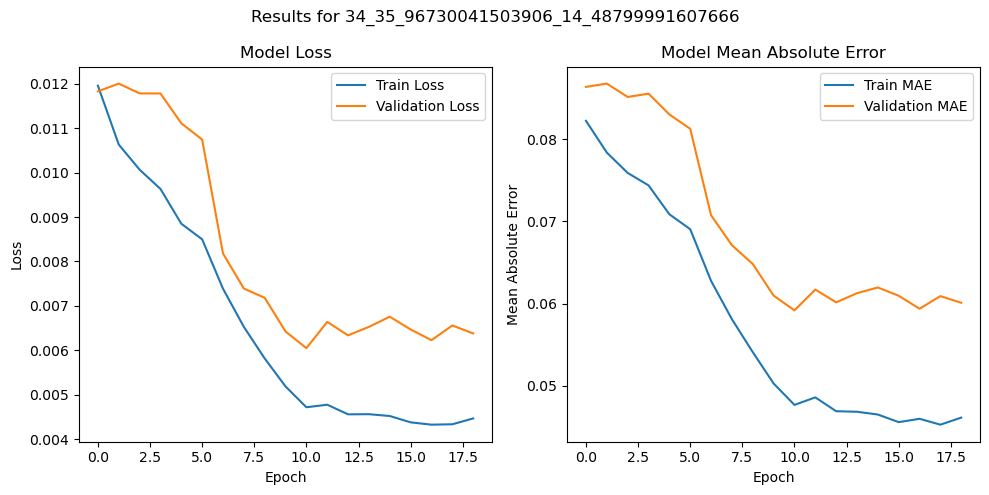

12/12 [==============================] - 12s 849ms/step

Test set Evaluation metrics for file: 34_35_96730041503906_14_48799991607666
Mean Squared Error (MSE): 0.004969760349847027
Mean Absolute Error (MAE): 0.053442640682755845
Root Mean Squared Error (RMSE): 0.0704965272183462



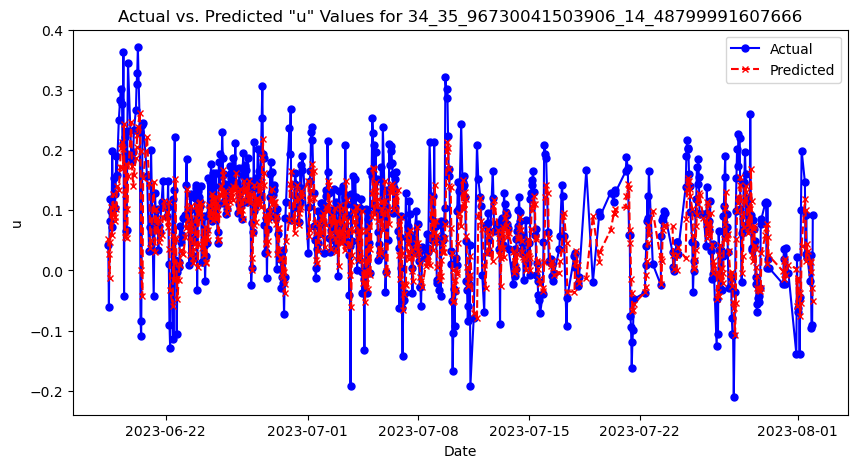

Model tarining & evaluation completed for file: 34_35_96730041503906_14_48799991607666.csv

Processing file: 35_35_989601135253906_14_406900405883789.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
27/27 [==============================] - ETA: 0s - loss: 0.0139 - mean_absolute_error: 0.0946INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


27/27 [==============================] - 72s 2s/step - loss: 0.0139 - mean_absolute_error: 0.0946 - val_loss: 0.0171 - val_mean_absolute_error: 0.1051
Epoch 2/100
27/27 [==============================] - ETA: 0s - loss: 0.0133 - mean_absolute_error: 0.0916INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


27/27 [==============================] - 63s 2s/step - loss: 0.0133 - mean_absolute_error: 0.0916 - val_loss: 0.0159 - val_mean_absolute_error: 0.1031
Epoch 3/100
27/27 [==============================] - 52s 2s/step - loss: 0.0139 - mean_absolute_error: 0.0931 - val_loss: 0.0162 - val_mean_absolute_error: 0.1031
Epoch 4/100
27/27 [==============================] - 52s 2s/step - loss: 0.0129 - mean_absolute_error: 0.0899 - val_loss: 0.0161 - val_mean_absolute_error: 0.1033
Epoch 5/100
27/27 [==============================] - ETA: 0s - loss: 0.0123 - mean_absolute_error: 0.0870INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


27/27 [==============================] - 65s 2s/step - loss: 0.0123 - mean_absolute_error: 0.0870 - val_loss: 0.0156 - val_mean_absolute_error: 0.1013
Epoch 6/100
27/27 [==============================] - ETA: 0s - loss: 0.0121 - mean_absolute_error: 0.0868INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


27/27 [==============================] - 63s 2s/step - loss: 0.0121 - mean_absolute_error: 0.0868 - val_loss: 0.0152 - val_mean_absolute_error: 0.0998
Epoch 7/100
27/27 [==============================] - ETA: 0s - loss: 0.0120 - mean_absolute_error: 0.0864INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


27/27 [==============================] - 64s 2s/step - loss: 0.0120 - mean_absolute_error: 0.0864 - val_loss: 0.0150 - val_mean_absolute_error: 0.0993
Epoch 8/100
27/27 [==============================] - ETA: 0s - loss: 0.0114 - mean_absolute_error: 0.0837INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


27/27 [==============================] - 63s 2s/step - loss: 0.0114 - mean_absolute_error: 0.0837 - val_loss: 0.0140 - val_mean_absolute_error: 0.0947
Epoch 9/100
27/27 [==============================] - 53s 2s/step - loss: 0.0112 - mean_absolute_error: 0.0830 - val_loss: 0.0144 - val_mean_absolute_error: 0.0959
Epoch 10/100
27/27 [==============================] - 53s 2s/step - loss: 0.0109 - mean_absolute_error: 0.0814 - val_loss: 0.0145 - val_mean_absolute_error: 0.0958
Epoch 11/100
27/27 [==============================] - ETA: 0s - loss: 0.0110 - mean_absolute_error: 0.0825INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


27/27 [==============================] - 65s 2s/step - loss: 0.0110 - mean_absolute_error: 0.0825 - val_loss: 0.0136 - val_mean_absolute_error: 0.0934
Epoch 12/100
27/27 [==============================] - ETA: 0s - loss: 0.0108 - mean_absolute_error: 0.0803INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


27/27 [==============================] - 64s 2s/step - loss: 0.0108 - mean_absolute_error: 0.0803 - val_loss: 0.0132 - val_mean_absolute_error: 0.0912
Epoch 13/100
27/27 [==============================] - ETA: 0s - loss: 0.0102 - mean_absolute_error: 0.0792INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


27/27 [==============================] - 63s 2s/step - loss: 0.0102 - mean_absolute_error: 0.0792 - val_loss: 0.0125 - val_mean_absolute_error: 0.0885
Epoch 14/100
27/27 [==============================] - ETA: 0s - loss: 0.0098 - mean_absolute_error: 0.0768INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


27/27 [==============================] - 63s 2s/step - loss: 0.0098 - mean_absolute_error: 0.0768 - val_loss: 0.0122 - val_mean_absolute_error: 0.0874
Epoch 15/100
27/27 [==============================] - ETA: 0s - loss: 0.0097 - mean_absolute_error: 0.0759INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


27/27 [==============================] - 63s 2s/step - loss: 0.0097 - mean_absolute_error: 0.0759 - val_loss: 0.0120 - val_mean_absolute_error: 0.0862
Epoch 16/100
27/27 [==============================] - ETA: 0s - loss: 0.0095 - mean_absolute_error: 0.0743INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


27/27 [==============================] - 67s 3s/step - loss: 0.0095 - mean_absolute_error: 0.0743 - val_loss: 0.0113 - val_mean_absolute_error: 0.0831
Epoch 17/100
27/27 [==============================] - ETA: 0s - loss: 0.0088 - mean_absolute_error: 0.0714INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


27/27 [==============================] - 65s 2s/step - loss: 0.0088 - mean_absolute_error: 0.0714 - val_loss: 0.0110 - val_mean_absolute_error: 0.0814
Epoch 18/100
27/27 [==============================] - ETA: 0s - loss: 0.0088 - mean_absolute_error: 0.0718INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


27/27 [==============================] - 66s 2s/step - loss: 0.0088 - mean_absolute_error: 0.0718 - val_loss: 0.0105 - val_mean_absolute_error: 0.0788
Epoch 19/100
27/27 [==============================] - ETA: 0s - loss: 0.0085 - mean_absolute_error: 0.0702INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


27/27 [==============================] - 64s 2s/step - loss: 0.0085 - mean_absolute_error: 0.0702 - val_loss: 0.0102 - val_mean_absolute_error: 0.0768
Epoch 20/100
27/27 [==============================] - ETA: 0s - loss: 0.0082 - mean_absolute_error: 0.0687INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


27/27 [==============================] - 67s 2s/step - loss: 0.0082 - mean_absolute_error: 0.0687 - val_loss: 0.0099 - val_mean_absolute_error: 0.0753
Epoch 21/100
27/27 [==============================] - ETA: 0s - loss: 0.0078 - mean_absolute_error: 0.0668INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


27/27 [==============================] - 65s 2s/step - loss: 0.0078 - mean_absolute_error: 0.0668 - val_loss: 0.0099 - val_mean_absolute_error: 0.0744
Epoch 22/100
27/27 [==============================] - ETA: 0s - loss: 0.0081 - mean_absolute_error: 0.0675INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


27/27 [==============================] - 65s 2s/step - loss: 0.0081 - mean_absolute_error: 0.0675 - val_loss: 0.0098 - val_mean_absolute_error: 0.0746
Epoch 23/100
27/27 [==============================] - ETA: 0s - loss: 0.0074 - mean_absolute_error: 0.0641INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


27/27 [==============================] - 65s 2s/step - loss: 0.0074 - mean_absolute_error: 0.0641 - val_loss: 0.0097 - val_mean_absolute_error: 0.0738
Epoch 24/100
27/27 [==============================] - ETA: 0s - loss: 0.0076 - mean_absolute_error: 0.0650INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


27/27 [==============================] - 66s 2s/step - loss: 0.0076 - mean_absolute_error: 0.0650 - val_loss: 0.0096 - val_mean_absolute_error: 0.0740
Epoch 25/100
27/27 [==============================] - 55s 2s/step - loss: 0.0075 - mean_absolute_error: 0.0644 - val_loss: 0.0096 - val_mean_absolute_error: 0.0738
Epoch 26/100
27/27 [==============================] - ETA: 0s - loss: 0.0077 - mean_absolute_error: 0.0649INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\35_35_989601135253906_14_406900405883789\assets


27/27 [==============================] - 66s 2s/step - loss: 0.0077 - mean_absolute_error: 0.0649 - val_loss: 0.0096 - val_mean_absolute_error: 0.0731
Epoch 27/100
27/27 [==============================] - 54s 2s/step - loss: 0.0073 - mean_absolute_error: 0.0631 - val_loss: 0.0096 - val_mean_absolute_error: 0.0732
Epoch 28/100
27/27 [==============================] - 54s 2s/step - loss: 0.0073 - mean_absolute_error: 0.0629 - val_loss: 0.0096 - val_mean_absolute_error: 0.0732
Epoch 29/100
27/27 [==============================] - 54s 2s/step - loss: 0.0074 - mean_absolute_error: 0.0630 - val_loss: 0.0096 - val_mean_absolute_error: 0.0731
Epoch 30/100
27/27 [==============================] - 54s 2s/step - loss: 0.0071 - mean_absolute_error: 0.0623 - val_loss: 0.0097 - val_mean_absolute_error: 0.0734
Epoch 31/100
27/27 [==============================] - 55s 2s/step - loss: 0.0074 - mean_absolute_error: 0.0636 - val_loss: 0.0096 - val_mean_absolute_error: 0.0731
Epoch 32/100
27/27 [=========

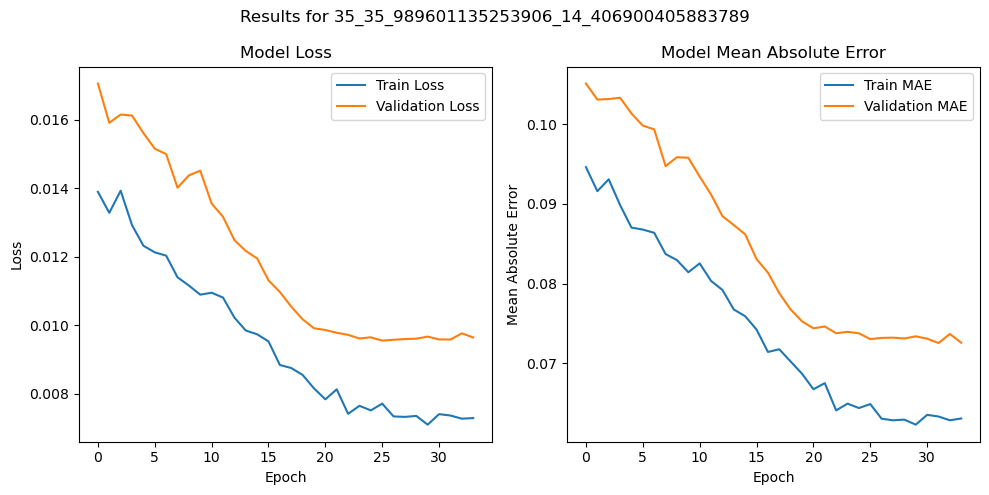

5/5 [==============================] - 6s 839ms/step

Test set Evaluation metrics for file: 35_35_989601135253906_14_406900405883789
Mean Squared Error (MSE): 0.0055288899176176584
Mean Absolute Error (MAE): 0.05335677626998071
Root Mean Squared Error (RMSE): 0.07435650555007045



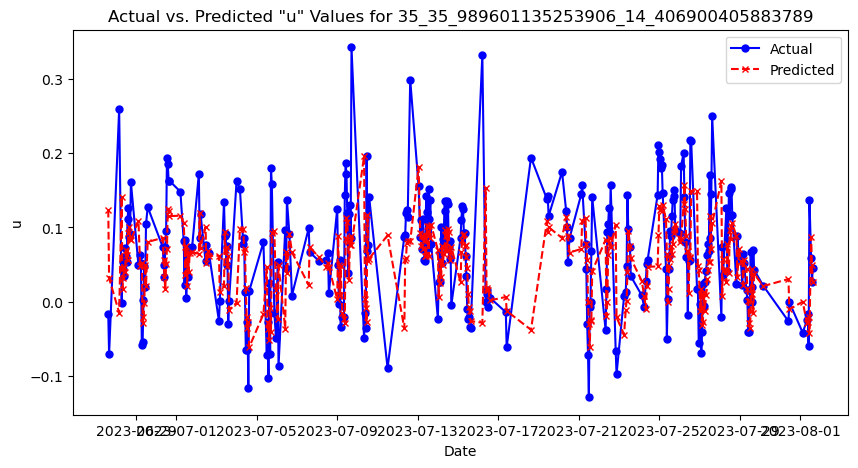

Model tarining & evaluation completed for file: 35_35_989601135253906_14_406900405883789.csv

Processing file: 36_36_01190185546875_14_366399765014648.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
29/29 [==============================] - ETA: 0s - loss: 0.0106 - mean_absolute_error: 0.0821INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


29/29 [==============================] - 77s 2s/step - loss: 0.0106 - mean_absolute_error: 0.0821 - val_loss: 0.0154 - val_mean_absolute_error: 0.1021
Epoch 2/100
29/29 [==============================] - ETA: 0s - loss: 0.0099 - mean_absolute_error: 0.0793INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


29/29 [==============================] - 68s 2s/step - loss: 0.0099 - mean_absolute_error: 0.0793 - val_loss: 0.0130 - val_mean_absolute_error: 0.0923
Epoch 3/100
29/29 [==============================] - ETA: 0s - loss: 0.0090 - mean_absolute_error: 0.0749INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


29/29 [==============================] - 70s 2s/step - loss: 0.0090 - mean_absolute_error: 0.0749 - val_loss: 0.0118 - val_mean_absolute_error: 0.0883
Epoch 4/100
29/29 [==============================] - ETA: 0s - loss: 0.0089 - mean_absolute_error: 0.0750INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


29/29 [==============================] - 69s 2s/step - loss: 0.0089 - mean_absolute_error: 0.0750 - val_loss: 0.0114 - val_mean_absolute_error: 0.0868
Epoch 5/100
29/29 [==============================] - ETA: 0s - loss: 0.0083 - mean_absolute_error: 0.0726INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


29/29 [==============================] - 68s 2s/step - loss: 0.0083 - mean_absolute_error: 0.0726 - val_loss: 0.0103 - val_mean_absolute_error: 0.0825
Epoch 6/100
29/29 [==============================] - ETA: 0s - loss: 0.0082 - mean_absolute_error: 0.0719INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


29/29 [==============================] - 69s 2s/step - loss: 0.0082 - mean_absolute_error: 0.0719 - val_loss: 0.0096 - val_mean_absolute_error: 0.0799
Epoch 7/100
29/29 [==============================] - ETA: 0s - loss: 0.0076 - mean_absolute_error: 0.0682INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


29/29 [==============================] - 68s 2s/step - loss: 0.0076 - mean_absolute_error: 0.0682 - val_loss: 0.0084 - val_mean_absolute_error: 0.0752
Epoch 8/100
29/29 [==============================] - ETA: 0s - loss: 0.0073 - mean_absolute_error: 0.0671INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


29/29 [==============================] - 73s 3s/step - loss: 0.0073 - mean_absolute_error: 0.0671 - val_loss: 0.0079 - val_mean_absolute_error: 0.0726
Epoch 9/100
29/29 [==============================] - ETA: 0s - loss: 0.0069 - mean_absolute_error: 0.0649INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


29/29 [==============================] - 73s 3s/step - loss: 0.0069 - mean_absolute_error: 0.0649 - val_loss: 0.0074 - val_mean_absolute_error: 0.0710
Epoch 10/100
29/29 [==============================] - ETA: 0s - loss: 0.0062 - mean_absolute_error: 0.0616INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


29/29 [==============================] - 71s 2s/step - loss: 0.0062 - mean_absolute_error: 0.0616 - val_loss: 0.0069 - val_mean_absolute_error: 0.0684
Epoch 11/100
29/29 [==============================] - ETA: 0s - loss: 0.0062 - mean_absolute_error: 0.0604INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


29/29 [==============================] - 71s 2s/step - loss: 0.0062 - mean_absolute_error: 0.0604 - val_loss: 0.0064 - val_mean_absolute_error: 0.0658
Epoch 12/100
29/29 [==============================] - ETA: 0s - loss: 0.0058 - mean_absolute_error: 0.0583INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


29/29 [==============================] - 71s 2s/step - loss: 0.0058 - mean_absolute_error: 0.0583 - val_loss: 0.0060 - val_mean_absolute_error: 0.0632
Epoch 13/100
29/29 [==============================] - ETA: 0s - loss: 0.0055 - mean_absolute_error: 0.0568INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


29/29 [==============================] - 71s 2s/step - loss: 0.0055 - mean_absolute_error: 0.0568 - val_loss: 0.0058 - val_mean_absolute_error: 0.0620
Epoch 14/100
29/29 [==============================] - ETA: 0s - loss: 0.0053 - mean_absolute_error: 0.0553INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


29/29 [==============================] - 71s 2s/step - loss: 0.0053 - mean_absolute_error: 0.0553 - val_loss: 0.0054 - val_mean_absolute_error: 0.0580
Epoch 15/100
29/29 [==============================] - ETA: 0s - loss: 0.0051 - mean_absolute_error: 0.0541INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


29/29 [==============================] - 70s 2s/step - loss: 0.0051 - mean_absolute_error: 0.0541 - val_loss: 0.0050 - val_mean_absolute_error: 0.0562
Epoch 16/100
29/29 [==============================] - ETA: 0s - loss: 0.0048 - mean_absolute_error: 0.0520INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


29/29 [==============================] - 69s 2s/step - loss: 0.0048 - mean_absolute_error: 0.0520 - val_loss: 0.0049 - val_mean_absolute_error: 0.0548
Epoch 17/100
29/29 [==============================] - 59s 2s/step - loss: 0.0044 - mean_absolute_error: 0.0492 - val_loss: 0.0049 - val_mean_absolute_error: 0.0542
Epoch 18/100
29/29 [==============================] - ETA: 0s - loss: 0.0047 - mean_absolute_error: 0.0518INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


29/29 [==============================] - 71s 2s/step - loss: 0.0047 - mean_absolute_error: 0.0518 - val_loss: 0.0045 - val_mean_absolute_error: 0.0513
Epoch 19/100
29/29 [==============================] - ETA: 0s - loss: 0.0046 - mean_absolute_error: 0.0501INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


29/29 [==============================] - 70s 2s/step - loss: 0.0046 - mean_absolute_error: 0.0501 - val_loss: 0.0045 - val_mean_absolute_error: 0.0518
Epoch 20/100
29/29 [==============================] - ETA: 0s - loss: 0.0043 - mean_absolute_error: 0.0487INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


29/29 [==============================] - 70s 2s/step - loss: 0.0043 - mean_absolute_error: 0.0487 - val_loss: 0.0044 - val_mean_absolute_error: 0.0509
Epoch 21/100
29/29 [==============================] - 60s 2s/step - loss: 0.0045 - mean_absolute_error: 0.0497 - val_loss: 0.0045 - val_mean_absolute_error: 0.0519
Epoch 22/100
29/29 [==============================] - ETA: 0s - loss: 0.0043 - mean_absolute_error: 0.0483INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


29/29 [==============================] - 69s 2s/step - loss: 0.0043 - mean_absolute_error: 0.0483 - val_loss: 0.0044 - val_mean_absolute_error: 0.0509
Epoch 23/100
29/29 [==============================] - ETA: 0s - loss: 0.0043 - mean_absolute_error: 0.0486INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


29/29 [==============================] - 70s 2s/step - loss: 0.0043 - mean_absolute_error: 0.0486 - val_loss: 0.0043 - val_mean_absolute_error: 0.0501
Epoch 24/100
29/29 [==============================] - 60s 2s/step - loss: 0.0044 - mean_absolute_error: 0.0494 - val_loss: 0.0044 - val_mean_absolute_error: 0.0500
Epoch 25/100
29/29 [==============================] - 59s 2s/step - loss: 0.0045 - mean_absolute_error: 0.0502 - val_loss: 0.0044 - val_mean_absolute_error: 0.0506
Epoch 26/100
29/29 [==============================] - 59s 2s/step - loss: 0.0042 - mean_absolute_error: 0.0488 - val_loss: 0.0045 - val_mean_absolute_error: 0.0515
Epoch 27/100
29/29 [==============================] - 60s 2s/step - loss: 0.0043 - mean_absolute_error: 0.0485 - val_loss: 0.0044 - val_mean_absolute_error: 0.0496
Epoch 28/100
29/29 [==============================] - 59s 2s/step - loss: 0.0043 - mean_absolute_error: 0.0488 - val_loss: 0.0044 - val_mean_absolute_error: 0.0511
Epoch 29/100
29/29 [=========

INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


29/29 [==============================] - 71s 2s/step - loss: 0.0042 - mean_absolute_error: 0.0475 - val_loss: 0.0043 - val_mean_absolute_error: 0.0497
Epoch 32/100
29/29 [==============================] - 60s 2s/step - loss: 0.0043 - mean_absolute_error: 0.0478 - val_loss: 0.0044 - val_mean_absolute_error: 0.0504
Epoch 33/100
29/29 [==============================] - 60s 2s/step - loss: 0.0041 - mean_absolute_error: 0.0476 - val_loss: 0.0044 - val_mean_absolute_error: 0.0516
Epoch 34/100
29/29 [==============================] - 60s 2s/step - loss: 0.0042 - mean_absolute_error: 0.0474 - val_loss: 0.0044 - val_mean_absolute_error: 0.0509
Epoch 35/100
29/29 [==============================] - 60s 2s/step - loss: 0.0040 - mean_absolute_error: 0.0468 - val_loss: 0.0044 - val_mean_absolute_error: 0.0509
Epoch 36/100
29/29 [==============================] - ETA: 0s - loss: 0.0040 - mean_absolute_error: 0.0471INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_3

INFO:tensorflow:Assets written to: Data/saved_models/models_u\36_36_01190185546875_14_366399765014648\assets


29/29 [==============================] - 70s 2s/step - loss: 0.0040 - mean_absolute_error: 0.0471 - val_loss: 0.0043 - val_mean_absolute_error: 0.0504
Epoch 37/100
29/29 [==============================] - 60s 2s/step - loss: 0.0041 - mean_absolute_error: 0.0468 - val_loss: 0.0043 - val_mean_absolute_error: 0.0505
Epoch 38/100
29/29 [==============================] - 60s 2s/step - loss: 0.0043 - mean_absolute_error: 0.0482 - val_loss: 0.0044 - val_mean_absolute_error: 0.0504
Epoch 39/100
29/29 [==============================] - 60s 2s/step - loss: 0.0042 - mean_absolute_error: 0.0482 - val_loss: 0.0044 - val_mean_absolute_error: 0.0508
Epoch 40/100
29/29 [==============================] - 60s 2s/step - loss: 0.0042 - mean_absolute_error: 0.0476 - val_loss: 0.0043 - val_mean_absolute_error: 0.0499
Epoch 41/100
29/29 [==============================] - 60s 2s/step - loss: 0.0042 - mean_absolute_error: 0.0482 - val_loss: 0.0044 - val_mean_absolute_error: 0.0511
Epoch 42/100
29/29 [=========

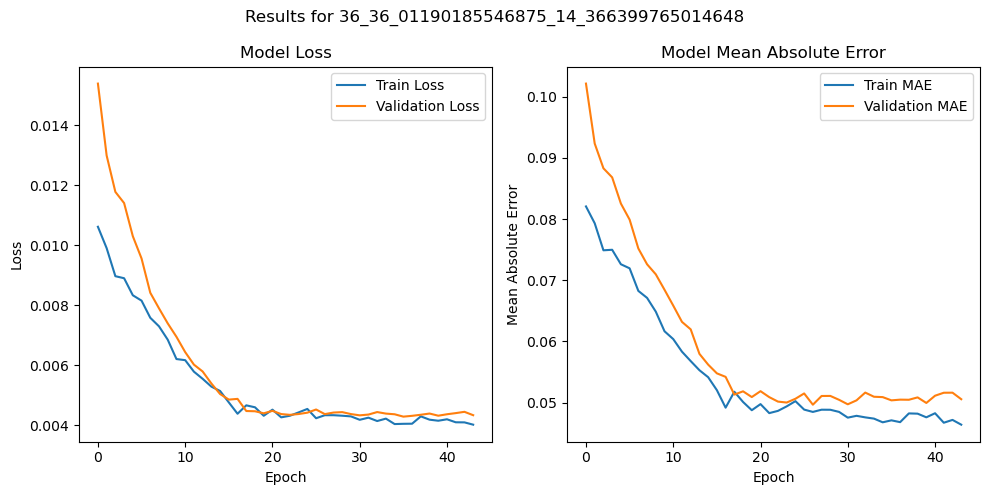

6/6 [==============================] - 6s 769ms/step

Test set Evaluation metrics for file: 36_36_01190185546875_14_366399765014648
Mean Squared Error (MSE): 0.002780684950523724
Mean Absolute Error (MAE): 0.041002630950536724
Root Mean Squared Error (RMSE): 0.052732200319384775



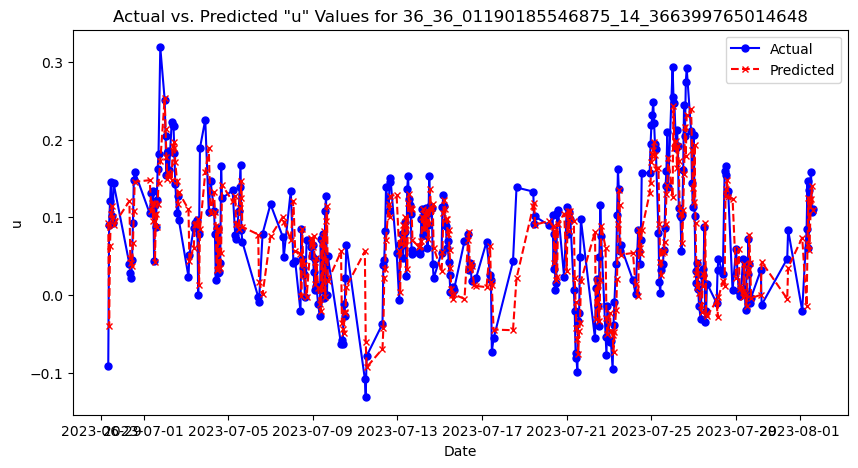

Model tarining & evaluation completed for file: 36_36_01190185546875_14_366399765014648.csv

Processing file: 37_35_96730041503906_14_447500228881836.csv



C:\Users\markd\AppData\Local\Temp\ipykernel_7428\2827399679.py:36: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)


Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.0166 - mean_absolute_error: 0.1024INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_447500228881836\assets


21/21 [==============================] - 61s 3s/step - loss: 0.0166 - mean_absolute_error: 0.1024 - val_loss: 0.0159 - val_mean_absolute_error: 0.1027
Epoch 2/100
21/21 [==============================] - 43s 2s/step - loss: 0.0150 - mean_absolute_error: 0.0978 - val_loss: 0.0162 - val_mean_absolute_error: 0.1030
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.0154 - mean_absolute_error: 0.0989INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_447500228881836\assets


21/21 [==============================] - 53s 3s/step - loss: 0.0154 - mean_absolute_error: 0.0989 - val_loss: 0.0149 - val_mean_absolute_error: 0.0974
Epoch 4/100
21/21 [==============================] - 43s 2s/step - loss: 0.0144 - mean_absolute_error: 0.0950 - val_loss: 0.0168 - val_mean_absolute_error: 0.1060
Epoch 5/100
21/21 [==============================] - ETA: 0s - loss: 0.0141 - mean_absolute_error: 0.0939INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_447500228881836\assets


21/21 [==============================] - 55s 3s/step - loss: 0.0141 - mean_absolute_error: 0.0939 - val_loss: 0.0145 - val_mean_absolute_error: 0.0966
Epoch 6/100
21/21 [==============================] - 44s 2s/step - loss: 0.0136 - mean_absolute_error: 0.0919 - val_loss: 0.0156 - val_mean_absolute_error: 0.1008
Epoch 7/100
21/21 [==============================] - 44s 2s/step - loss: 0.0143 - mean_absolute_error: 0.0945 - val_loss: 0.0165 - val_mean_absolute_error: 0.1053
Epoch 8/100
21/21 [==============================] - 43s 2s/step - loss: 0.0138 - mean_absolute_error: 0.0922 - val_loss: 0.0147 - val_mean_absolute_error: 0.0982
Epoch 9/100
21/21 [==============================] - ETA: 0s - loss: 0.0135 - mean_absolute_error: 0.0911INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_447500228881836\assets


21/21 [==============================] - 53s 3s/step - loss: 0.0135 - mean_absolute_error: 0.0911 - val_loss: 0.0142 - val_mean_absolute_error: 0.0958
Epoch 10/100
21/21 [==============================] - 44s 2s/step - loss: 0.0132 - mean_absolute_error: 0.0900 - val_loss: 0.0148 - val_mean_absolute_error: 0.0980
Epoch 11/100
21/21 [==============================] - 43s 2s/step - loss: 0.0130 - mean_absolute_error: 0.0894 - val_loss: 0.0143 - val_mean_absolute_error: 0.0969
Epoch 12/100
21/21 [==============================] - 43s 2s/step - loss: 0.0127 - mean_absolute_error: 0.0878 - val_loss: 0.0147 - val_mean_absolute_error: 0.0978
Epoch 13/100
21/21 [==============================] - ETA: 0s - loss: 0.0128 - mean_absolute_error: 0.0878INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_447500228881836\assets


21/21 [==============================] - 53s 3s/step - loss: 0.0128 - mean_absolute_error: 0.0878 - val_loss: 0.0139 - val_mean_absolute_error: 0.0940
Epoch 14/100
21/21 [==============================] - 43s 2s/step - loss: 0.0123 - mean_absolute_error: 0.0872 - val_loss: 0.0148 - val_mean_absolute_error: 0.0981
Epoch 15/100
21/21 [==============================] - 43s 2s/step - loss: 0.0129 - mean_absolute_error: 0.0884 - val_loss: 0.0155 - val_mean_absolute_error: 0.0997
Epoch 16/100
21/21 [==============================] - 43s 2s/step - loss: 0.0124 - mean_absolute_error: 0.0866 - val_loss: 0.0173 - val_mean_absolute_error: 0.1061
Epoch 17/100
21/21 [==============================] - 43s 2s/step - loss: 0.0120 - mean_absolute_error: 0.0851 - val_loss: 0.0139 - val_mean_absolute_error: 0.0942
Epoch 18/100
21/21 [==============================] - ETA: 0s - loss: 0.0114 - mean_absolute_error: 0.0830INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_4

INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_447500228881836\assets


21/21 [==============================] - 53s 3s/step - loss: 0.0114 - mean_absolute_error: 0.0830 - val_loss: 0.0135 - val_mean_absolute_error: 0.0924
Epoch 19/100
21/21 [==============================] - 43s 2s/step - loss: 0.0118 - mean_absolute_error: 0.0839 - val_loss: 0.0144 - val_mean_absolute_error: 0.0961
Epoch 20/100
21/21 [==============================] - 43s 2s/step - loss: 0.0116 - mean_absolute_error: 0.0839 - val_loss: 0.0142 - val_mean_absolute_error: 0.0951
Epoch 21/100
21/21 [==============================] - 43s 2s/step - loss: 0.0111 - mean_absolute_error: 0.0819 - val_loss: 0.0141 - val_mean_absolute_error: 0.0949
Epoch 22/100
21/21 [==============================] - ETA: 0s - loss: 0.0111 - mean_absolute_error: 0.0815INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_447500228881836\assets


21/21 [==============================] - 55s 3s/step - loss: 0.0111 - mean_absolute_error: 0.0815 - val_loss: 0.0132 - val_mean_absolute_error: 0.0903
Epoch 23/100
21/21 [==============================] - ETA: 0s - loss: 0.0106 - mean_absolute_error: 0.0793INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_447500228881836\assets


21/21 [==============================] - 53s 3s/step - loss: 0.0106 - mean_absolute_error: 0.0793 - val_loss: 0.0128 - val_mean_absolute_error: 0.0889
Epoch 24/100
21/21 [==============================] - ETA: 0s - loss: 0.0101 - mean_absolute_error: 0.0773INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_447500228881836\assets


21/21 [==============================] - 53s 3s/step - loss: 0.0101 - mean_absolute_error: 0.0773 - val_loss: 0.0127 - val_mean_absolute_error: 0.0877
Epoch 25/100
21/21 [==============================] - ETA: 0s - loss: 0.0098 - mean_absolute_error: 0.0759INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_447500228881836\assets


21/21 [==============================] - 53s 3s/step - loss: 0.0098 - mean_absolute_error: 0.0759 - val_loss: 0.0120 - val_mean_absolute_error: 0.0845
Epoch 26/100
21/21 [==============================] - ETA: 0s - loss: 0.0097 - mean_absolute_error: 0.0750INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_447500228881836\assets


21/21 [==============================] - 53s 3s/step - loss: 0.0097 - mean_absolute_error: 0.0750 - val_loss: 0.0118 - val_mean_absolute_error: 0.0837
Epoch 27/100
21/21 [==============================] - ETA: 0s - loss: 0.0094 - mean_absolute_error: 0.0731INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_447500228881836\assets


21/21 [==============================] - 58s 3s/step - loss: 0.0094 - mean_absolute_error: 0.0731 - val_loss: 0.0113 - val_mean_absolute_error: 0.0809
Epoch 28/100
21/21 [==============================] - ETA: 0s - loss: 0.0091 - mean_absolute_error: 0.0718INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_447500228881836\assets


21/21 [==============================] - 55s 3s/step - loss: 0.0091 - mean_absolute_error: 0.0718 - val_loss: 0.0112 - val_mean_absolute_error: 0.0821
Epoch 29/100
21/21 [==============================] - ETA: 0s - loss: 0.0090 - mean_absolute_error: 0.0717INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_447500228881836\assets


21/21 [==============================] - 55s 3s/step - loss: 0.0090 - mean_absolute_error: 0.0717 - val_loss: 0.0110 - val_mean_absolute_error: 0.0793
Epoch 30/100
21/21 [==============================] - ETA: 0s - loss: 0.0089 - mean_absolute_error: 0.0704INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_447500228881836\assets


21/21 [==============================] - 55s 3s/step - loss: 0.0089 - mean_absolute_error: 0.0704 - val_loss: 0.0108 - val_mean_absolute_error: 0.0778
Epoch 31/100
21/21 [==============================] - 44s 2s/step - loss: 0.0089 - mean_absolute_error: 0.0700 - val_loss: 0.0109 - val_mean_absolute_error: 0.0787
Epoch 32/100
21/21 [==============================] - ETA: 0s - loss: 0.0086 - mean_absolute_error: 0.0697INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_447500228881836\assets


21/21 [==============================] - 55s 3s/step - loss: 0.0086 - mean_absolute_error: 0.0697 - val_loss: 0.0104 - val_mean_absolute_error: 0.0772
Epoch 33/100
21/21 [==============================] - 46s 2s/step - loss: 0.0088 - mean_absolute_error: 0.0704 - val_loss: 0.0108 - val_mean_absolute_error: 0.0781
Epoch 34/100
21/21 [==============================] - 46s 2s/step - loss: 0.0088 - mean_absolute_error: 0.0706 - val_loss: 0.0106 - val_mean_absolute_error: 0.0772
Epoch 35/100
21/21 [==============================] - 46s 2s/step - loss: 0.0084 - mean_absolute_error: 0.0685 - val_loss: 0.0109 - val_mean_absolute_error: 0.0795
Epoch 36/100
21/21 [==============================] - ETA: 0s - loss: 0.0087 - mean_absolute_error: 0.0698INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_447500228881836\assets


INFO:tensorflow:Assets written to: Data/saved_models/models_u\37_35_96730041503906_14_447500228881836\assets


21/21 [==============================] - 58s 3s/step - loss: 0.0087 - mean_absolute_error: 0.0698 - val_loss: 0.0104 - val_mean_absolute_error: 0.0767
Epoch 37/100
21/21 [==============================] - 46s 2s/step - loss: 0.0084 - mean_absolute_error: 0.0680 - val_loss: 0.0112 - val_mean_absolute_error: 0.0796
Epoch 38/100
21/21 [==============================] - 45s 2s/step - loss: 0.0084 - mean_absolute_error: 0.0686 - val_loss: 0.0111 - val_mean_absolute_error: 0.0796
Epoch 39/100
21/21 [==============================] - 46s 2s/step - loss: 0.0086 - mean_absolute_error: 0.0692 - val_loss: 0.0111 - val_mean_absolute_error: 0.0810
Epoch 40/100
21/21 [==============================] - 45s 2s/step - loss: 0.0085 - mean_absolute_error: 0.0691 - val_loss: 0.0110 - val_mean_absolute_error: 0.0788
Epoch 41/100
21/21 [==============================] - 45s 2s/step - loss: 0.0085 - mean_absolute_error: 0.0682 - val_loss: 0.0111 - val_mean_absolute_error: 0.0800
Epoch 42/100
21/21 [=========

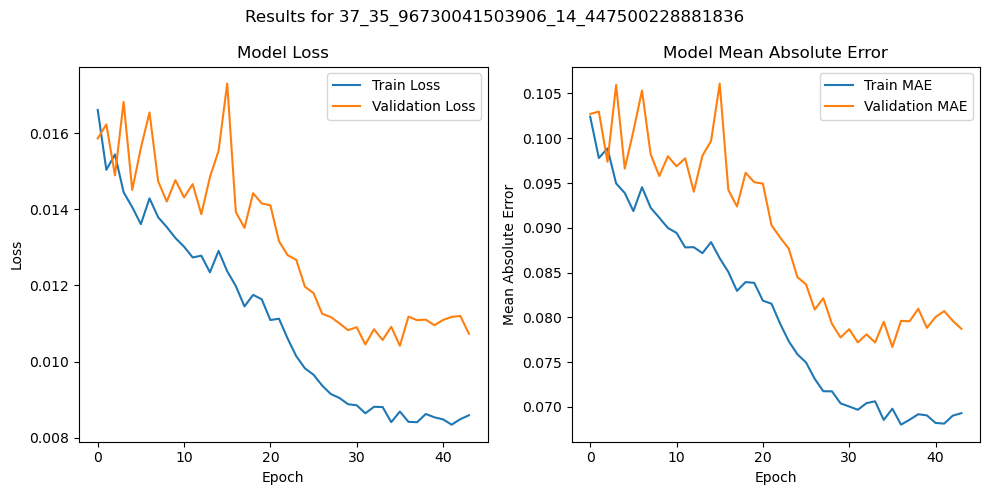

4/4 [==============================] - 5s 818ms/step

Test set Evaluation metrics for file: 37_35_96730041503906_14_447500228881836
Mean Squared Error (MSE): 0.006867775227664282
Mean Absolute Error (MAE): 0.057931289509855564
Root Mean Squared Error (RMSE): 0.08287204129056



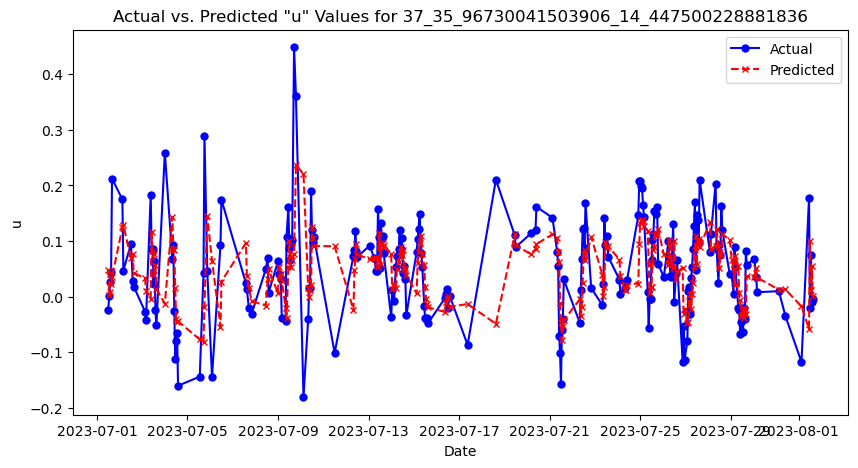

Model tarining & evaluation completed for file: 37_35_96730041503906_14_447500228881836.csv



In [10]:
# Directory for saving models 
model_save_directory = "Data/saved_models/LSTM/models_u"
os.makedirs(model_save_directory, exist_ok=True)

# Function to extract the numerical index from the filename
def extract_index(filename):
    # Index is always before the first underscore
    index_part = filename.split("_")[0]
    try:
        return int(index_part)
    except ValueError:
        # In case of any error, return a large number to sort this file at the end
        return float('inf')

# List all CSV files in the directory and sort them numerically based on the index
csv_files = sorted([f for f in os.listdir(save_directory) if f.endswith('.csv')], key=extract_index)

print(csv_files,"\n")
print("="*175)

# Set up early stopping callback to prevent overfitting
early_stopping = EarlyStopping(monitor='val_loss', 
                               patience=8, 
                               mode='min', 
                               restore_best_weights=True)

# Loop through each CSV file in the directory
for file in csv_files:
    print("="*175)
    print(f"Processing file: {file}\n")

    # Load the dataset from the CSV file
    df = pd.read_csv(os.path.join(save_directory, file))

    # Convert the 'time' column to datetime object and set it as the index 
    df['time'] = pd.to_datetime(df['time'], infer_datetime_format=True)
    df.set_index('time', inplace=True)

    # Select 'u' and 'v' columns as input features 
    df_input = df[['u', 'v']]
    features = df_input.to_numpy()

    # Set the 'u' column as the target variable 
    target = df_input['u'].values

    # Splitting Data into Train, Validation, and Test sets (70-15-15 split)
    X_train, X_temp, y_train, y_temp = train_test_split(features, target, test_size=0.3, random_state=123, shuffle=False)
    X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=123, shuffle=False)

    # Time series generator parameters
    win_length = 72 # 3 Days
    batch_size = 64 # 64 samples per batch
    num_features = 2 # 'u' and 'v' columns

    # Creating the time series generators for the training, validation, and test sets
    train_generator = TimeseriesGenerator(X_train, y_train, length=win_length, sampling_rate=1, batch_size=batch_size)
    val_generator = TimeseriesGenerator(X_val, y_val, length=win_length, sampling_rate=1, batch_size=batch_size)
    test_generator = TimeseriesGenerator(X_test, y_test, length=win_length, sampling_rate=1, batch_size=batch_size)

    # Building the LSTM Model Architecture
    model = Sequential([
        LSTM(256, input_shape=(win_length, num_features), return_sequences=True),
        Dropout(0.3),
        LSTM(128, return_sequences=True),
        Dropout(0.3),
        LSTM(128, return_sequences=True),
        Dropout(0.3),
        LSTM(64),
        Dense(64, activation='relu'),
        Dropout(0.3),
        Dense(32, activation='relu'),
        Dropout(0.2),
        Dense(1)
    ])

    # Compile the model 
    model.compile(loss=MeanSquaredError(), optimizer=Adam(learning_rate=0.001), metrics=[MeanAbsoluteError()])

    # Define ModelCheckpoint callback to save the best model during training
    model_checkpoint = ModelCheckpoint(filepath=f"{model_save_directory}/{file[:-4]}",
                                       save_best_only=True, 
                                       monitor='val_loss', 
                                       mode='min', 
                                       save_format='tf',
                                       verbose=0)

    # Fit the model to the training data
    history = model.fit(train_generator, epochs=100, validation_data=val_generator, shuffle=False, callbacks=[early_stopping, model_checkpoint])

    # Determine the epoch number at best performance
    best_epoch = early_stopping.stopped_epoch - early_stopping.patience

    # Print the best epoch number and the best validation loss achieved
    print("="*175)
    print(f"Training stopped at epoch: {best_epoch + 1}")
    print(f"Best validation loss achieved at epoch: {best_epoch + 1}\n")

    # Plot training and validation loss values 
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')

    # Plot training and validation mean absolute error values
    plt.subplot(1, 2, 2)
    plt.plot(history.history['mean_absolute_error'], label='Train MAE')
    plt.plot(history.history['val_mean_absolute_error'], label='Validation MAE')
    plt.title('Model Mean Absolute Error')
    plt.ylabel('Mean Absolute Error')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')

    # Display the plots 
    plt.suptitle(f'Results for {file[:-4]}')
    plt.tight_layout()
    plt.show()

    # Generate predictions for the test data 
    predictions = model.predict(test_generator)
    test_indexes = df.index[-len(predictions):]

    # Prepare the final DataFrame for plotting and analysis 
    df_final = pd.DataFrame(df.loc[test_indexes])
    df_final['u_pred'] = predictions.flatten()

    # Calculate evaluation metrics  
    mse = mean_squared_error(df_final['u'], df_final['u_pred'])
    mae = mean_absolute_error(df_final['u'], df_final['u_pred'])
    rmse = np.sqrt(mse)

    # Print evaluation metrics
    print(f'\nTest set Evaluation metrics for file: {file[:-4]}')
    print(f'Mean Squared Error (MSE): {mse}')
    print(f'Mean Absolute Error (MAE): {mae}')
    print(f'Root Mean Squared Error (RMSE): {rmse}\n')

    # Plot Actual vs. Predicted 'u' Values
    plt.figure(figsize=(10, 5))
    plt.plot(df_final.index, df_final['u'], label='Actual', color='blue', marker='o', linestyle='-', markersize=5)
    plt.plot(df_final.index, df_final['u_pred'], label='Predicted', color='red', marker='x', linestyle='--', markersize=5)
    plt.title(f'Actual vs. Predicted "u" Values for {file[:-4]}')  
    plt.xlabel('Date') 
    plt.ylabel('u')
    plt.legend()
    plt.show()
    
    print("="*175)
    print(f"Model tarining & evaluation completed for file: {file}")
    print("="*175, "\n")

## Making Real-life Predictions from Data (Simulation)
This section outlines the process of making predictions based on real-life data collected over a span of three days. The goal is to use data from the previous three days to simulate a prediction of the sea surface currents for the 4th of August, demonstrating the application in real-world scenarios.

### Extract 3 Days of Inputs for Each Coordinate Pair

- **Data Loading**: Retrieve sea surface current data from August 1, 2023, to August 3, 2023, and load it.
- **Dataframe Conversion**: Transform the loaded NetCDF data into a pandas DataFrame.
- **Data Cleaning**: Remove unnecessary columns.
- **Data Organization**: Set up a directory specifically for storing the processed data files.
- **Data Processing**:
    - For each predefined pair of coordinates, isolate the data corresponding to that location.
    - Ensure the data is in order to maintain the sequence integrity.
    - Apply cubic spline interpolation to fill in any missing 'u' and 'v' values, ensuring a continuous dataset.
- **File Saving**: Format latitude and longitude information for compatibility with filenames and save the individual data frames as seperate CSV files. Each file is uniquely named to correspond with its geographic location.

In [12]:
# Load the dataset (from August 1, 2023 till August 3, 2023) 
input_netcdf_path = "Data/model_IO/3_day_input_SSC_Data.nc"
dataset = xr.open_dataset(input_netcdf_path)

# Convert the dataset to a pandas DataFrame and reset the index
df = dataset.to_dataframe().reset_index()

# Drop columns from the DataFrame that are not needed
df = df.drop(columns=['stdu', 'stdv', 'cov', 'velo', 'head'])

# Directory to save the files 
input_data_directory = "Data/3_day_input_data_frames"
os.makedirs(input_data_directory, exist_ok=True)

# Loop through each pair of coordinates 
for index, (lon, lat) in enumerate(coordinates_inside, start=1):
    # Extract data for the specific coordinates and copy it
    df_specific = df[(df['lat'] == lat) & (df['lon'] == lon)].copy()

    # Ensure the DataFrame is sorted by time 
    df_specific.sort_values('time', inplace=True)

    # Interpolate NaN values using cubic spline interpolation
    df_specific.loc[:, ['u', 'v']] = df_specific[['u', 'v']].interpolate(method='spline', order=3)

    # After interpolation, if there are still NaNs at the beginning or the end, fill them in using the nearest value
    df_specific.loc[:, ['u', 'v']] = df_specific[['u', 'v']].fillna(method='bfill').fillna(method='ffill')

    # Replace decimal points with underscores in lat and lon for the filename
    lat_str = str(lat).replace('.', '_')
    lon_str = str(lon).replace('.', '_')

    # Save to CSV file with a unique filename
    filename = f"{index}_{lat_str}_{lon_str}_3_day.csv"
    filepath = os.path.join(input_data_directory, filename)
    df_specific.to_csv(filepath, index=False)
    print(f"Saved 3-day data for (lat: {lat}, lon: {lon}) as {filename}")
    
print("="*175)

Saved 3-day data for (lat: 35.90060043334961, lon: 14.569199562072754) as 1_35_90060043334961_14_569199562072754_3_day.csv
Saved 3-day data for (lat: 35.92279815673828, lon: 14.569199562072754) as 2_35_92279815673828_14_569199562072754_3_day.csv
Saved 3-day data for (lat: 35.945098876953125, lon: 14.569199562072754) as 3_35_945098876953125_14_569199562072754_3_day.csv
Saved 3-day data for (lat: 35.96730041503906, lon: 14.528599739074707) as 4_35_96730041503906_14_528599739074707_3_day.csv
Saved 3-day data for (lat: 35.96730041503906, lon: 14.569199562072754) as 5_35_96730041503906_14_569199562072754_3_day.csv
Saved 3-day data for (lat: 35.989601135253906, lon: 14.447500228881836) as 6_35_989601135253906_14_447500228881836_3_day.csv
Saved 3-day data for (lat: 35.989601135253906, lon: 14.48799991607666) as 7_35_989601135253906_14_48799991607666_3_day.csv
Saved 3-day data for (lat: 35.989601135253906, lon: 14.528599739074707) as 8_35_989601135253906_14_528599739074707_3_day.csv
Saved 3-da

### Extract 1 day of actaul data for each coordinate pair to use for comparison 

- **Data Loading**: Access actual sea surface current data for August 4th, 2023, to compare against the predictions.
- **Dataframe Conversion**: Transform the NetCDF data into a pandas DataFrame.
- **Data Cleaning**: Remove unnecessary columns.
- **File Organization**: Establish a directory specifically for storing actual data files.
- **Data Processing**:
    - For each predefined pair of coordinates, isolate the data corresponding to that location.
    - Sort this data to maintain the correct time sequence.
    - Fill in missing 'u' and 'v' data points using cubic spline interpolation.
- **File Saving**: Adjust latitude and longitude information for filename compatibility and save the processed data frames as seperate CSV files. Each file is distinctly named according to its geographic location.

In [13]:
# Load the dataset for the next day (August 4th, 2023) 
actual_netcdf_path = "Data/model_IO/1_day_actual_4th_SSC_Data.nc"
actual_dataset = xr.open_dataset(actual_netcdf_path)

# Convert the dataset to a pandas DataFrame and reset index
actual_df = actual_dataset.to_dataframe().reset_index()

# Drop columns from the DataFrame that are not needed
actual_df = actual_df.drop(columns=['stdu', 'stdv', 'cov', 'velo', 'head'])

# Directory to save the files
actual_data_directory = "Data/1_day_actual_data_frames"
os.makedirs(actual_data_directory, exist_ok=True)

# Loop through each pair of coordinates
for index, (lon, lat) in enumerate(coordinates_inside, start=1):
    actual_df_specific = actual_df[(actual_df['lat'] == lat) & (actual_df['lon'] == lon)].copy()
    actual_df_specific.sort_values('time', inplace=True)

    # Check if there are enough non-NaN values to apply cubic spline
    if actual_df_specific[['u', 'v']].count().min() >= 4:
        # Enough data points, use cubic spline
        actual_df_specific.loc[:, ['u', 'v']] = actual_df_specific[['u', 'v']].interpolate(method='spline', order=3)
    else:
        # Not enough data points, use linear interpolation
        actual_df_specific.loc[:, ['u', 'v']] = actual_df_specific[['u', 'v']].interpolate(method='linear')

    # Fill remaining NaNs at the beginning or end
    actual_df_specific.loc[:, ['u', 'v']] = actual_df_specific[['u', 'v']].fillna(method='bfill').fillna(method='ffill')

    # Replace decimal points with underscores in lat and lon for the filename
    lat_str = str(lat).replace('.', '_')
    lon_str = str(lon).replace('.', '_')

    # Save to CSV file with a unique filename
    filename = f"{index}_{lat_str}_{lon_str}_1_day.csv"
    filepath = os.path.join(actual_data_directory, filename)
    actual_df_specific.to_csv(filepath, index=False)
    print(f"Saved 1-day actual data for (lat: {lat}, lon: {lon}) as {filename}")

print("="*175)

Saved 1-day actual data for (lat: 35.90060043334961, lon: 14.569199562072754) as 1_35_90060043334961_14_569199562072754_1_day.csv
Saved 1-day actual data for (lat: 35.92279815673828, lon: 14.569199562072754) as 2_35_92279815673828_14_569199562072754_1_day.csv
Saved 1-day actual data for (lat: 35.945098876953125, lon: 14.569199562072754) as 3_35_945098876953125_14_569199562072754_1_day.csv
Saved 1-day actual data for (lat: 35.96730041503906, lon: 14.528599739074707) as 4_35_96730041503906_14_528599739074707_1_day.csv
Saved 1-day actual data for (lat: 35.96730041503906, lon: 14.569199562072754) as 5_35_96730041503906_14_569199562072754_1_day.csv
Saved 1-day actual data for (lat: 35.989601135253906, lon: 14.447500228881836) as 6_35_989601135253906_14_447500228881836_1_day.csv
Saved 1-day actual data for (lat: 35.989601135253906, lon: 14.48799991607666) as 7_35_989601135253906_14_48799991607666_1_day.csv
Saved 1-day actual data for (lat: 35.989601135253906, lon: 14.528599739074707) as 8_35

### Rolling Prediction for 24 hours

This section performs a series of rolling predictions, for a total of 24 hours, utilizing the previously trained models. 

- **Prediction Initialization**: Begin with an empty list to store outcomes from all models.
- **Prediction Span**: Set the forecast length to 24 hours (1 day).
- **Model Access**: Locate all saved LSTM models from the designated storage directory.
- **Iterative Forecasting**: For each saved model:
    - Retrieve the model's unique identifier.
    - Load the LSTM model.
    - Prepare input data derived from the preceding three days corresponding to each geographical location.
    - Execute sequential predictions where each hourly prediction informs the next, mirroring real-world forecasting scenarios. Specifically:
        - Utilize the model to forecast the next 'u' value based on the last 72 hours (3 days) of data.
        - Update the input feature set for the subsequent prediction by appending the newly predicted 'u' value while shifting the dataset forward by one hour, ensuring the model consistently receives fresh data reflecting the most recent conditions.
        - Importantly, while 'u' values are iteratively forecasted and updated, the 'v' values are directly drawn from the actual data for the corresponding hour, maintaining the model's contextual relevance to evolving environmental conditions.
- **Data Synchronization**: Align each prediction with actual data to evaluate the model's performance accurately.
    - Preprocess real data to match the model's input structure.
    - Record every hourly forecast alongside actual measurements for comparison.
- **Performance Metrics**: For each model, compute and report key metrics:
    - **MAE (Mean Absolute Error)**: Reflects the average magnitude of errors between predicted and actual values, irrespective of direction.
    - **MSE (Mean Squared Error)**: Emphasizes larger errors by squaring them, thus penalizing more significant discrepancies more severely.
    - **RMSE (Root Mean Squared Error)**: Provides error magnitude in the same units as the predicted values.
- **Result Compilation**: Aggregate all hourly predictions across all models and locations into a single DataFrame, creating a comprehensive overview of the forecasting performance.
- **Save Predictions**: Store the combined predictions as a CSV file.

In [15]:
# Initialize a list to collect the results of all predictions
all_predictions = []

# Number of hours to predict into the future
n_future_hours = 24  

# Specify the directory where saved models are stored
model_directory = "Data/saved_models/LSTM/models_u"

win_length = 72 # 3 Days
num_features = 2 # 'u' and 'v' columns

# Function to extract the numerical index from the filename
def extract_index(filename):
    # Index is always before the first underscore
    index_part = filename.split("_")[0]
    try:
        return int(index_part)
    except ValueError:
        # In case of any error, return a large number to sort this file at the end
        return float('inf')

# Retrieve and sort paths for all saved models within the specified directory based on the numerical index
model_paths = sorted(
    [os.path.join(model_directory, filename).replace("\\", "/") for filename in os.listdir(model_directory)],
    key=lambda x: extract_index(os.path.basename(x).split('.')[0])
)

# Iterate over each model to perform predictions
for model_path in model_paths:
    # Extract model identifier from the file name
    model_id = os.path.basename(model_path).split('.')[0]  
    
    print("="*175)
    print(f"Processing model: {model_id}")
    print("="*175, "\n")

    # Load the saved model from its path
    model = load_model(model_path)

    # Define paths for input data and actual comparison data
    input_data_path = os.path.join(input_data_directory, f"{model_id}_3_day.csv").replace("\\", "/")
    actual_data_path = os.path.join(actual_data_directory, f"{model_id}_1_day.csv").replace("\\", "/")

    # Load and preprocess input data from CSV file
    input_data_df = pd.read_csv(input_data_path)
    input_data_df['time'] = pd.to_datetime(input_data_df['time'])
    features = input_data_df[['u', 'v']].values[-win_length:].reshape(1, win_length, num_features)

    # Initialize a list to store predictions for each hour
    predictions_u = []
    # Perform rolling predictions for the defined number of future hours
    for i in range(n_future_hours):
        # Predict the next value using the model
        current_prediction_u = model.predict(features, verbose=0)[0, 0]
        # Append the prediction to the list
        predictions_u.append(current_prediction_u)
        # Update the features for the next prediction step
        next_v_values = np.roll(features[0, :, 1], -1)
        # Use the most recent 'v' value
        next_v_values[-1] = features[0, -1, 1]  
        features = np.column_stack((np.roll(features[0, :, 0], -1), next_v_values)).reshape(1, win_length, num_features)
        # Set the last 'u' value to the current prediction
        features[0, -1, 0] = current_prediction_u  

    # Load and preprocess actual data for comparison
    actual_data_df = pd.read_csv(actual_data_path)
    actual_data_df['time'] = pd.to_datetime(actual_data_df['time'])
    actual_u_values = actual_data_df['u'].values[:n_future_hours]
    # Use the first row's lat and lon for location
    lat, lon = actual_data_df[['lat', 'lon']].values[0]  

    # Compile all predictions with their corresponding timestamps and locations
    for i, predicted_u in enumerate(predictions_u):
        all_predictions.append([actual_data_df['time'].iloc[i], lat, lon, predicted_u])

    # Calculate evaluation metrics 
    mae = mean_absolute_error(actual_u_values, predictions_u)
    mse = mean_squared_error(actual_u_values, predictions_u)
    rmse = np.sqrt(mse)

    # Display calculated metrics
    print(f"Metrics for model {model_id}:\nMAE = {mae}\nMSE = {mse}\nRMSE = {rmse}\n")

print("="*175)

# Convert the list of all predictions into a DataFrame
predictions_df = pd.DataFrame(all_predictions, columns=['time', 'lat', 'lon', 'u'])

# Save the compiled predictions to a CSV file
predictions_df.to_csv("Data/model_IO/LSTM/LSTM_merged_predictions_u.csv", index=False)
print("Saved merged predictions to 'Data/model_IO/LSTM/LSTM_merged_predictions_u.csv'")
print("="*175)

Processing model: 1_35_90060043334961_14_569199562072754

Metrics for model 1_35_90060043334961_14_569199562072754:
MAE = 0.06108554717145389
MSE = 0.00522638016930508
RMSE = 0.07229370767435489

Processing model: 2_35_92279815673828_14_569199562072754

Metrics for model 2_35_92279815673828_14_569199562072754:
MAE = 0.06540178835727949
MSE = 0.005102039683747252
RMSE = 0.07142856350051603

Processing model: 3_35_945098876953125_14_569199562072754

Metrics for model 3_35_945098876953125_14_569199562072754:
MAE = 0.27017779957200155
MSE = 0.09896044666532265
RMSE = 0.3145797937969358

Processing model: 4_35_96730041503906_14_528599739074707

Metrics for model 4_35_96730041503906_14_528599739074707:
MAE = 0.4191201531496805
MSE = 0.2624668417011826
RMSE = 0.5123151780897991

Processing model: 5_35_96730041503906_14_569199562072754

Metrics for model 5_35_96730041503906_14_569199562072754:
MAE = 0.23282335884857464
MSE = 0.06740287196305002
RMSE = 0.2596206308501888

Processing model: 6_35

---